In [ ]:
import pandas as pd
df = pd.read_csv("Modern_Periodic_Table.csv")

**`Phase Classification`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.impute import SimpleImputer
df = pd.read_csv("Modern_Periodic_Table.csv")
df.dropna(subset=['Melting Point', 'Boiling Point', 'Atomic Number', 'Atomic Mass', 'Density'], inplace=True)
features = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
            'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat']
X = df[features]
y = df['State']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)
classifier = RandomForestClassifier(random_state=42)
classifier.fit(X_train_imputed, y_train)
y_pred = classifier.predict(X_test_imputed)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

         Gas       1.00      1.00      1.00         2
       Solid       1.00      1.00      1.00        17

    accuracy                           1.00        19
   macro avg       1.00      1.00      1.00        19
weighted avg       1.00      1.00      1.00        19



**`Metallicity Classification`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.impute import SimpleImputer
df = pd.read_csv("Modern_Periodic_Table.csv")
df.dropna(subset=['Electrical Conductivity', 'Melting Point'], inplace=True)
features = ['Electrical Conductivity', 'Melting Point']
X = df[features]
df['Metallicity'] = pd.cut(df['Electrical Conductivity'], bins=[-float('inf'), 1000, float('inf')], labels=['Non-Metal', 'Metal'])
y = df['Metallicity']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)
classifier = RandomForestClassifier(random_state=42)
classifier.fit(X_train_imputed, y_train)
y_pred = classifier.predict(X_test_imputed)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 1.0

Classification Report:
              precision    recall  f1-score   support

       Metal       1.00      1.00      1.00        15
   Non-Metal       1.00      1.00      1.00         1

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16


Confusion Matrix:
[[15  0]
 [ 0  1]]


**`Chemical Family Classification`**

In [ ]:
pip install colorama

  Using cached colorama-0.4.6-py2.py3-none-any.whl (25 kB)


In [ ]:
import pandas as pd
from tabulate import tabulate
from colorama import Fore, Style
df = pd.read_csv("Modern_Periodic_Table.csv")
def classify_chemical_family(row):
    group = row['Group']
    period = row['Period']
    atomic_number = row['Atomic Number']
    if group == 1:
        return Fore.BLUE + 'Alkali Metals' + Style.RESET_ALL
    elif group == 2:
        return Fore.GREEN + 'Alkaline Earth Metals' + Style.RESET_ALL
    elif group == 17:
        return Fore.RED + 'Halogens' + Style.RESET_ALL
    elif group == 18:
        return Fore.MAGENTA + 'Noble Gases' + Style.RESET_ALL
    elif group >= 3 and group <= 12:
        return Fore.YELLOW + 'Transition Metals' + Style.RESET_ALL
    elif group >= 13 and group <= 16:
        if period == 2:
            return Fore.CYAN + 'Other Metals' + Style.RESET_ALL
        elif atomic_number in [5, 14, 32, 33, 51, 52, 84, 85]:
            return Fore.CYAN + 'Metalloids' + Style.RESET_ALL
        else:
            return Fore.CYAN + 'Other Non-Metals' + Style.RESET_ALL
    else:
        return 'Unknown'
df['Chemical Family'] = df.apply(classify_chemical_family, axis=1)
print(tabulate(df[['Element Name', 'Group', 'Period', 'Chemical Family']], headers='keys', tablefmt='grid'))

+-----+----------------+---------+----------+-----------------------+
|     | Element Name   |   Group |   Period | Chemical Family       |
+=====+================+=========+==========+=======================+
|   0 | Hydrogen       |       1 |        1 | Alkali Metals         |
+-----+----------------+---------+----------+-----------------------+
|   1 | Helium         |      18 |        1 | Noble Gases           |
+-----+----------------+---------+----------+-----------------------+
|   2 | Lithium        |       1 |        2 | Alkali Metals         |
+-----+----------------+---------+----------+-----------------------+
|   3 | Beryllium      |       2 |        2 | Alkaline Earth Metals |
+-----+----------------+---------+----------+-----------------------+
|   4 | Boron          |      13 |        2 | Other Metals          |
+-----+----------------+---------+----------+-----------------------+
|   5 | Carbon         |      14 |        2 | Other Metals          |
+-----+-------------

**`Reactivity Classification`**

In [ ]:
import pandas as pd
from tabulate import tabulate
df = pd.read_csv("Modern_Periodic_Table.csv")
def classify_reactivity(row):
    electronegativity = row['Electronegativity']
    electron_affinity = row['Electron Affinity']
    autoignition_point = row['Autoignition Point']
    if electronegativity > 1.5 and electron_affinity > 0 and autoignition_point > 400:
        return 'Reactive'
    else:
        return 'Non-Reactive'
df['Reactivity'] = df.apply(classify_reactivity, axis=1)
print(tabulate(df[['Element Name', 'Electronegativity', 'Electron Affinity', 'Reactivity']], headers='keys', tablefmt='grid'))

+-----+----------------+---------------------+---------------------+--------------+
|     | Element Name   |   Electronegativity |   Electron Affinity | Reactivity   |
+=====+================+=====================+=====================+==============+
|   0 | Hydrogen       |                2.2  |               72.8  | Reactive     |
+-----+----------------+---------------------+---------------------+--------------+
|   1 | Helium         |              nan    |                0    | Non-Reactive |
+-----+----------------+---------------------+---------------------+--------------+
|   2 | Lithium        |                0.98 |               59.6  | Non-Reactive |
+-----+----------------+---------------------+---------------------+--------------+
|   3 | Beryllium      |                1.57 |                0    | Non-Reactive |
+-----+----------------+---------------------+---------------------+--------------+
|   4 | Boron          |                2.04 |               26.7  | Non-Rea

**`Electrical Type Classification`**

In [ ]:
import pandas as pd
from tabulate import tabulate
df = pd.read_csv("Modern_Periodic_Table.csv")
def classify_electrical_type(row):
    electrical_conductivity = row['Electrical Conductivity']
    resistivity = row['Resistivity']
    if electrical_conductivity > 1e6:
        return 'Conductor'
    elif electrical_conductivity <= 1e6 and resistivity <= 1e-4:
        return 'Semiconductor'
    else:
        return 'Insulator'
df['Electrical Type'] = df.apply(classify_electrical_type, axis=1)
print(tabulate(df[['Element Name', 'Electrical Conductivity', 'Resistivity', 'Electrical Type']], headers='keys', tablefmt='grid'))

+-----+----------------+---------------------------+---------------+-------------------+
|     | Element Name   |   Electrical Conductivity |   Resistivity | Electrical Type   |
+=====+================+===========================+===============+===================+
|   0 | Hydrogen       |                 nan       |     nan       | Insulator         |
+-----+----------------+---------------------------+---------------+-------------------+
|   1 | Helium         |                 nan       |     nan       | Insulator         |
+-----+----------------+---------------------------+---------------+-------------------+
|   2 | Lithium        |                   1.1e+07 |       9.4e-08 | Conductor         |
+-----+----------------+---------------------------+---------------+-------------------+
|   3 | Beryllium      |                   2.5e+07 |       4e-08   | Conductor         |
+-----+----------------+---------------------------+---------------+-------------------+
|   4 | Boron        

**`Hardness Classification`**

In [ ]:
import pandas as pd
from tabulate import tabulate
df = pd.read_csv("Modern_Periodic_Table.csv")
def classify_hardness(row):
    brinell_hardness = row['Brinell Hardness']
    mohs_hardness = row['Mohs Hardness']
    vickers_hardness = row['Vickers Hardness']
    if brinell_hardness >= 400:
        return 'Very Hard'
    elif brinell_hardness >= 200 and brinell_hardness < 400:
        return 'Hard'
    elif mohs_hardness >= 6:
        return 'Hard'
    elif vickers_hardness >= 600:
        return 'Hard'
    elif brinell_hardness >= 100 and brinell_hardness < 200:
        return 'Medium Hard'
    else:
        return 'Soft'
df['Hardness Category'] = df.apply(classify_hardness, axis=1)
print(tabulate(df[['Element Name', 'Brinell Hardness', 'Mohs Hardness', 'Vickers Hardness', 'Hardness Category']], headers='keys', tablefmt='grid'))

+-----+----------------+--------------------+-----------------+--------------------+---------------------+
|     | Element Name   |   Brinell Hardness |   Mohs Hardness |   Vickers Hardness | Hardness Category   |
+=====+================+====================+=================+====================+=====================+
|   0 | Hydrogen       |         nan        |      nan        |        nan         | Soft                |
+-----+----------------+--------------------+-----------------+--------------------+---------------------+
|   1 | Helium         |         nan        |      nan        |        nan         | Soft                |
+-----+----------------+--------------------+-----------------+--------------------+---------------------+
|   2 | Lithium        |         nan        |   600000        |        nan         | Hard                |
+-----+----------------+--------------------+-----------------+--------------------+---------------------+
|   3 | Beryllium      |           6e

**`Radioactivity Classification`**

In [ ]:
import pandas as pd
from tabulate import tabulate
df = pd.read_csv("Modern_Periodic_Table.csv")
def classify_radioactivity(row):
    half_life = row['Half-Life']
    decay_mode = row['Decay Mode']
    neutron_cross_section = row['Neutron Cross Section']
    if pd.isna(half_life) and pd.isna(decay_mode) and pd.isna(neutron_cross_section):
        return 'Non-Radioactive'
    else:
        return 'Radioactive'
df['Radioactivity'] = df.apply(classify_radioactivity, axis=1)
print(tabulate(df[['Element Name', 'Half-Life', 'Neutron Cross Section', 'Radioactivity']], headers='keys', tablefmt='grid'))

+-----+----------------+------------------+-------------------------+-----------------+
|     | Element Name   |        Half-Life |   Neutron Cross Section | Radioactivity   |
+=====+================+==================+=========================+=================+
|   0 | Hydrogen       |    inf           |                 0.332   | Radioactive     |
+-----+----------------+------------------+-------------------------+-----------------+
|   1 | Helium         |    inf           |                 0.007   | Radioactive     |
+-----+----------------+------------------+-------------------------+-----------------+
|   2 | Lithium        |    inf           |                 0.045   | Radioactive     |
+-----+----------------+------------------+-------------------------+-----------------+
|   3 | Beryllium      |    inf           |                 0.0092  | Radioactive     |
+-----+----------------+------------------+-------------------------+-----------------+
|   4 | Boron          |    inf 

**`Space Group Classification`**

In [ ]:
import pandas as pd
from tabulate import tabulate
df = pd.read_csv("Modern_Periodic_Table.csv")
def classify_space_group(row):
    space_group_name = row['Space Group Name']
    space_group_number = row['Space Group Number']
    if pd.isna(space_group_name) and pd.isna(space_group_number):
        return 'Unknown'
    elif pd.isna(space_group_name):
        return f"Space Group {space_group_number}"
    else:
        return space_group_name
df['Space Group Classification'] = df.apply(classify_space_group, axis=1)
print(tabulate(df[['Element Name', 'Space Group Name', 'Space Group Number', 'Space Group Classification']], headers='keys', tablefmt='grid'))

+-----+----------------+--------------------+----------------------+------------------------------+
|     | Element Name   | Space Group Name   |   Space Group Number | Space Group Classification   |
+=====+================+====================+======================+==============================+
|   0 | Hydrogen       | P63/mmc            |                  194 | P63/mmc                      |
+-----+----------------+--------------------+----------------------+------------------------------+
|   1 | Helium         | Fm_                |                  225 | Fm_                          |
|     |                | 3m                 |                      | 3m                           |
+-----+----------------+--------------------+----------------------+------------------------------+
|   2 | Lithium        | Im_                |                  229 | Im_                          |
|     |                | 3m                 |                      | 3m                           |


**`Graph Properties Classification`**

In [ ]:
import pandas as pd
from tabulate import tabulate
df = pd.read_csv("Modern_Periodic_Table.csv")
def classify_graph_properties(row):
    graph_period = row['Graph Period']
    graph_group = row['Graph Group']
    if pd.isna(graph_period) and pd.isna(graph_group):
        return 'Unknown'
    elif pd.isna(graph_period):
        return f"Group {graph_group}"
    elif pd.isna(graph_group):
        return f"Period {graph_period}"
    else:
        return f"Period {graph_period}, Group {graph_group}"
df['Graph Properties Classification'] = df.apply(classify_graph_properties, axis=1)
print(tabulate(df[['Element Name', 'Graph Period', 'Graph Group', 'Graph Properties Classification']], headers='keys', tablefmt='grid'))

+-----+----------------+----------------+---------------+-----------------------------------+
|     | Element Name   |   Graph Period |   Graph Group | Graph Properties Classification   |
+=====+================+================+===============+===================================+
|   0 | Hydrogen       |            1   |             1 | Period 1.0, Group 1               |
+-----+----------------+----------------+---------------+-----------------------------------+
|   1 | Helium         |            1   |            18 | Period 1.0, Group 18              |
+-----+----------------+----------------+---------------+-----------------------------------+
|   2 | Lithium        |            2   |             1 | Period 2.0, Group 1               |
+-----+----------------+----------------+---------------+-----------------------------------+
|   3 | Beryllium      |            2   |             2 | Period 2.0, Group 2               |
+-----+----------------+----------------+---------------+---

**`Lifetime Classification`**

In [ ]:
import pandas as pd
from tabulate import tabulate
df = pd.read_csv("Modern_Periodic_Table.csv")
def classify_lifetime(row):
    decay_mode = row['Decay Mode']
    half_life = row['Half-Life']
    if pd.isna(decay_mode) and pd.isna(half_life):
        return 'Unknown'
    elif pd.isna(half_life):
        return f"Decay mode: {decay_mode}"
    elif pd.isna(decay_mode):
        return f"Half life: {half_life} s"
    else:
        return f"Half-life: {half_life} s"
df['Lifetime Classification'] = df.apply(classify_lifetime, axis=1)
print(tabulate(df[['Element Name', 'Half-Life', 'Lifetime Classification']], headers='keys', tablefmt='grid'))

+-----+----------------+------------------+---------------------------------+
|     | Element Name   |        Half-Life | Lifetime Classification         |
+=====+================+==================+=================================+
|   0 | Hydrogen       |    inf           | Half life: inf s                |
+-----+----------------+------------------+---------------------------------+
|   1 | Helium         |    inf           | Half life: inf s                |
+-----+----------------+------------------+---------------------------------+
|   2 | Lithium        |    inf           | Half life: inf s                |
+-----+----------------+------------------+---------------------------------+
|   3 | Beryllium      |    inf           | Half life: inf s                |
+-----+----------------+------------------+---------------------------------+
|   4 | Boron          |    inf           | Half life: inf s                |
+-----+----------------+------------------+---------------------

**`Linear Regression`**

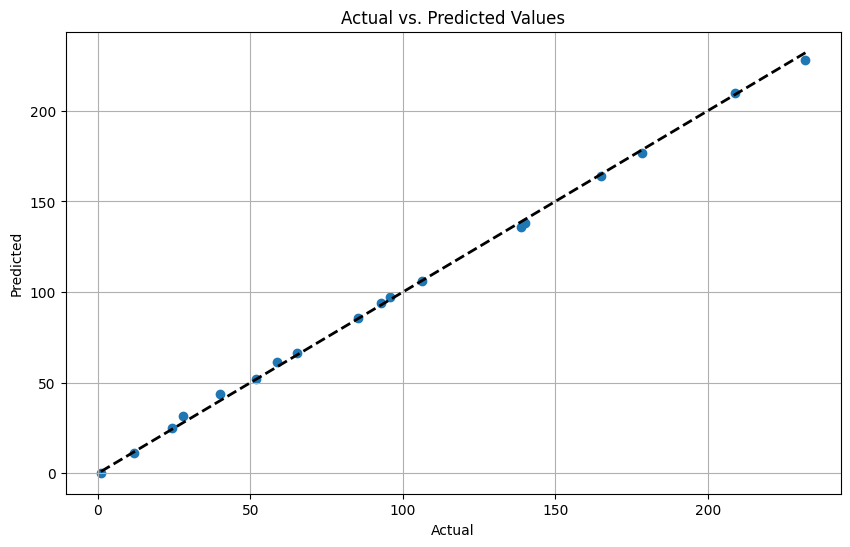

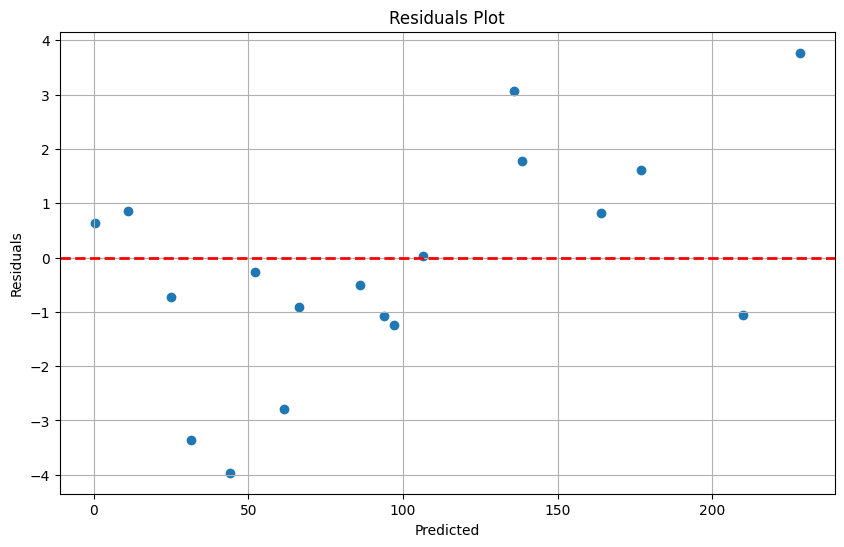

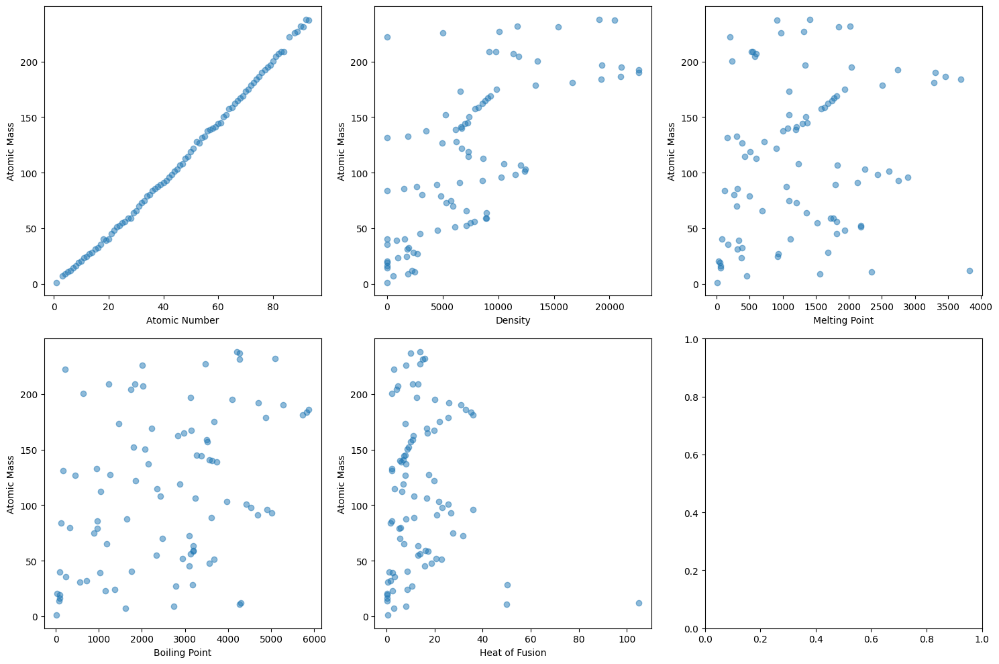

Mean squared error = 3.9746564617843863
Coefficient of determination (R² score) = 0.999106420272507


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
df = pd.read_csv("Modern_Periodic_Table.csv")
df.dropna(subset=['Atomic Number', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Atomic Mass'], inplace=True)
X = df[['Atomic Number', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion']]
y = df['Atomic Mass']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)
model = LinearRegression()
model.fit(X_train_poly, y_train)
y_pred = model.predict(X_test_poly)
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted Values')
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--', linewidth=2)
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.grid(True)
plt.show()
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, ax in enumerate(axes.flat):
    if i < X.shape[1]:
        ax.scatter(X.iloc[:, i], y, alpha=0.5)
        ax.set_xlabel(X.columns[i])
        ax.set_ylabel('Atomic Mass')
plt.tight_layout()
plt.show()
print('Mean squared error =', mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R² score) =', r2_score(y_test, y_pred))

**`Multiple Linear Regression`**

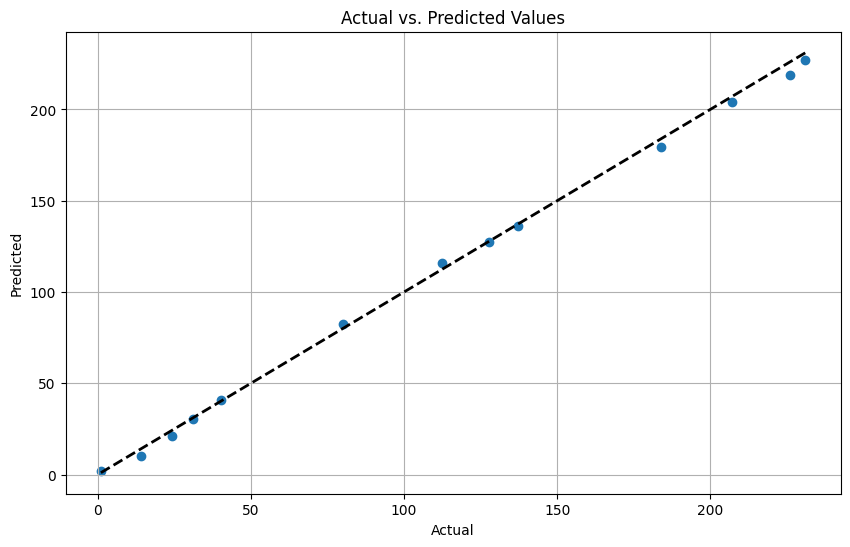

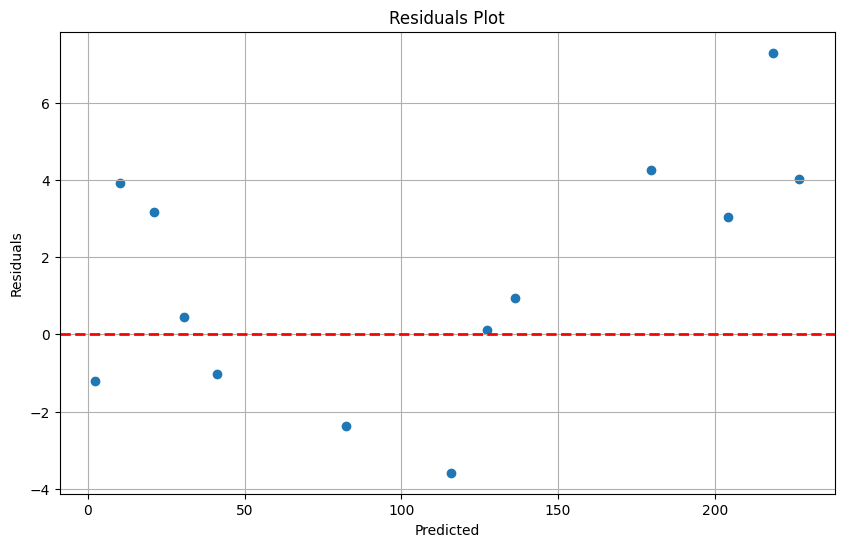

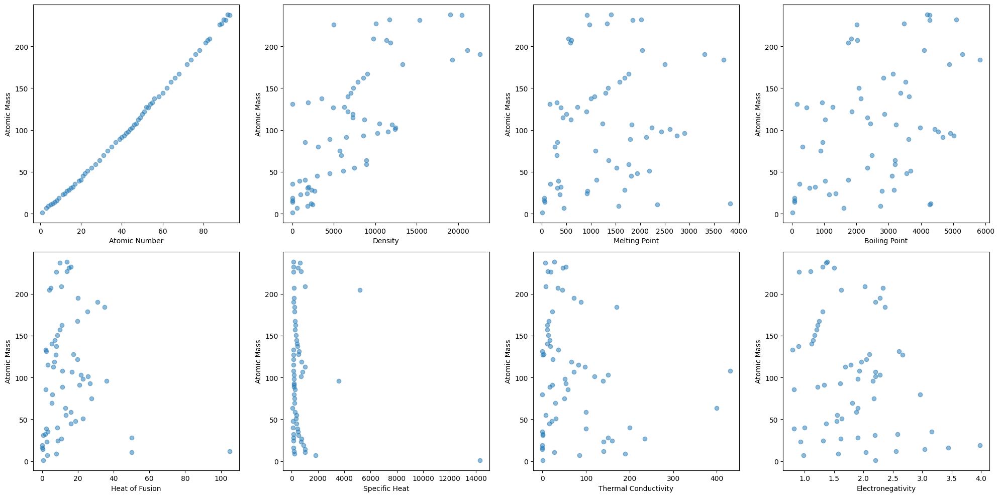

Mean squared error = 11.0813506480325
Coefficient of determination (R² score) = 0.9982957833161842


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
df = pd.read_csv("Modern_Periodic_Table.csv")
df.dropna(subset=['Atomic Number', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Atomic Mass',
                  'Specific Heat', 'Thermal Conductivity', 'Electronegativity'], inplace=True)
X = df[['Atomic Number', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion',
        'Specific Heat', 'Thermal Conductivity', 'Electronegativity']]
y = df['Atomic Mass']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted Values')
plt.grid(True)
plt.show()
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--', linewidth=2)
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.grid(True)
plt.show()
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
for i, ax in enumerate(axes.flat):
    if i < X.shape[1]:
        ax.scatter(X.iloc[:, i], y, alpha=0.5)
        ax.set_xlabel(X.columns[i])
        ax.set_ylabel('Atomic Mass')
plt.tight_layout()
plt.show()
print('Mean squared error =', mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R² score) =', r2_score(y_test, y_pred))

**`Polynomial Regression`**

Coefficients:
Feature 0: -6.125659123504493e-18
Feature 1: 2.9725659830981363e-13
Feature 2: 1.0012352738574236e-11
Feature 3: -4.76720139827519e-12
Feature 4: -4.184596852268664e-12
Feature 5: 7.997299826316667e-15
Feature 6: -2.5069161745533167e-13
Feature 7: -3.463480178697679e-13
Feature 8: 4.2967008990963705e-15
Feature 9: -7.38837618032401e-21
Feature 10: 1.4661715042621032e-19
Feature 11: 6.32413086991616e-20
Feature 12: 1.4230916129624363e-11
Feature 13: 9.433170366026822e-10
Feature 14: 1.2941389896750044e-10
Feature 15: 3.174314077379957e-10
Feature 16: 1.0460069257854782e-12
Feature 17: 6.324047990415408e-11
Feature 18: 4.606273466370082e-12
Feature 19: 6.190278524302964e-13
Feature 20: 1.0966519994633528e-22
Feature 21: 1.0627435941734575e-17
Feature 22: 5.291503247104776e-18
Feature 23: 3.022734927606891e-08
Feature 24: -1.1618275730971863e-08
Feature 25: -9.68510425583914e-09
Feature 26: 2.9755583016428575e-11
Feature 27: 6.337820813139143e-10
Feature 28: 1.85940295393261

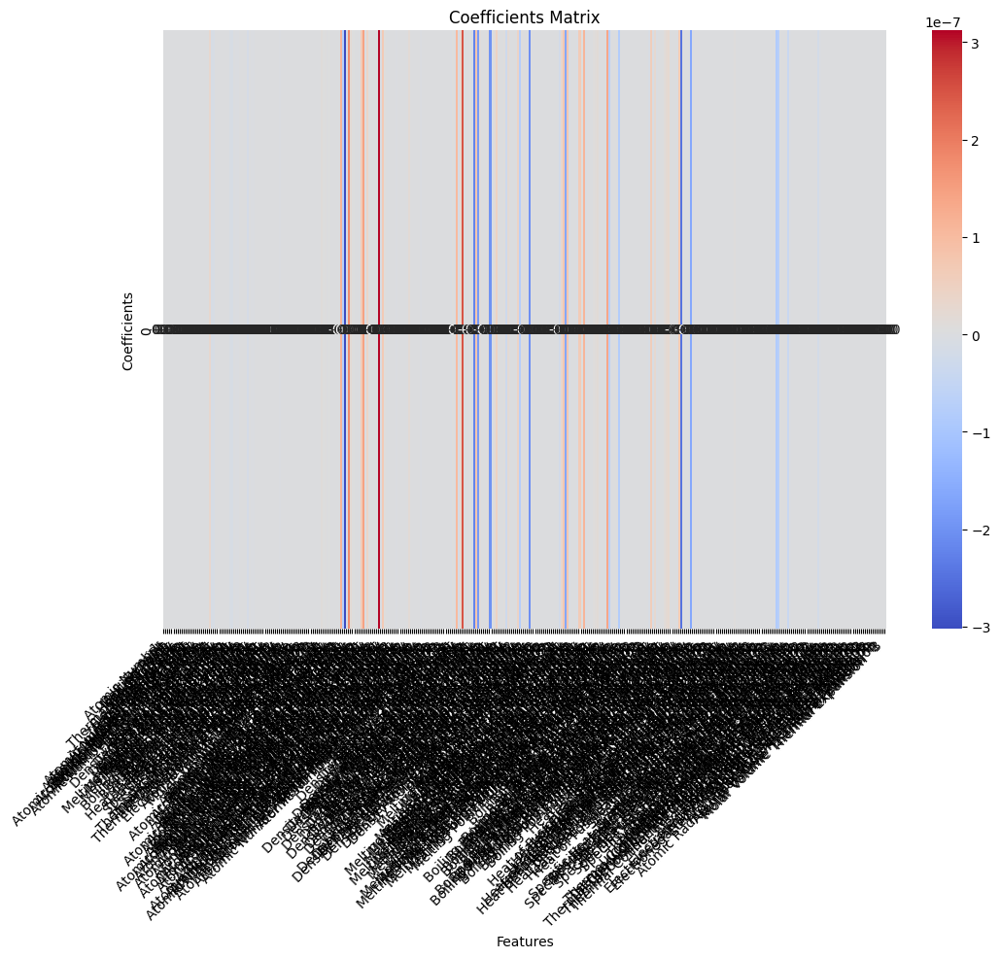

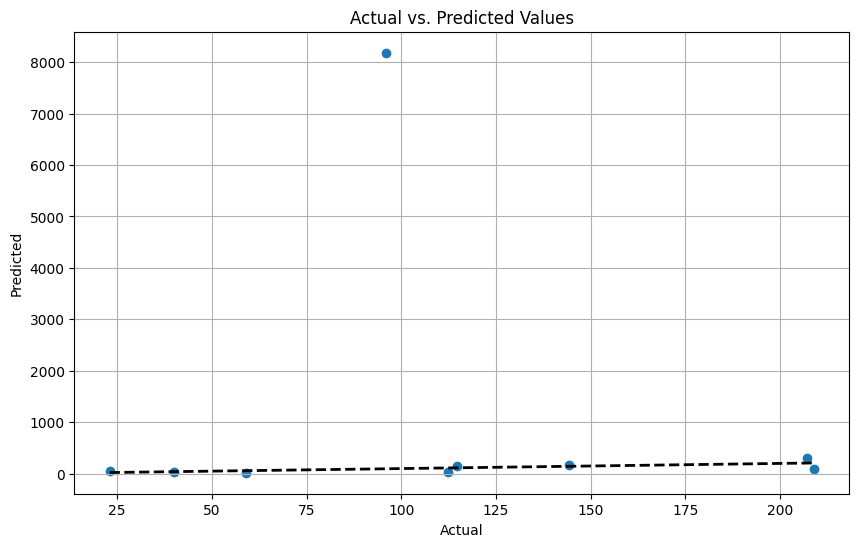

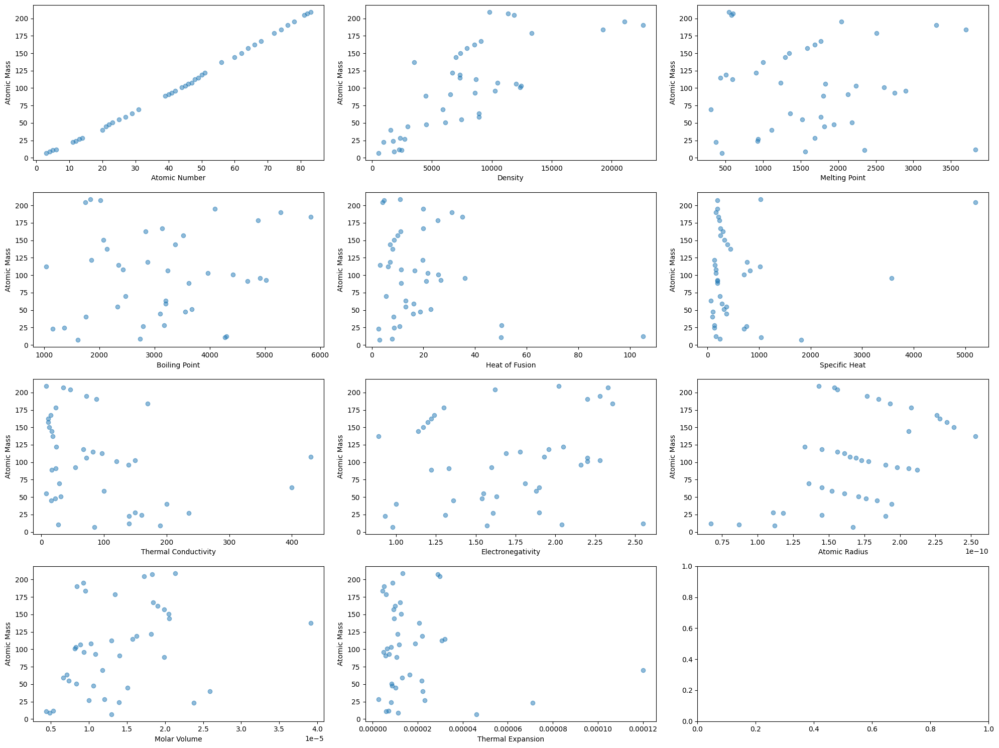

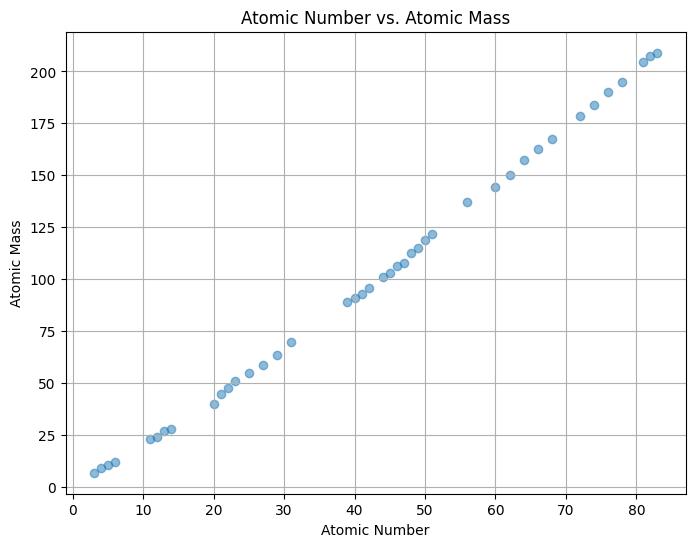

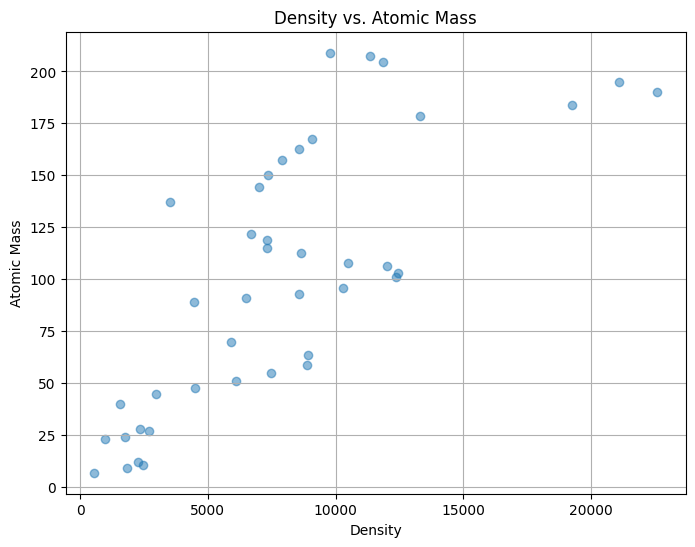

...

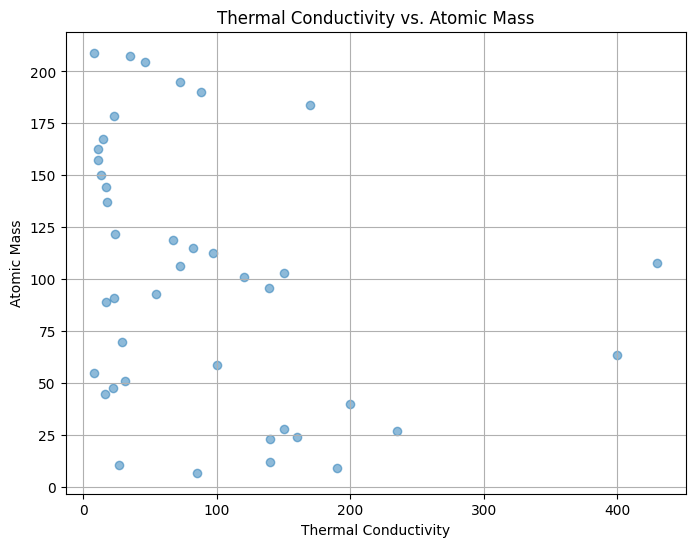

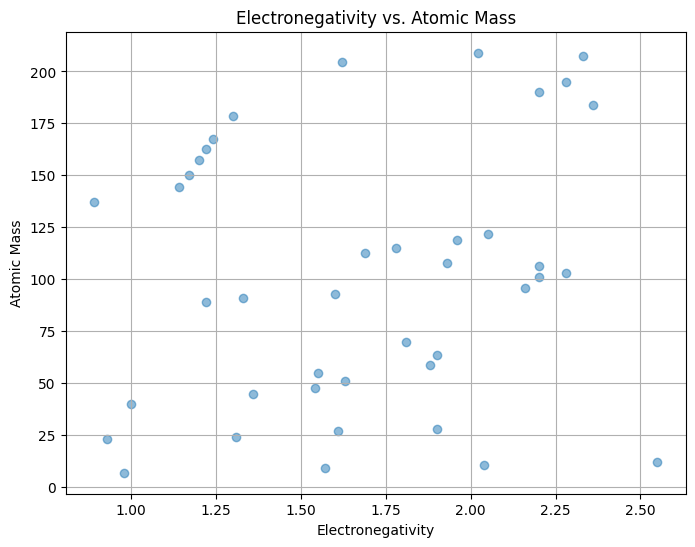

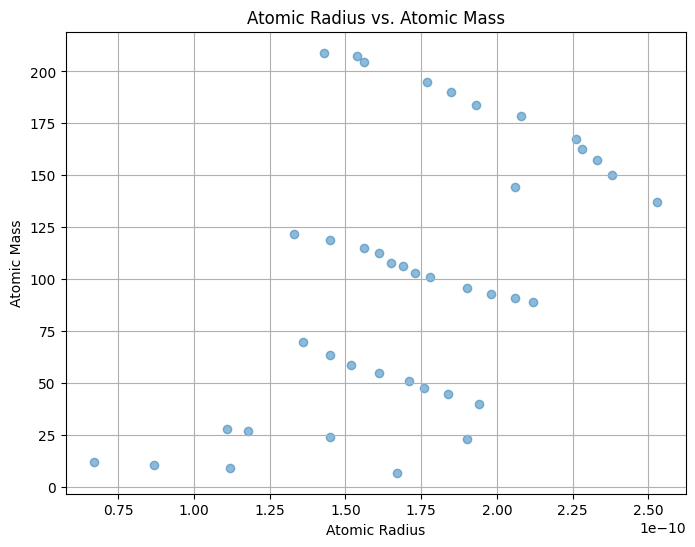

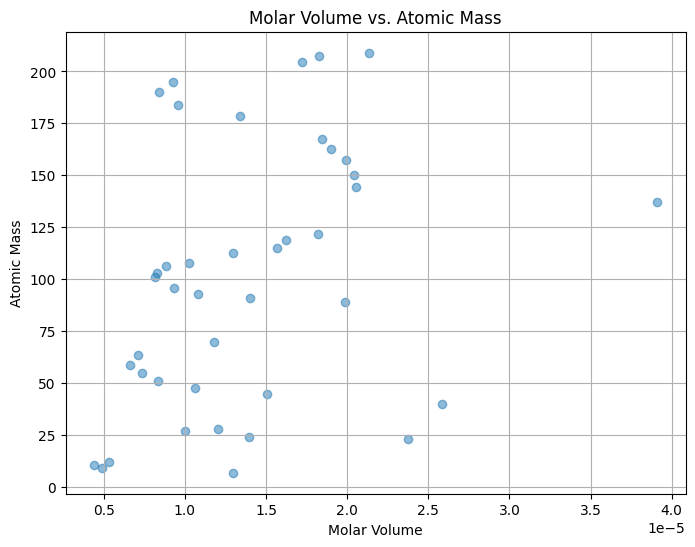

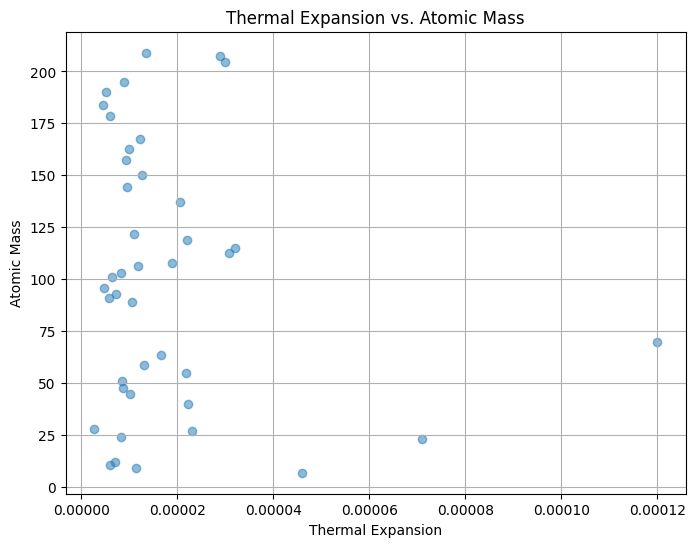

Mean squared error = 7271546.269530255
Coefficient of determination (R² score) = -1832.947845326238


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
df = pd.read_csv("Modern_Periodic_Table.csv")
df.dropna(subset=['Atomic Number', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Atomic Mass',
                  'Specific Heat', 'Thermal Conductivity', 'Electronegativity', 'Atomic Radius', 'Molar Volume',
                  'Thermal Expansion'], inplace=True)
X = df[['Atomic Number', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Specific Heat',
        'Thermal Conductivity', 'Electronegativity', 'Atomic Radius', 'Molar Volume', 'Thermal Expansion']]
y = df['Atomic Mass']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
degree = 3
poly = PolynomialFeatures(degree)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)
model = LinearRegression()
model.fit(X_train_poly, y_train)
y_pred = model.predict(X_test_poly)
print("Coefficients:")
coefficients = model.coef_
for i, coef in enumerate(coefficients):
    print(f"Feature {i}: {coef}")
print(f"Intercept: {model.intercept_}")
plt.figure(figsize=(12, 8))
sns.heatmap(coefficients.reshape(1, -1), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Coefficients Matrix")
plt.xlabel("Features")
plt.ylabel("Coefficients")
plt.xticks(ticks=np.arange(len(poly.get_feature_names_out(X.columns))), labels=poly.get_feature_names_out(X.columns), rotation=45, ha='right')
plt.show()
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted Values')
plt.grid(True)
plt.show()
fig, axes = plt.subplots(4, 3, figsize=(20, 15))
for i, ax in enumerate(axes.flat):
    if i < X.shape[1]:
        ax.scatter(X.iloc[:, i], y, alpha=0.5)
        ax.set_xlabel(X.columns[i])
        ax.set_ylabel('Atomic Mass')
plt.tight_layout()
plt.show()
for i, feature in enumerate(X.columns):
    plt.figure(figsize=(8, 6))
    plt.scatter(X[feature], y, alpha=0.5)
    plt.xlabel(feature)
    plt.ylabel('Atomic Mass')
    plt.title(f'{feature} vs. Atomic Mass')
    plt.grid(True)
    plt.show()
print('Mean squared error =', mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R² score) =', r2_score(y_test, y_pred))

**`Ridge Regression`**

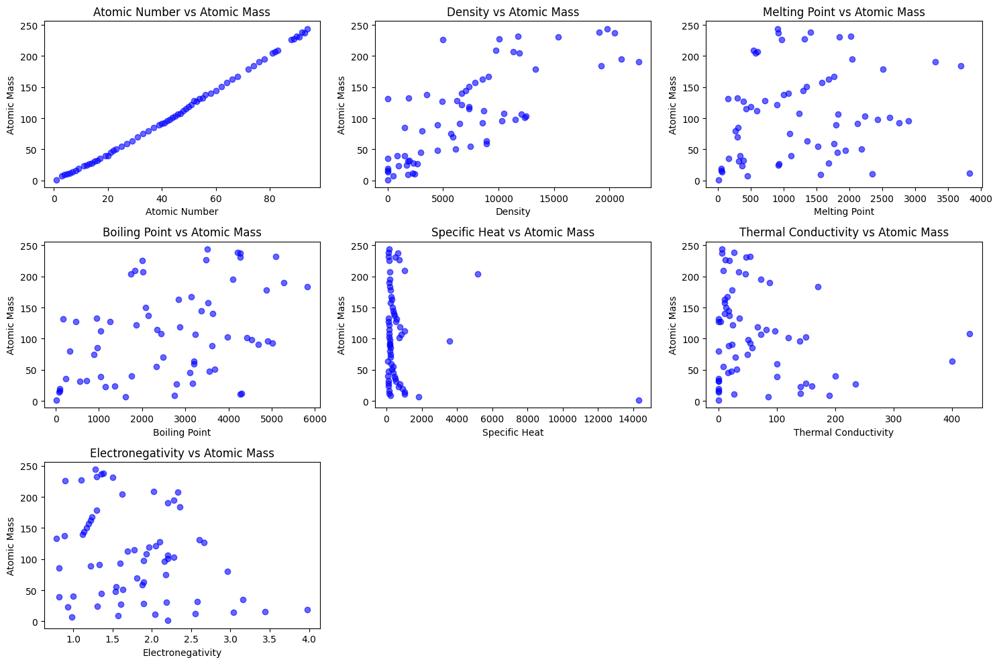

Mean squared error = 27.490131711770893
Coefficient of determination (R² score) = 0.9962303595421373
Residual Sum of Squares (RSOS) = 357.3717122530216


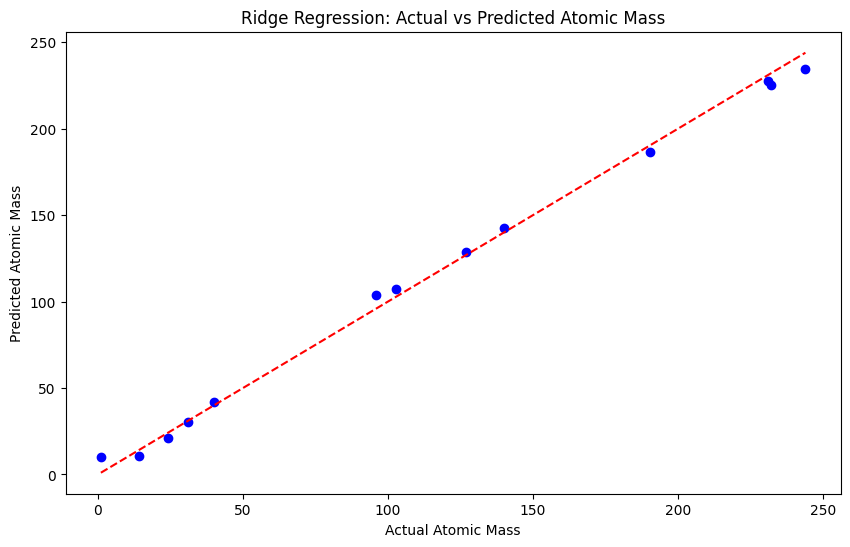

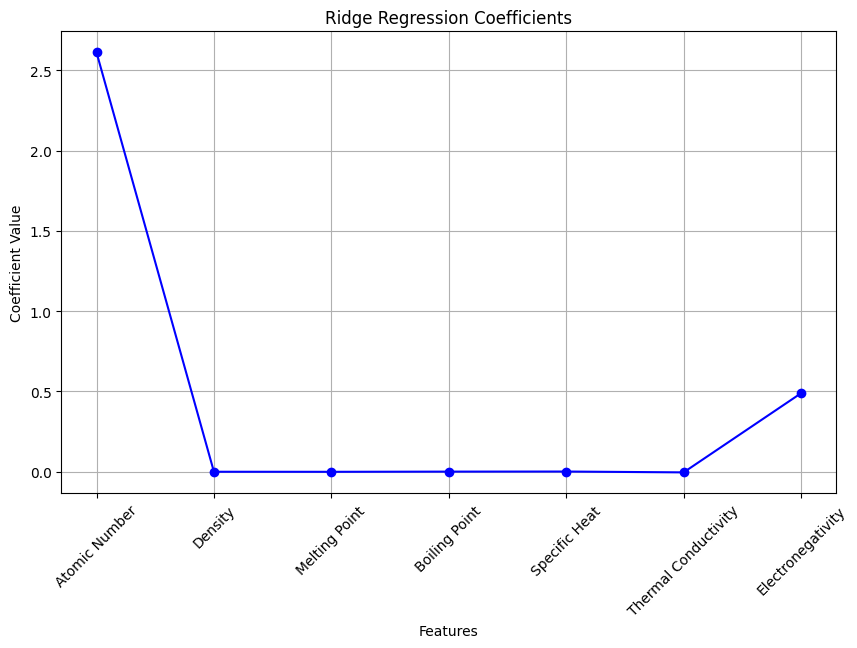

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
def calculate_RSOS(y_true, y_pred):
    residuals = y_true - y_pred
    RSOS = np.sum(residuals**2)
    return RSOS
df = pd.read_csv("Modern_Periodic_Table.csv")
df.dropna(subset=['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
                  'Specific Heat', 'Thermal Conductivity', 'Electronegativity'], inplace=True)
X = df[['Atomic Number', 'Density', 'Melting Point', 'Boiling Point',
        'Specific Heat', 'Thermal Conductivity', 'Electronegativity']]
y = df['Atomic Mass']
plt.figure(figsize=(15, 10))
for i, feature in enumerate(X.columns):
    plt.subplot(3, 3, i + 1)
    plt.scatter(df[feature], y, color='blue', alpha=0.6)
    plt.title(f'{feature} vs Atomic Mass')
    plt.xlabel(feature)
    plt.ylabel('Atomic Mass')
plt.tight_layout()
plt.show()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
alpha = 0.1
model = Ridge(alpha=alpha)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print('Mean squared error =', mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R² score) =', r2_score(y_test, y_pred))
RSOS = calculate_RSOS(y_test, y_pred)
print('Residual Sum of Squares (RSOS) =', RSOS)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.xlabel('Actual Atomic Mass')
plt.ylabel('Predicted Atomic Mass')
plt.title('Ridge Regression: Actual vs Predicted Atomic Mass')
plt.show()
plt.figure(figsize=(10, 6))
plt.plot(range(len(model.coef_)), model.coef_, marker='o', linestyle='-', color='blue')
plt.xticks(range(len(X.columns)), X.columns, rotation=45)
plt.xlabel('Features')
plt.ylabel('Coefficient Value')
plt.title('Ridge Regression Coefficients')
plt.grid(True)
plt.show()

**`Lasso Regression`**

Mean Squared Error = 8578.172018082816
R-squared = -3.729338122390647


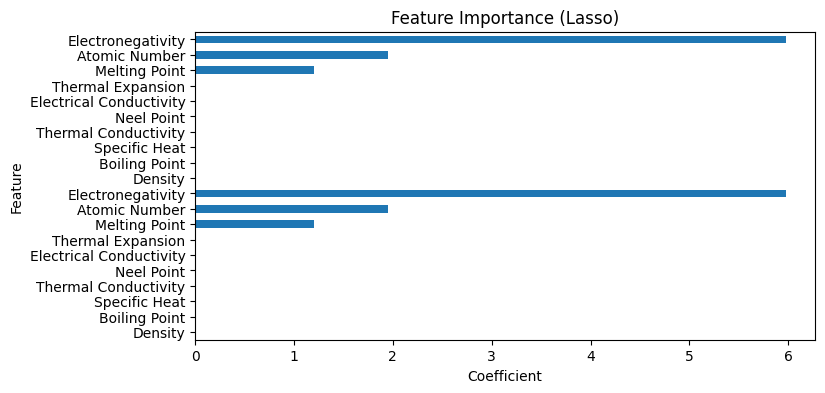

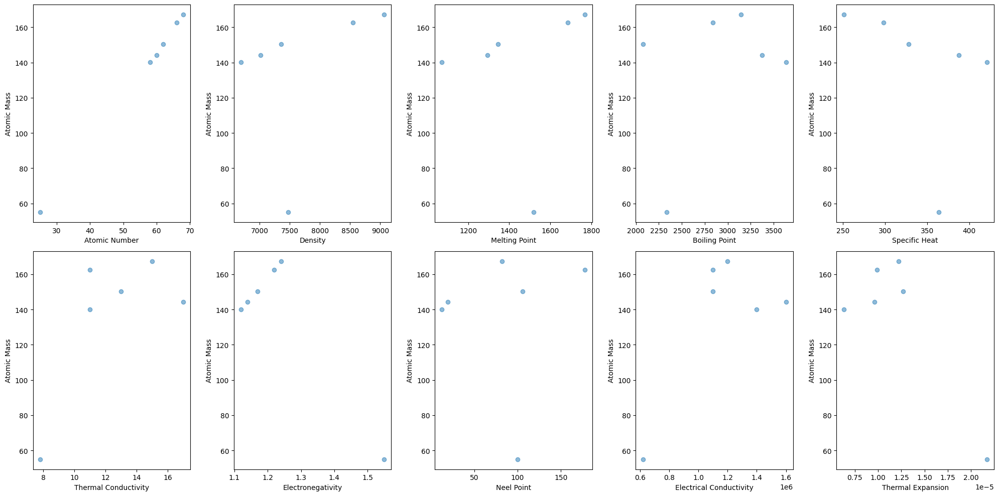

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
df = pd.read_csv("Modern_Periodic_Table.csv")
relevant_columns = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
                    'Specific Heat', 'Thermal Conductivity', 'Electronegativity', 'Neel Point',
                    'Electrical Conductivity', 'Thermal Expansion']
df.dropna(subset=relevant_columns, inplace=True)
X = df[['Atomic Number', 'Density', 'Melting Point', 'Boiling Point',
        'Specific Heat', 'Thermal Conductivity', 'Electronegativity', 'Neel Point',
        'Electrical Conductivity', 'Thermal Expansion']]
y = df['Atomic Mass']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
alpha = 0.1
lasso = Lasso(alpha=alpha, max_iter=10000)
lasso.fit(X_train_scaled, y_train)
y_pred = lasso.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error = {mse}")
print(f"R-squared = {r2}")
plt.figure(figsize=(8, 4))
coef = pd.Series(lasso.coef_, index=X.columns)
imp_coef = pd.concat([coef.sort_values().head(10),
                      coef.sort_values().tail(10)])
imp_coef.plot(kind='barh')
plt.title("Feature Importance (Lasso)")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.show()
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.flatten()
for i, col in enumerate(X.columns):
    axes[i].scatter(X[col], y, alpha=0.5)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Atomic Mass')
plt.tight_layout()
plt.show()

**`ElasticNet Regression`**

Best hyperparameters: {'alpha': 0.001, 'l1_ratio': 0.9}
Train MSE: 0.008448890191076914
Test MSE: 0.01197352891019464


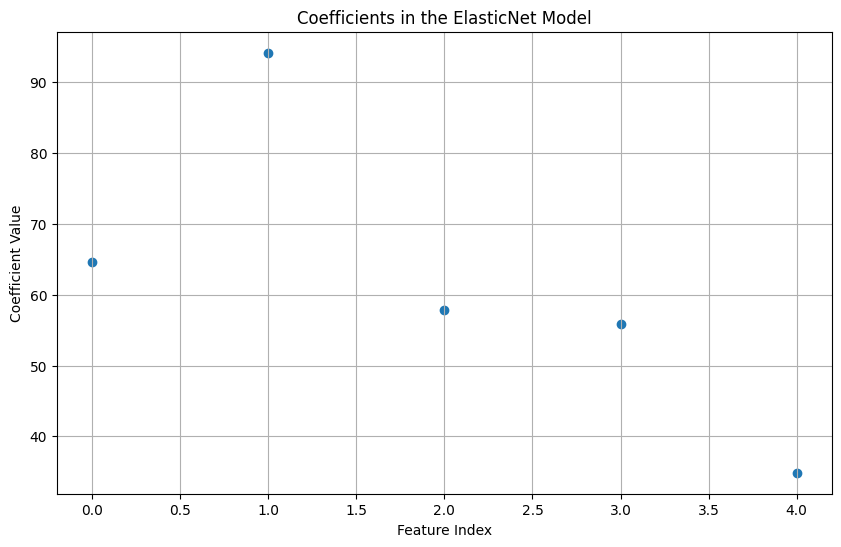

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_regression
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error
X, y = make_regression(n_samples=100, n_features=5, noise=0.1, random_state=42)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
params = {'alpha': [0.001, 0.01, 0.1, 1, 10],
          'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]}
enet = ElasticNet(max_iter=10000)
kf = KFold(n_splits=3, shuffle=True, random_state=42)
grid_search = GridSearchCV(enet, params, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
best_enet = grid_search.best_estimator_
best_enet.fit(X_train, y_train)
train_score = mean_squared_error(y_train, best_enet.predict(X_train))
test_score = mean_squared_error(y_test, best_enet.predict(X_test))
print("Best hyperparameters:", grid_search.best_params_)
print("Train MSE:", train_score)
print("Test MSE:", test_score)
plt.figure(figsize=(10, 6))
plt.scatter(np.arange(X.shape[1]), best_enet.coef_)
plt.title("Coefficients in the ElasticNet Model")
plt.xlabel("Feature Index")
plt.ylabel("Coefficient Value")
plt.grid(True)
plt.show()

**`Decision Tree Regression`**

Test MSE: 1.3483202745887781


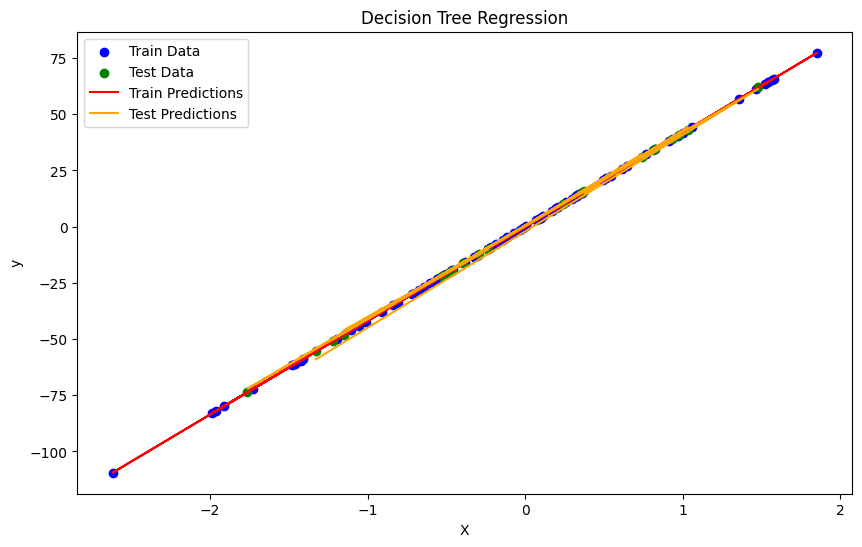

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
X, y = make_regression(n_samples=100, n_features=1, noise=0.1, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
test_mse = mean_squared_error(y_test, y_pred_test)
print("Test MSE:", test_mse)
plt.figure(figsize=(10, 6))
plt.scatter(X_train, y_train, color='blue', label='Train Data')
plt.scatter(X_test, y_test, color='green', label='Test Data')
plt.plot(X_train, y_pred_train, color='red', label='Train Predictions')
plt.plot(X_test, y_pred_test, color='orange', label='Test Predictions')
plt.title('Decision Tree Regression')
plt.xlabel('X')
plt.ylabel('y')
plt.legend()
plt.show()

**`Random Forest Regression`**

Train MSE: 2.3152621457714537
Test MSE: 0.8872743714729371


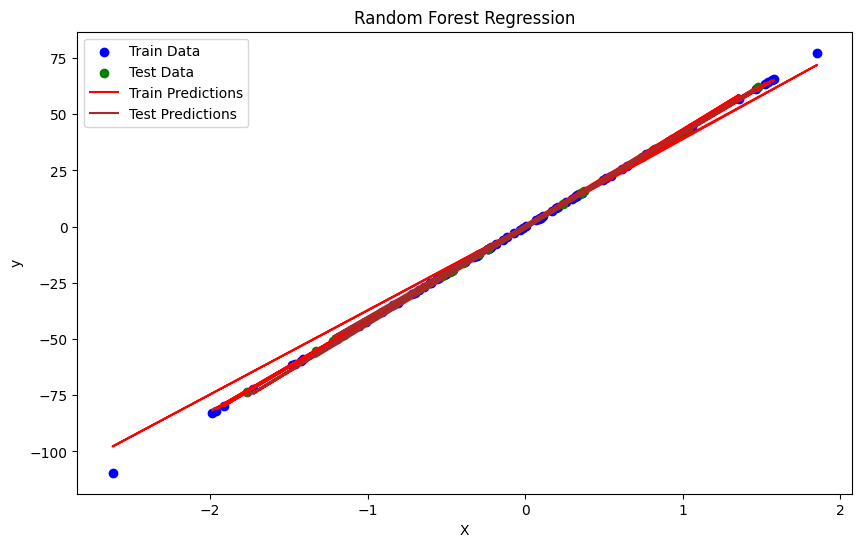

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
X, y = make_regression(n_samples=100, n_features=1, noise=0.1, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)
print("Train MSE:", train_mse)
print("Test MSE:", test_mse)
plt.figure(figsize=(10, 6))
plt.scatter(X_train, y_train, color='blue', label='Train Data')
plt.scatter(X_test, y_test, color='green', label='Test Data')
plt.plot(X_train, y_pred_train, color='red', label='Train Predictions')
plt.plot(X_test, y_pred_test, color='brown', label='Test Predictions')
plt.title('Random Forest Regression')
plt.xlabel('X')
plt.ylabel('y')
plt.legend()
plt.show()

**`Gradient Boosting Regression`**

Train MSE: 0.0041597011570905906
Test MSE: 1.3379888778506104


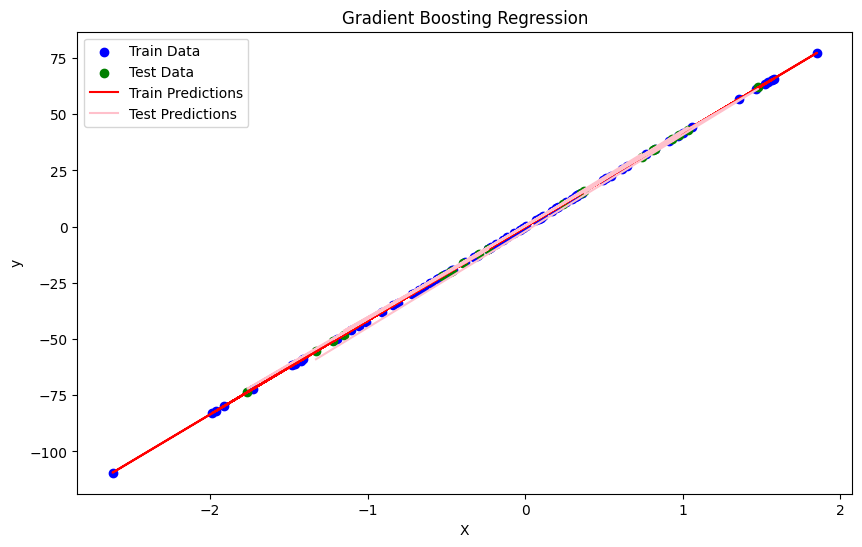

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
X, y = make_regression(n_samples=100, n_features=1, noise=0.1, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)
print("Train MSE:", train_mse)
print("Test MSE:", test_mse)
plt.figure(figsize=(10, 6))
plt.scatter(X_train, y_train, color='blue', label='Train Data')
plt.scatter(X_test, y_test, color='green', label='Test Data')
plt.plot(X_train, y_pred_train, color='red', label='Train Predictions')
plt.plot(X_test, y_pred_test, color='pink', label='Test Predictions')
plt.title('Gradient Boosting Regression')
plt.xlabel('X')
plt.ylabel('y')
plt.legend()
plt.show()

**`Support Vector Regression`**

Train RMSE: 790.6023364789519
Test RMSE: 3328.177371586302


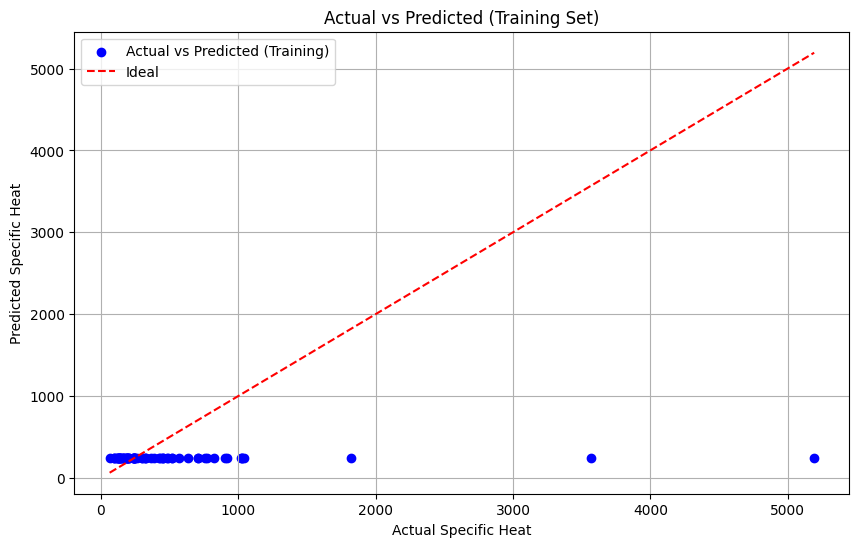

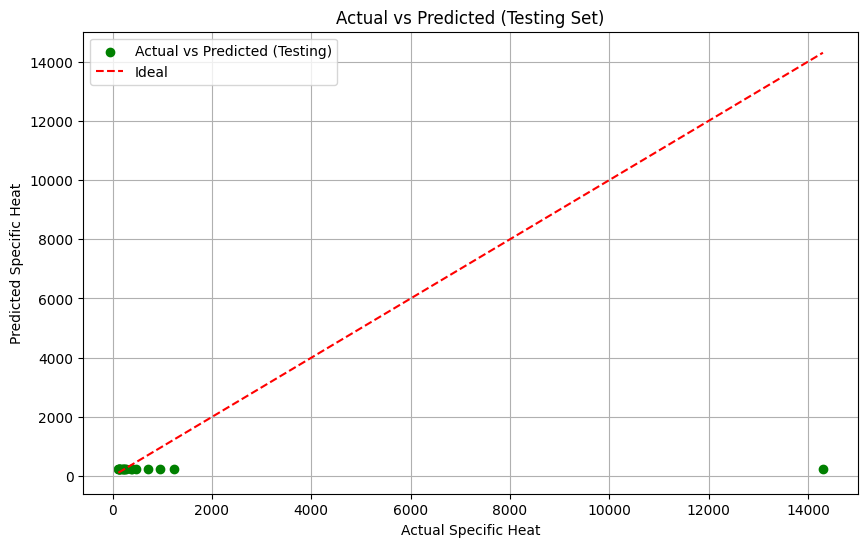

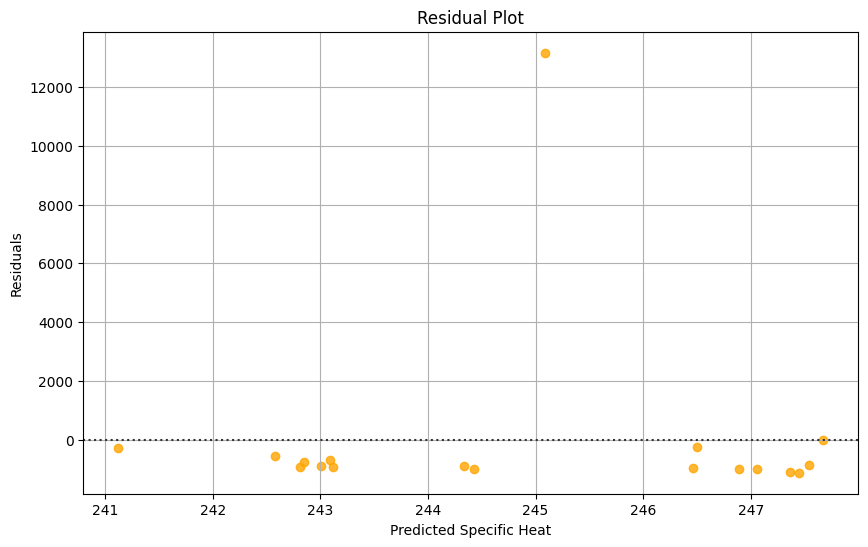

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
data = pd.read_csv('Modern_Periodic_Table.csv')
features = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point']
target = 'Specific Heat'
X = data[features]
y = data[target]
X = X.drop(index=nan_indices)
y = y.drop(index=nan_indices)
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
svr_model = SVR(kernel='rbf')
svr_model.fit(X_train_scaled, y_train)
y_pred_train = svr_model.predict(X_train_scaled)
y_pred_test = svr_model.predict(X_test_scaled)
train_rmse = mean_squared_error(y_train, y_pred_train, squared=False)
test_rmse = mean_squared_error(y_test, y_pred_test, squared=False)
print("Train RMSE:", train_rmse)
print("Test RMSE:", test_rmse)
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_pred_train, color='blue', label='Actual vs Predicted (Training)')
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='red', label='Ideal')
plt.title('Actual vs Predicted (Training Set)')
plt.xlabel('Actual Specific Heat')
plt.ylabel('Predicted Specific Heat')
plt.legend()
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='green', label='Actual vs Predicted (Testing)')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red', label='Ideal')
plt.title('Actual vs Predicted (Testing Set)')
plt.xlabel('Actual Specific Heat')
plt.ylabel('Predicted Specific Heat')
plt.legend()
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 6))
sns.residplot(x=y_pred_test, y=residuals, color='orange')
plt.title('Residual Plot')
plt.xlabel('Predicted Specific Heat')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()

**`K-Nearest Neighbors (KNN) Regression`**

Mean Squared Error = 8090607.936872915


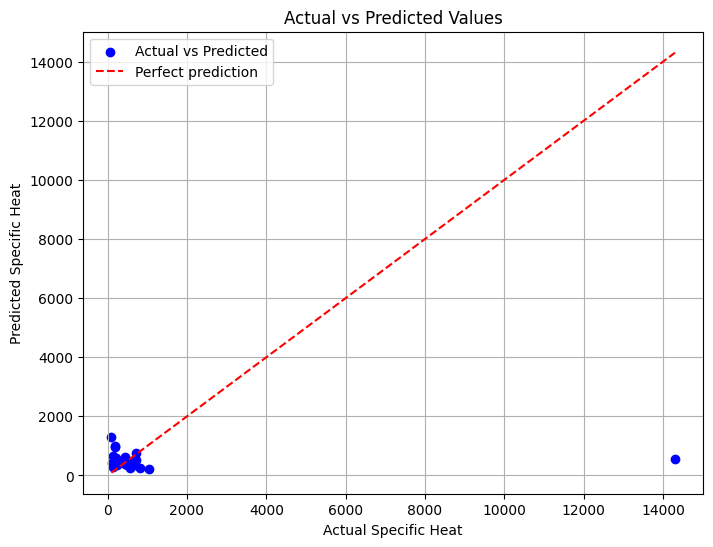

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
data = pd.read_csv('Modern_Periodic_Table.csv')
X = data[['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point']]
y = data['Specific Heat']
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
y_imputed = y.fillna(y.mean())
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y_imputed, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
k = 5
knn_regressor = KNeighborsRegressor(n_neighbors=k)
knn_regressor.fit(X_train_scaled, y_train)
y_pred = knn_regressor.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error =", mse)
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', label='Actual vs Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect prediction')
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Specific Heat')
plt.ylabel('Predicted Specific Heat')
plt.legend()
plt.grid(True)
plt.show()

**`Bayesian Regression`**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import BayesianRidge
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
data = pd.read_csv('Modern_Periodic_Table.csv')
X = data[['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point']]
y_electronegativity = data['Electronegativity']
y_density = data['Density']
y_melting_point = data['Melting Point']
y_electronegativity_imputed = SimpleImputer(strategy='mean').fit_transform(y_electronegativity.values.reshape(-1, 1)).ravel()
y_density_imputed = SimpleImputer(strategy='mean').fit_transform(y_density.values.reshape(-1, 1)).ravel()
y_melting_point_imputed = SimpleImputer(strategy='mean').fit_transform(y_melting_point.values.reshape(-1, 1)).ravel()
X_imputed = SimpleImputer(strategy='mean').fit_transform(X)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)
bayesian_reg_electronegativity = BayesianRidge()
bayesian_reg_electronegativity.fit(X_scaled, y_electronegativity_imputed)
bayesian_reg_density = BayesianRidge()
bayesian_reg_density.fit(X_scaled, y_density_imputed)
bayesian_reg_melting_point = BayesianRidge()
bayesian_reg_melting_point.fit(X_scaled, y_melting_point_imputed)
X_new = np.array([
    [80, 200, 10, 1000, 2000],
    [90, 210, 12, 1100, 2100],
    [100, 220, 14, 1200, 2200]
])
X_new_imputed = SimpleImputer(strategy='mean').fit_transform(X_new)
X_new_scaled = scaler.transform(X_new_imputed)
electronegativity_pred, electronegativity_std = bayesian_reg_electronegativity.predict(X_new_scaled, return_std=True)
density_pred, density_std = bayesian_reg_density.predict(X_new_scaled, return_std=True)
melting_point_pred, melting_point_std = bayesian_reg_melting_point.predict(X_new_scaled, return_std=True)
print("Predicted Results:")
for i in range(len(X_new)):
    print(f"Data Point {i+1}:")
    print(f"  Electronegativity: Mean = {electronegativity_pred[i]}, Std = {electronegativity_std[i]}")
    print(f"  Density: Mean = {density_pred[i]}, Std = {density_std[i]}")
    print(f"  Melting Point: Mean = {melting_point_pred[i]}, Std = {melting_point_std[i]}")

Predicted Results:
Data Point 1:
  Electronegativity: Mean = 1.4237830666038505, Std = 0.5247752486854248
  Density: Mean = 10.000000000010914, Std = 0.00013642867896089794
  Melting Point: Mean = 999.9999999999997, Std = 0.00013642867896089775
Data Point 2:
  Electronegativity: Mean = 1.3855471680325606, Std = 0.5273860096333307
  Density: Mean = 12.000000000013642, Std = 0.00013741025410474774
  Melting Point: Mean = 1100.0000000000005, Std = 0.00013741025410474753
Data Point 3:
  Electronegativity: Mean = 1.3473112694612706, Std = 0.5314837402357364
  Density: Mean = 14.000000000016371, Std = 0.00013979712048584975
  Melting Point: Mean = 1200.0000000000011, Std = 0.00013979712048584937


**`Neural Network Regression`**

In [ ]:
pip install pytorch-lightning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.6/801.6 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━

Epoch 1/100: Train Loss = 28640.888671875
Epoch 2/100: Train Loss = 28495.662109375
Epoch 3/100: Train Loss = 28430.391276041668
Epoch 4/100: Train Loss = 28456.607421875
Epoch 5/100: Train Loss = 28348.267578125
Epoch 6/100: Train Loss = 28244.554036458332
Epoch 7/100: Train Loss = 28094.3359375
Epoch 8/100: Train Loss = 28014.83203125
Epoch 9/100: Train Loss = 27931.654296875
Epoch 10/100: Train Loss = 27683.366536458332
Epoch 11/100: Train Loss = 27478.667317708332
Epoch 12/100: Train Loss = 27031.581380208332
Epoch 13/100: Train Loss = 26894.189453125
Epoch 14/100: Train Loss = 26373.015625
Epoch 15/100: Train Loss = 25923.064453125
Epoch 16/100: Train Loss = 25296.634114583332
Epoch 17/100: Train Loss = 24542.259114583332
Epoch 18/100: Train Loss = 23862.298828125
Epoch 19/100: Train Loss = 22991.375
Epoch 20/100: Train Loss = 22188.505533854168
Epoch 21/100: Train Loss = 21000.712239583332
Epoch 22/100: Train Loss = 19912.991861979168
Epoch 23/100: Train Loss = 18592.993489583332

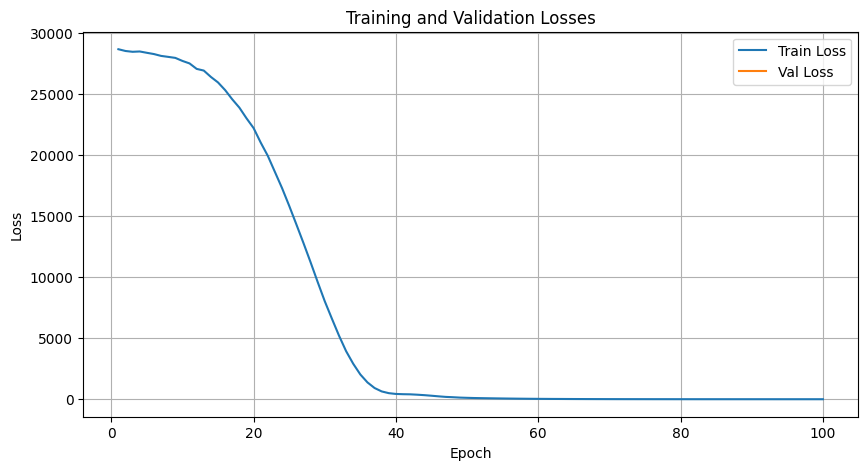

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
dataset = pd.read_csv('Modern_Periodic_Table.csv')
features = dataset.drop(['Atomic Mass'], axis=1)
target = dataset['Atomic Mass']
features = pd.get_dummies(features)
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)
X_train.fillna(X_train.mean(), inplace=True)
X_test.fillna(X_test.mean(), inplace=True)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
train_dataset = TensorDataset(torch.tensor(X_train_scaled, dtype=torch.float32),
                              torch.tensor(y_train.values, dtype=torch.float32))
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataset = TensorDataset(torch.tensor(X_test_scaled, dtype=torch.float32),
                            torch.tensor(y_test.values, dtype=torch.float32))
val_loader = DataLoader(val_dataset, batch_size=32)
class RegressionModel(nn.Module):
    def __init__(self, input_size):
        super(RegressionModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x
model = RegressionModel(input_size=X_train.shape[1])
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
train_losses = []
val_losses = []
for epoch in range(100):
    model.train()
    running_loss = 0.0
    for inputs, targets in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets.unsqueeze(1))
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    train_loss = running_loss / len(train_loader)
    train_losses.append(train_loss)
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for inputs, targets in val_loader:
            outputs = model(inputs)
            val_loss += criterion(outputs, targets.unsqueeze(1)).item()
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    print(f"Epoch {epoch+1}/100: Train Loss = {train_loss}")
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.grid(True)
plt.show()
model.eval()
test_loss = 0.0
with torch.no_grad():
    for inputs, targets in val_loader:
        outputs = model(inputs)
        test_loss += criterion(outputs, targets.unsqueeze(1)).item()

**`Quantile Regression`**

Quantile Regression Results for quantile 0.25:
Coefficients: [-7695.94298886 -7376.19619769 -7250.43554192 -6772.84506694
 -3815.86717837  -811.2217836  -2835.74487812 -1921.10876226
  2042.11537449  -380.79136107 -3412.84457232 -2450.96550561
   310.47651017  6723.07401553 10852.33792155  4460.14482718
   684.93056763  5563.32733816  9516.45774857 12546.56198842
  7975.46297126]
Quantile Regression Results for quantile 0.5:
Coefficients: [-7695.94298886 -7376.19619769 -7250.43554192 -6772.84506694
 -3815.86717837  -811.2217836  -2835.74487812 -1921.10876226
  2042.11537449  -380.79136107 -3412.84457232 -2450.96550561
   310.47651017  6723.07401553 10852.33792155  4460.14482718
   684.93056763  5563.32733816  9516.45774857 12546.56198842
  7975.46297126]
Quantile Regression Results for quantile 0.75:
Coefficients: [-7695.94298886 -7376.19619769 -7250.43554192 -6772.84506694
 -3815.86717837  -811.2217836  -2835.74487812 -1921.10876226
  2042.11537449  -380.79136107 -3412.84457232 -2450.

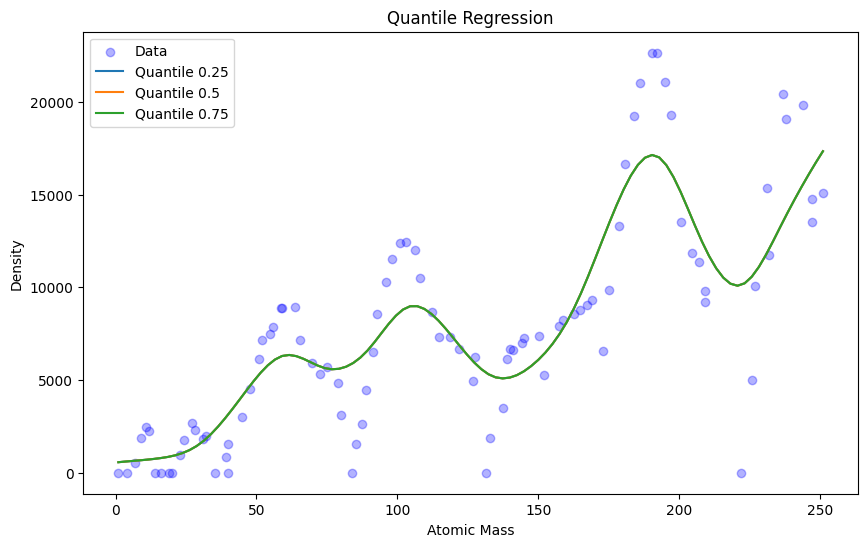

In [ ]:
import pandas as pd
import numpy as np
from pygam import LinearGAM, s
import matplotlib.pyplot as plt
data = pd.read_csv('Modern_Periodic_Table.csv')
X = data[['Atomic Mass']].values
y = data['Density'].values
X = X[~np.isnan(y)]
y = y[~np.isnan(y)]
X = X[~np.isinf(y)]
y = y[~np.isinf(y)]
quantiles = [0.25, 0.5, 0.75]
models = []
for quantile in quantiles:
    gam = LinearGAM(s(0))
    gam.fit(X, y)
    models.append(gam)
for i, quantile in enumerate(quantiles):
    print(f"Quantile Regression Results for quantile {quantile}:")
    print(f"Coefficients: {models[i].coef_}")
quantile = 0.5
predicted_values = models[quantiles.index(quantile)].predict(X)
print("Predicted values at 0.5 quantile:")
print(predicted_values)
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', label='Data', alpha=0.3)
for i, quantile in enumerate(quantiles):
    XX = np.linspace(X.min(), X.max(), 100)
    plt.plot(XX, models[i].predict(XX), label=f'Quantile {quantile}')
plt.title('Quantile Regression')
plt.xlabel('Atomic Mass')
plt.ylabel('Density')
plt.legend()
plt.show()

**`Robust Regression`**

Coefficients: [ 0.82078564 -1.16683858  0.47442263 -0.16743565 -0.8077815   0.21626131
  0.4883773  -0.00766033 -0.0148033 ]
Intercept: 1.6413051184018383


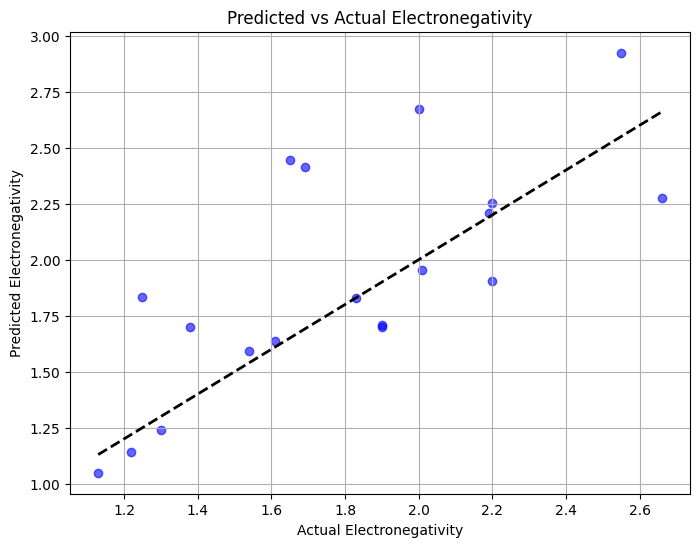

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import HuberRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
data = pd.read_csv("Modern_Periodic_Table.csv")
features = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
            'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity']
X = data[features]
y = data['Electronegativity']
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X_scaled)
missing_target_indices = y.isnull()
X_imputed = X_imputed[~missing_target_indices]
y = y.dropna()
huber = HuberRegressor()
huber.fit(X_imputed, y)
print("Coefficients:", huber.coef_)
print("Intercept:", huber.intercept_)
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual Electronegativity')
plt.ylabel('Predicted Electronegativity')
plt.title('Predicted vs Actual Electronegativity')
plt.grid(True)
plt.show()

**`Nonlinear Regression`**

Parameters:
a = 8.932482665844889e-15
b = 0.9999999970381093
R-squared value: -2.7940881203902853e+68


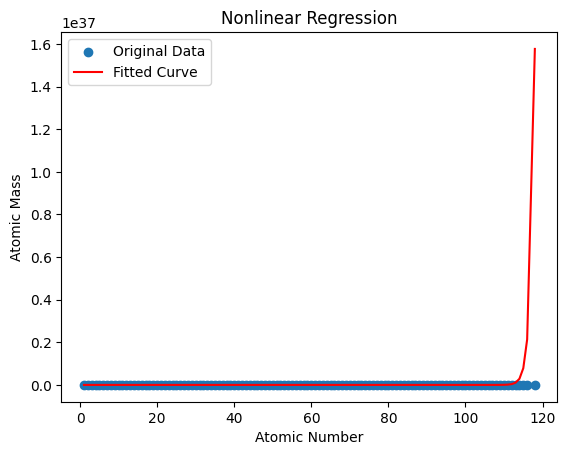

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
data = pd.read_csv('Modern_Periodic_Table.csv')
data = data.dropna(subset=['Atomic Number', 'Atomic Mass'])
x_data = data['Atomic Number']
y_data = data['Atomic Mass']
def nonlinear_model(x, a, b):
    return a * np.exp(b * x)
params, covariance = curve_fit(nonlinear_model, x_data, y_data)
a, b = params
y_pred = nonlinear_model(x_data, a, b)
r_squared = r2_score(y_data, y_pred)
print("Parameters:")
print("a =", a)
print("b =", b)
print("R-squared value:", r_squared)
plt.scatter(x_data, y_data, label='Original Data')
plt.plot(x_data, y_pred, color='red', label='Fitted Curve')
plt.xlabel('Atomic Number')
plt.ylabel('Atomic Mass')
plt.title('Nonlinear Regression')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/scipy/optimize/minpack.py:833: OptimizeWarning:

Covariance of the parameters could not be estimated



Parameters:
a = -1.2291604873437831e-14
b = 0.9999999988095135
c = -30833.820329995775
d = 900849488862158.0
e = -520751599900982.0
f = 1511110275785730.0
g = -3032130111840572.0
h = -1.9197418710385046e+20
i = 1.0
R-squared value: -3.2158296608168116e+41


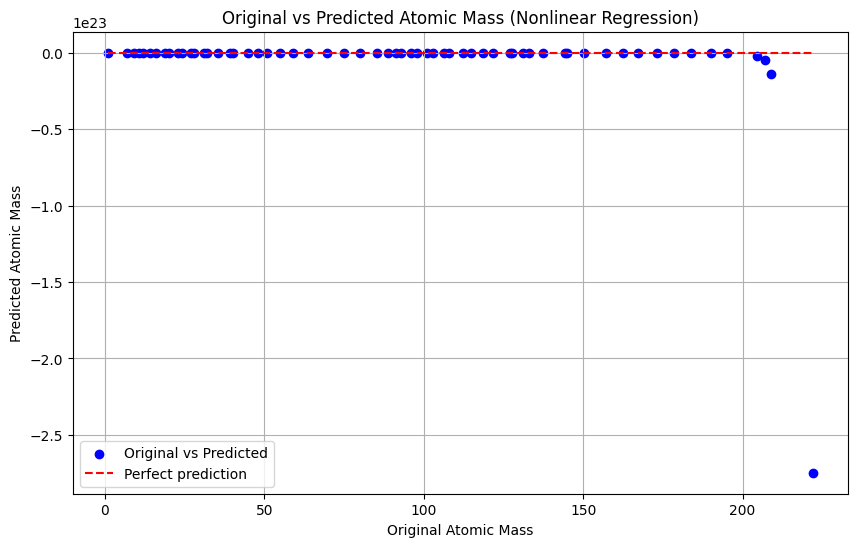

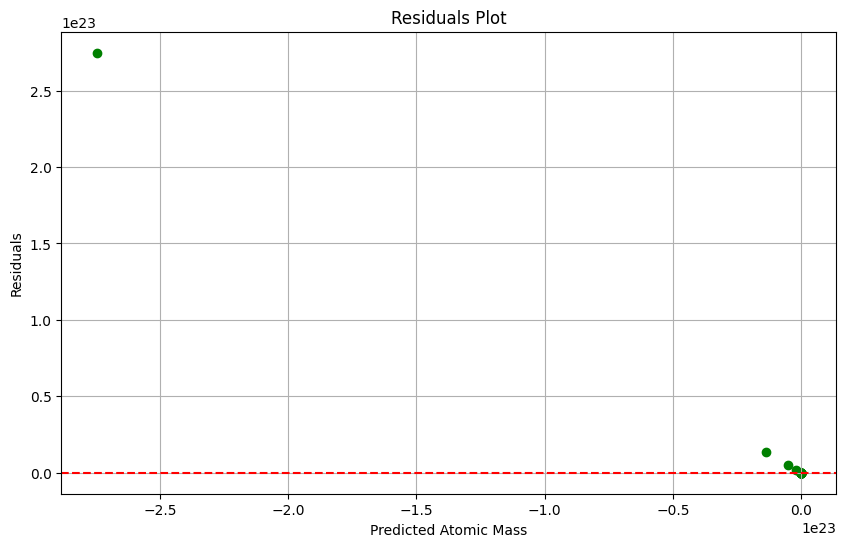

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
data = pd.read_csv('Modern_Periodic_Table.csv')
data = data.dropna(subset=['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
                           'Specific Heat', 'Thermal Conductivity', 'Molar Volume', 'Atomic Radius'])
x1_data = data['Atomic Number']
x2_data = data['Density']
x3_data = data['Melting Point']
x4_data = data['Boiling Point']
x5_data = data['Specific Heat']
x6_data = data['Thermal Conductivity']
x7_data = data['Molar Volume']
x8_data = data['Atomic Radius']
y_data = data['Atomic Mass']
def nonlinear_model(x, a, b, c, d, e, f, g, h, i):
    x1, x2, x3, x4, x5, x6, x7, x8 = x
    return a * np.exp(b * x1) + c * x2 + d * x3 + e * x4 + f * x5 + g * x6 + h * x7 + i * x8
initial_guess = (1, 1, 1, 1, 1, 1, 1, 1, 1)
params, covariance = curve_fit(nonlinear_model, (x1_data, x2_data, x3_data, x4_data, x5_data, x6_data, x7_data, x8_data), y_data, p0=initial_guess)
a, b, c, d, e, f, g, h, i = params
y_pred = nonlinear_model((x1_data, x2_data, x3_data, x4_data, x5_data, x6_data, x7_data, x8_data), a, b, c, d, e, f, g, h, i)
r_squared = r2_score(y_data, y_pred)
print("Parameters:")
print("a =", a)
print("b =", b)
print("c =", c)
print("d =", d)
print("e =", e)
print("f =", f)
print("g =", g)
print("h =", h)
print("i =", i)
print("R-squared value:", r_squared)
plt.figure(figsize=(10, 6))
plt.scatter(y_data, y_pred, color='blue', label='Original vs Predicted')
plt.plot([min(y_data), max(y_data)], [min(y_data), max(y_data)], '--', color='red', label='Perfect prediction')
plt.xlabel('Original Atomic Mass')
plt.ylabel('Predicted Atomic Mass')
plt.title('Original vs Predicted Atomic Mass (Nonlinear Regression)')
plt.legend()
plt.grid(True)
plt.show()
residuals = y_data - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, color='green')
plt.xlabel('Predicted Atomic Mass')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.axhline(y=0, color='red', linestyle='--')
plt.grid(True)
plt.show()

**`Generalized Additive Model`**

R-squared: 0.9432908163171866


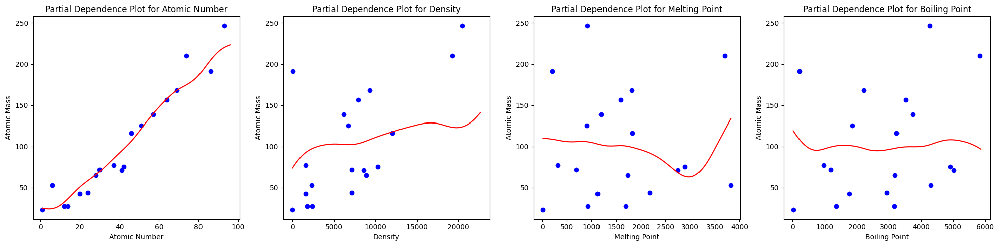

In [ ]:
from pygam import GAM, s
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
data = pd.read_csv('Modern_Periodic_Table.csv')
target_variable = 'Atomic Mass'
selected_features = ['Atomic Number', 'Density', 'Melting Point', 'Boiling Point']
data = data[selected_features + [target_variable]]
data.dropna(inplace=True)
X_train, X_test, y_train, y_test = train_test_split(data[selected_features], data[target_variable], test_size=0.2, random_state=42)
gam = GAM(s(0) + s(1) + s(2) + s(3))
gam.fit(X_train, y_train)
predictions = gam.predict(X_test)
explained_variance = 1 - np.var(y_test - predictions) / np.var(y_test)
print("R-squared:", explained_variance)
fig, axs = plt.subplots(1, len(selected_features), figsize=(20, 5))
for i, feature in enumerate(selected_features):
    feature_values = np.linspace(np.min(data[feature]), np.max(data[feature]), 100)
    X_grid = X_test.copy()
    X_grid[feature] = np.mean(X_test[feature])
    X_grid = pd.concat([X_grid]*100, ignore_index=True)
    X_grid[feature] = np.tile(feature_values, len(X_test))
    predictions_grid = gam.predict(X_grid)
    predictions_grid = np.reshape(predictions_grid, (len(X_test), -1))
    axs[i].plot(feature_values, np.mean(predictions_grid, axis=0), color='red')
    axs[i].scatter(X_test[feature], predictions, color='blue')
    axs[i].set_title("Partial Dependence Plot for {}".format(feature))
    axs[i].set_xlabel(feature)
    axs[i].set_ylabel("Atomic Mass")
plt.tight_layout()
plt.show()

R-squared: 0.3106341567466361


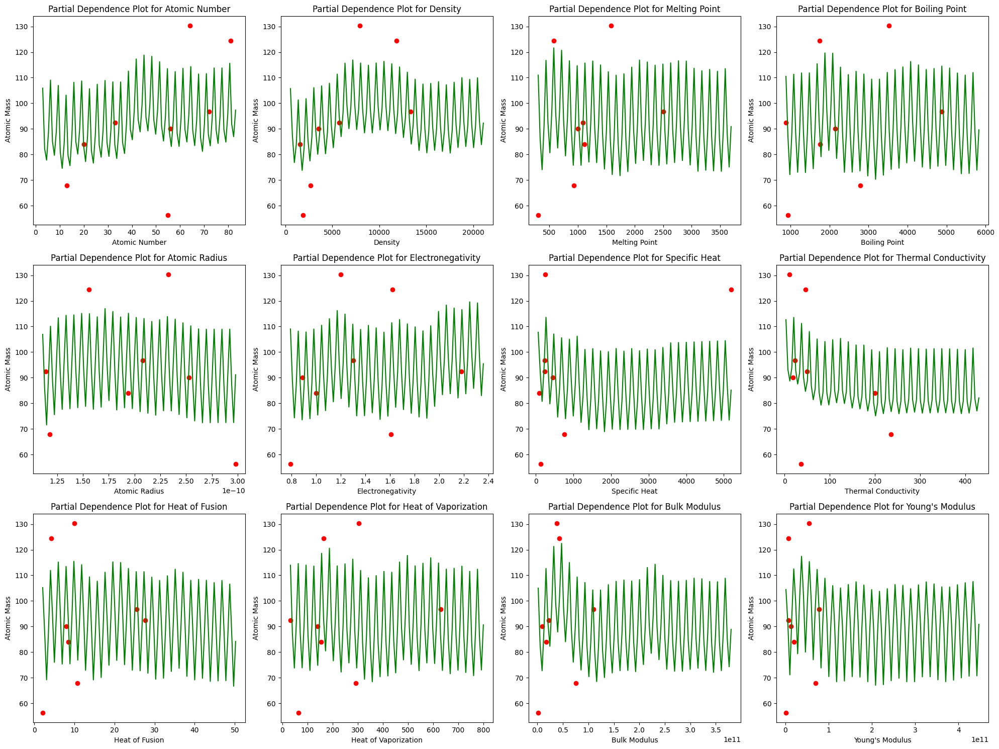

In [ ]:
from pygam import GAM, s
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
data = pd.read_csv('Modern_Periodic_Table.csv')
target_variable = 'Atomic Mass'
selected_features = ['Atomic Number', 'Density', 'Melting Point', 'Boiling Point',
                     'Atomic Radius', 'Electronegativity', 'Specific Heat', 'Thermal Conductivity',
                     'Heat of Fusion', 'Heat of Vaporization', 'Bulk Modulus', 'Young\'s Modulus']
data = data[selected_features + [target_variable]]
data.dropna(inplace=True)
X_train, X_test, y_train, y_test = train_test_split(data[selected_features], data[target_variable], test_size=0.2, random_state=42)
gam = GAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) + s(7) + s(8) + s(9) + s(10) + s(11))
gam.fit(X_train, y_train)
predictions = gam.predict(X_test)
explained_variance = 1 - np.var(y_test - predictions) / np.var(y_test)
print("R-squared:", explained_variance)
fig, axs = plt.subplots(3, len(selected_features)//3, figsize=(20, 15))
for i, feature in enumerate(selected_features):
    row = i // (len(selected_features)//3)
    col = i % (len(selected_features)//3)
    feature_values = np.linspace(np.min(data[feature]), np.max(data[feature]), 100)
    X_grid = X_test.copy()
    X_grid[feature] = np.mean(X_test[feature])
    X_grid = pd.concat([X_grid]*100, ignore_index=True)
    X_grid[feature] = np.tile(feature_values, len(X_test))
    predictions_grid = gam.predict(X_grid)
    predictions_grid = np.reshape(predictions_grid, (len(X_test), -1))
    axs[row, col].plot(feature_values, np.mean(predictions_grid, axis=0), color='green')
    axs[row, col].scatter(X_test[feature], predictions, color='red')
    axs[row, col].set_title("Partial Dependence Plot for {}".format(feature))
    axs[row, col].set_xlabel(feature)
    axs[row, col].set_ylabel("Atomic Mass")
plt.tight_layout()
plt.show()

**`Generalized Linear Model`**

                 Generalized Linear Model Regression Results                  
Dep. Variable:       Q("Atomic Mass")   No. Observations:                   90
Model:                            GLM   Df Residuals:                       84
Model Family:                Gaussian   Df Model:                            5
Link Function:               Identity   Scale:                          10.933
Method:                          IRLS   Log-Likelihood:                -232.23
Date:                Sat, 23 Mar 2024   Deviance:                       918.38
Time:                        23:33:59   Pearson chi2:                     918.
No. Iterations:                     3   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -8.7084    

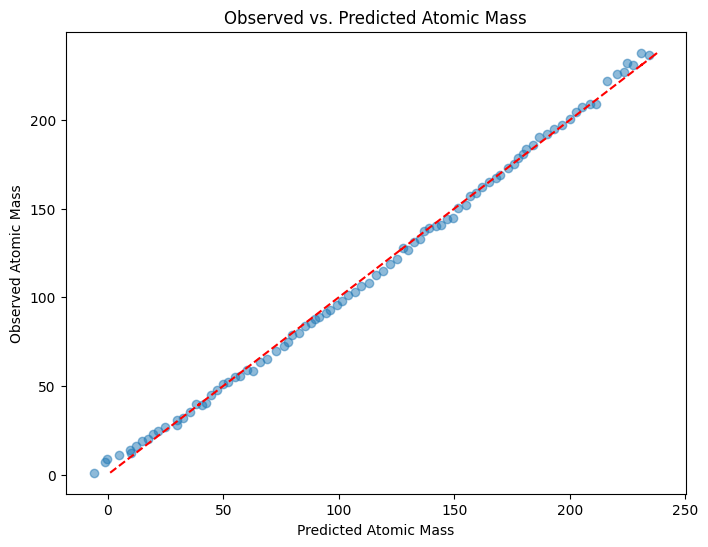

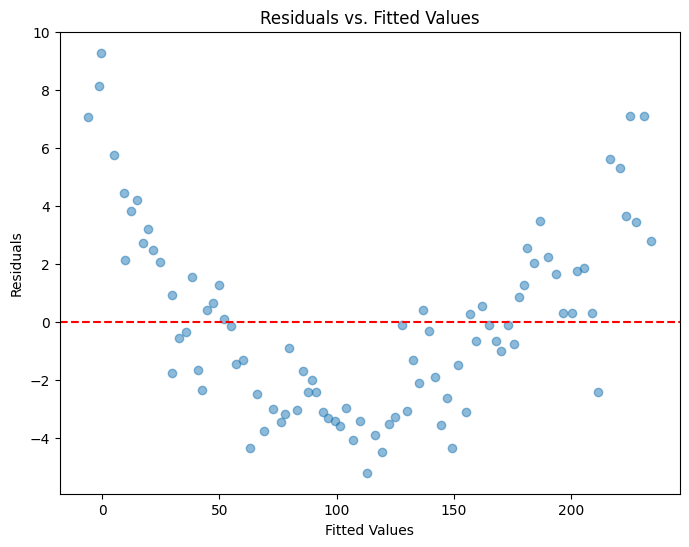

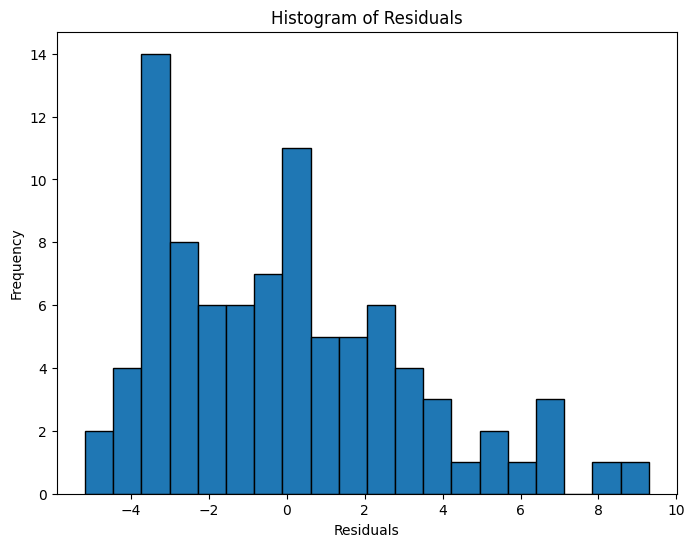

In [ ]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
data = pd.read_csv("Modern_Periodic_Table.csv")
selected_columns = ['Atomic Mass', 'Atomic Number', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion']
filtered_data = data[selected_columns].dropna()
formula = 'Q("Atomic Mass") ~ Q("Atomic Number") + Density + Q("Melting Point") + Q("Boiling Point") + Q("Heat of Fusion")'
glm_model = smf.glm(formula=formula, data=filtered_data, family=sm.families.Gaussian()).fit()
print(glm_model.summary())
plt.figure(figsize=(8, 6))
plt.scatter(glm_model.fittedvalues, filtered_data['Atomic Mass'], alpha=0.5)
plt.plot(filtered_data['Atomic Mass'], filtered_data['Atomic Mass'], color='red', linestyle='--')
plt.title('Observed vs. Predicted Atomic Mass')
plt.xlabel('Predicted Atomic Mass')
plt.ylabel('Observed Atomic Mass')
plt.show()
plt.figure(figsize=(8, 6))
plt.scatter(glm_model.fittedvalues, glm_model.resid_deviance, alpha=0.5)
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()
plt.figure(figsize=(8, 6))
plt.hist(glm_model.resid_deviance, bins=20, edgecolor='black')
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

**`Tobit Regression`**

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Density   No. Observations:                   28
Model:                            GLM   Df Residuals:                       18
Model Family:                 Tweedie   Df Model:                            9
Link Function:                    Log   Scale:                      2.2611e+06
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sat, 23 Mar 2024   Deviance:                   4.2709e+07
Time:                        23:45:08   Pearson chi2:                 4.27e+07
No. Iterations:                    17   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    6.3720 

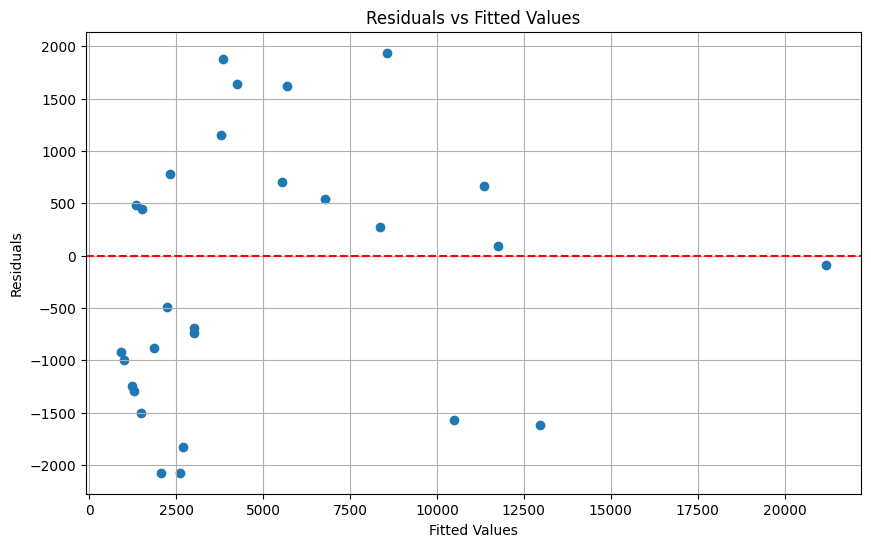

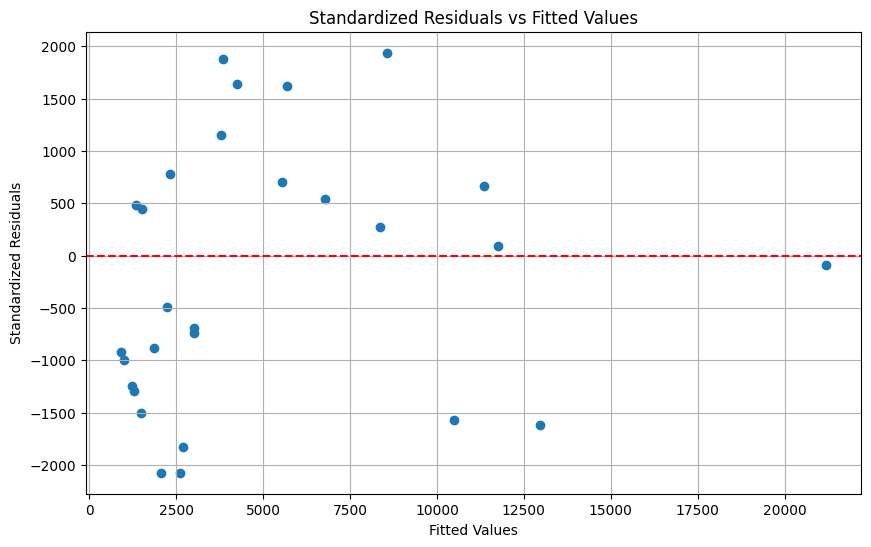

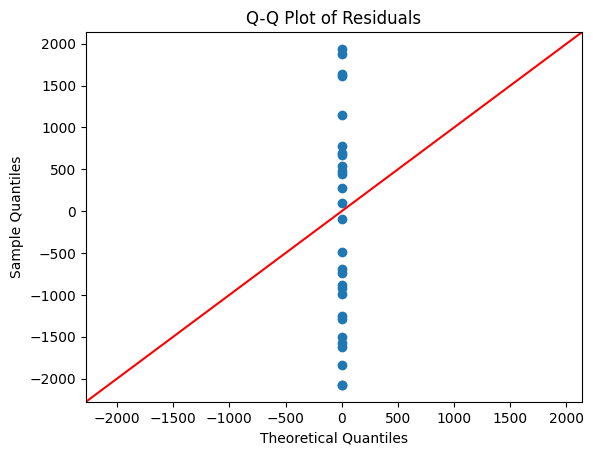

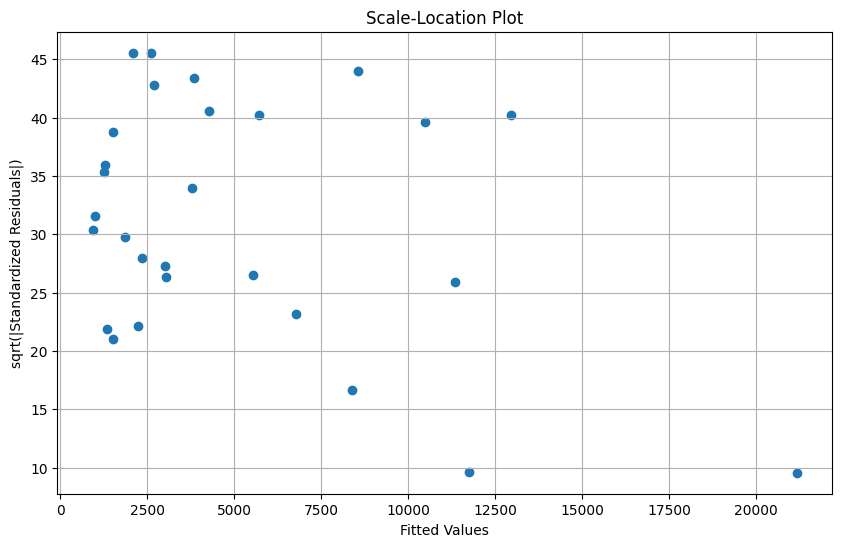

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
data = pd.read_csv('Modern_Periodic_Table.csv')
variables_of_interest = ['Density', 'Melting Point', 'Boiling Point', 'Atomic Mass', 'Electronegativity',
                         'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity',
                         'Atomic Radius', 'Covalent Radius', 'van der Waals Radius']
data.dropna(subset=variables_of_interest, inplace=True)
X = data[['Melting Point', 'Boiling Point', 'Atomic Mass', 'Electronegativity',
          'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity',
          'Atomic Radius', 'Covalent Radius', 'van der Waals Radius']]
y = data['Density']
censoring_threshold = 0
censored = (y < censoring_threshold)
y_censored = y.copy()
y_censored[y_censored < censoring_threshold] = censoring_threshold
X = sm.add_constant(X)
tobit_model = sm.GLM(y_censored, X, family=sm.families.Tweedie(var_power=0))
tobit_results = tobit_model.fit()
y_pred = tobit_results.predict(X)
y_pred[censored] = censoring_threshold
print(tobit_results.summary())
residuals = tobit_results.resid_response
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()
std_residuals = tobit_results.resid_pearson
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, std_residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Standardized Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Standardized Residuals')
plt.grid(True)
plt.show()
sm.qqplot(residuals, line='45')
plt.title('Q-Q Plot of Residuals')
plt.show()
sqrt_abs_std_residuals = np.sqrt(np.abs(std_residuals))
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, sqrt_abs_std_residuals)
plt.title('Scale-Location Plot')
plt.xlabel('Fitted Values')
plt.ylabel('sqrt(|Standardized Residuals|)')
plt.grid(True)
plt.show()

**`Poisson Regression`**

<ipython-input-5-1c42f9cc817a>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_selected.dropna(inplace=True)


                 Generalized Linear Model Regression Results                  
Dep. Variable:          Atomic Number   No. Observations:                   81
Model:                            GLM   Df Residuals:                       74
Model Family:                 Poisson   Df Model:                            6
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -416.11
Date:                Sun, 24 Mar 2024   Deviance:                       400.06
Time:                        11:00:34   Pearson chi2:                     438.
No. Iterations:                     5   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    2.5745 

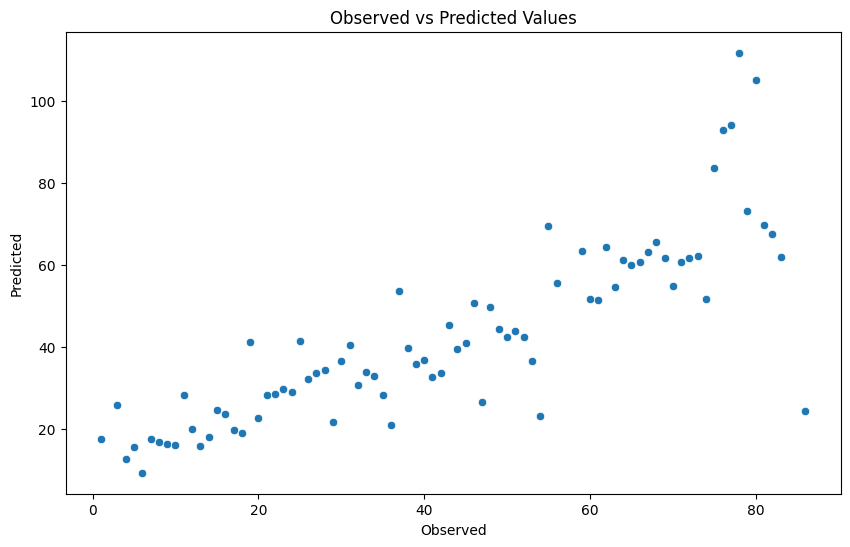

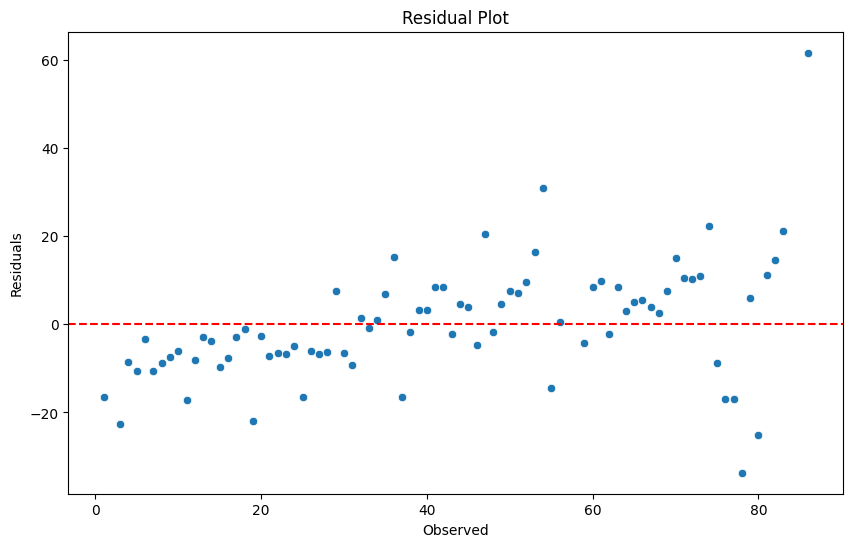

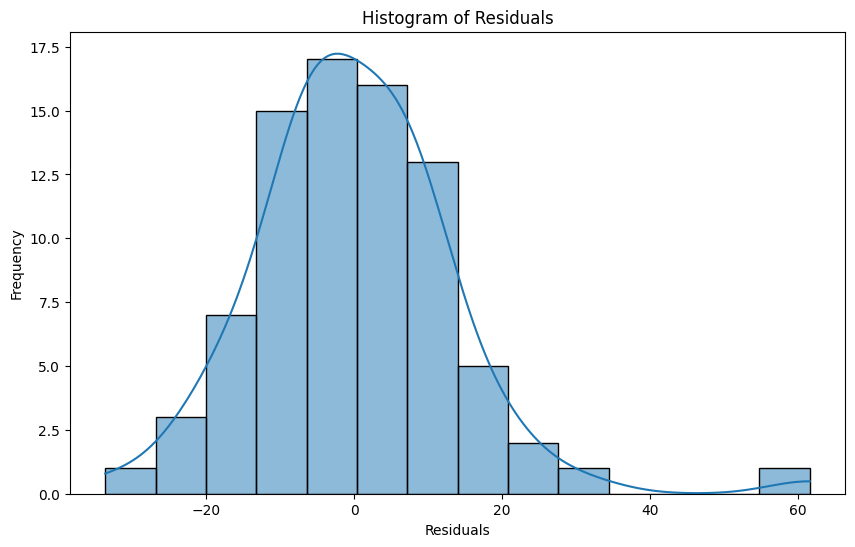

In [ ]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
data = pd.read_csv("Modern_Periodic_Table.csv")
selected_columns = ['Atomic Number', 'Density', 'Melting Point', 'Boiling Point',
                    'Heat of Fusion', 'Heat of Vaporization', 'Thermal Conductivity', 'Atomic Radius']
data_selected = data[selected_columns]
data_selected.dropna(inplace=True)
X = data_selected.drop(['Atomic Number'], axis=1)
X = sm.add_constant(X)
y = data_selected['Atomic Number']
poisson_model = sm.GLM(y, X, family=sm.families.Poisson()).fit()
print(poisson_model.summary())
predicted = poisson_model.predict(X)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y, y=predicted)
plt.xlabel('Observed')
plt.ylabel('Predicted')
plt.title('Observed vs Predicted Values')
plt.show()
residuals = y - predicted
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y, y=residuals)
plt.xlabel('Observed')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

**`Negative Binomial Regression`**

/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


                 Generalized Linear Model Regression Results                  
Dep. Variable:                Density   No. Observations:                   43
Model:                            GLM   Df Residuals:                       33
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -421.40
Date:                Sun, 24 Mar 2024   Deviance:                       2.9875
Time:                        11:17:04   Pearson chi2:                     3.24
No. Iterations:                     9   Pseudo R-squ. (CS):             0.3565
Covariance Type:            nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
intercept                5.5870 

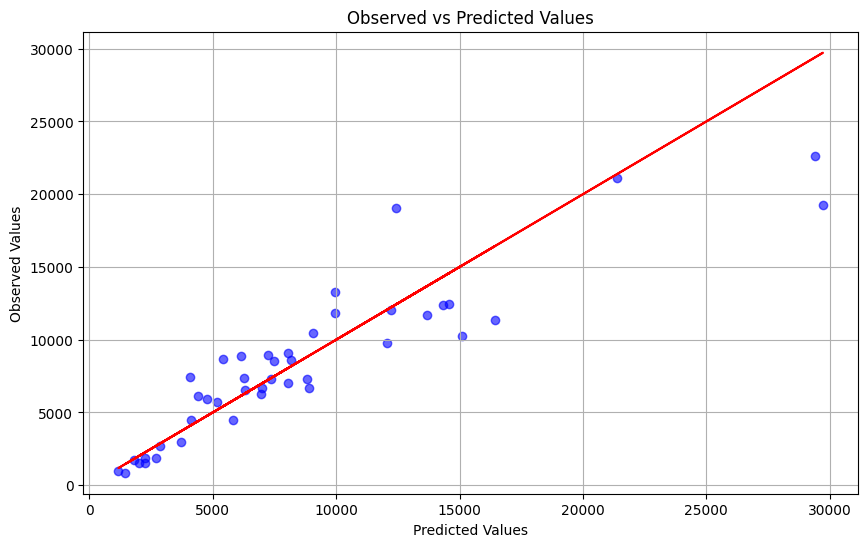

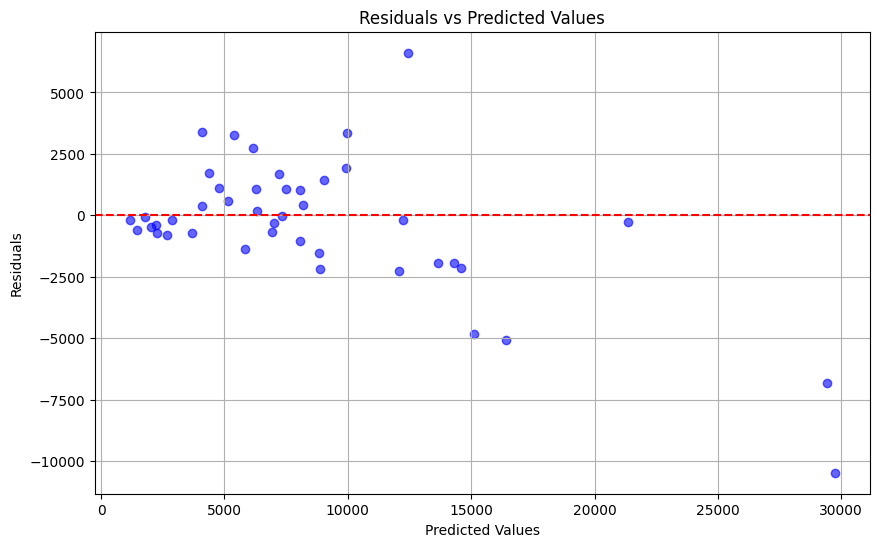

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
data = pd.read_csv('Modern_Periodic_Table.csv')
response_variable = 'Density'
predictor_variables = ['Atomic Mass', 'Melting Point', 'Boiling Point', 'Specific Heat',
                       'Atomic Number', 'Heat of Fusion', 'Heat of Vaporization',
                       'Brinell Hardness', 'Electronegativity']
data = data.dropna(subset=[response_variable] + predictor_variables)
data['intercept'] = 1
X = data[['intercept'] + predictor_variables]
y = data[response_variable]
negbin_model = sm.GLM(y, X, family=sm.families.NegativeBinomial()).fit()
print(negbin_model.summary())
print("\nConfidence Intervals:")
print(negbin_model.conf_int())
print("\nDispersion Parameter (α) =", negbin_model.scale)
plt.figure(figsize=(10, 6))
plt.scatter(negbin_model.fittedvalues, y, c='b', alpha=0.6)
plt.plot(negbin_model.fittedvalues, negbin_model.fittedvalues, c='r')
plt.title('Observed vs Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Observed Values')
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 6))
plt.scatter(negbin_model.fittedvalues, negbin_model.resid_response, c='b', alpha=0.6)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()

**`Zero-Inflated Regression`**

         Current function value: 648.448891
         Iterations: 35
         Function evaluations: 42
         Gradient evaluations: 42
                     ZeroInflatedPoisson Regression Results                    
Dep. Variable:                 Density   No. Observations:                   92
Model:             ZeroInflatedPoisson   Df Residuals:                       87
Method:                            MLE   Df Model:                            4
Date:                 Sun, 24 Mar 2024   Pseudo R-squ.:                  0.7372
Time:                         11:39:27   Log-Likelihood:                -59657.
converged:                       False   LL-Null:                   -2.2699e+05
Covariance Type:             nonrobust   LLR p-value:                     0.000
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
inflate_const   -15.7876    279.477     -0.056      0.955   

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


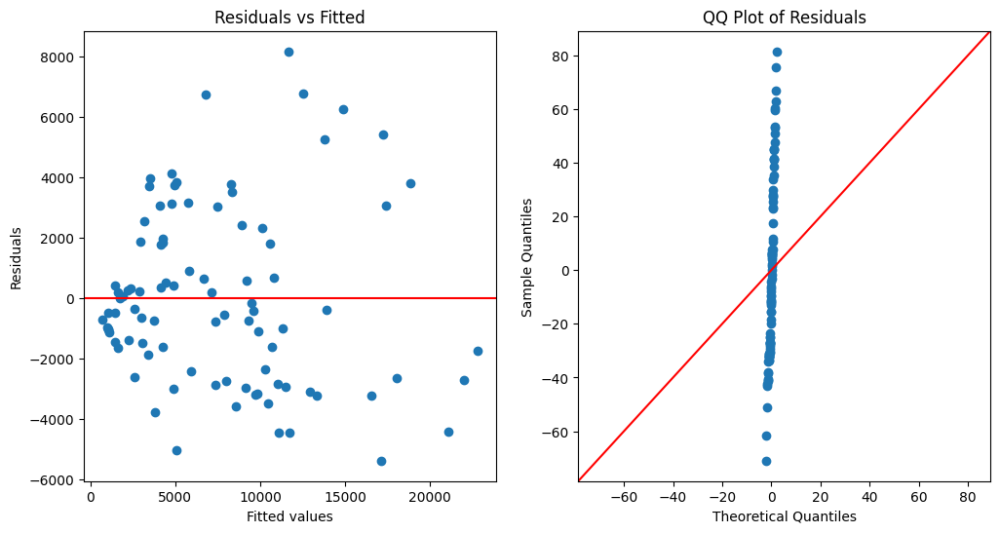

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.discrete.count_model import ZeroInflatedPoisson
import matplotlib.pyplot as plt
data = pd.read_csv('Modern_Periodic_Table.csv')
selected_columns = ['Element Name', 'Density', 'Melting Point', 'Boiling Point', 'Atomic Mass', 'Atomic Number'] # Add more columns if needed
data = data[selected_columns]
data.dropna(inplace=True)
X = data[['Melting Point', 'Boiling Point', 'Atomic Mass', 'Atomic Number']]
y = data['Density']
X = sm.add_constant(X)
model = ZeroInflatedPoisson(y, X).fit()
print(model.summary())
print("\n")
print("Log-likelihood =", model.llf)
print("Akaike Information Criterion =", model.aic)
print("Bayesian Information Criterion =", model.bic)
print("Inflation parameter =", model.params[-1])
print("\nParameter estimates for zero-inflation component:")
print(model.params[:-1])
print("\nLikelihood ratio test (LR test) =", model.llr)
print("\n")
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
predicted = model.predict(X)
residuals = model.resid
ax[0].scatter(predicted, residuals)
ax[0].axhline(y=0, color='r', linestyle='-')
ax[0].set_xlabel("Fitted values")
ax[0].set_ylabel("Residuals")
ax[0].set_title('Residuals vs Fitted')
sm.qqplot(model.resid_pearson, line='45', ax=ax[1])
ax[1].set_title('QQ Plot of Residuals')
plt.show()

**`Multilevel (or Hierarchial Regression)`**

📝 LEVEL-1 MODEL SUMMARY:
                            OLS Regression Results                            
Dep. Variable:          Boiling Point   R-squared:                       0.147
Model:                            OLS   Adj. R-squared:                  0.138
Method:                 Least Squares   F-statistic:                     15.92
Date:                Sun, 24 Mar 2024   Prob (F-statistic):           0.000133
Time:                        14:04:38   Log-Likelihood:                -818.00
No. Observations:                  94   AIC:                             1640.
Df Residuals:                      92   BIC:                             1645.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1506.8

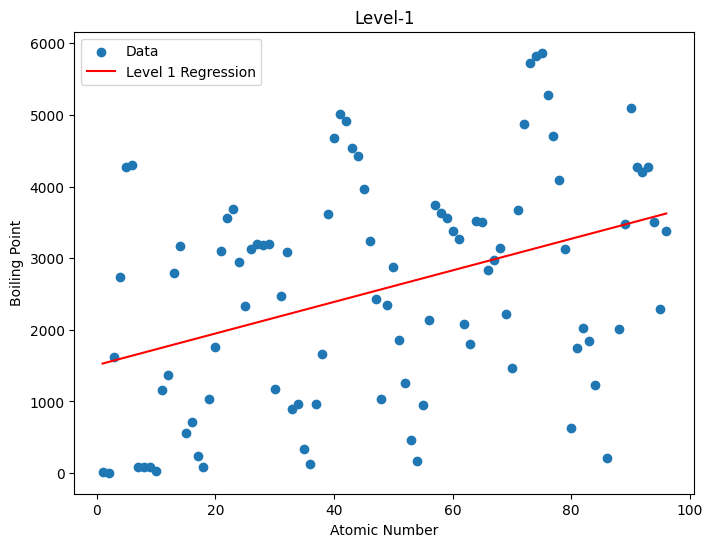


Level-1 Model: Boiling Point = 1506.869157269053 + 22.053568067954725 * Atomic Number + ε

Coefficients:
const            1506.869157
Atomic Number      22.053568
dtype: float64

Standard Errors:
const            304.232749
Atomic Number      5.527696
dtype: float64

Confidence Intervals:
                        0            1
const          902.636656  2111.101658
Atomic Number   11.075087    33.032049

R-squared = 0.147495373758331

📝 LEVEL-2 MODEL SUMMARY:


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/mixed_linear_model.py:1635: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Boiling Point
No. Observations: 94      Method:             REML         
No. Groups:       3       Scale:              1594771.1866 
Min. group size:  2       Log-Likelihood:     -790.0692    
Max. group size:  81      Converged:          Yes          
Mean group size:  31.3                                     
-----------------------------------------------------------
           Coef.   Std.Err.   z    P>|z|   [0.025   0.975] 
-----------------------------------------------------------
Liquid     481.015  892.964  0.539 0.590 -1269.163 2231.193
Solid     2943.761  140.316 20.980 0.000  2668.747 3218.775
Group Var    0.004                                         

+-----------+----------------+------------------+----------------+----------------+
|           |    Coefficient |   Standard Error |   95% CI Lower |   95% CI Upper |
|-----------+----------------+------------------+-------------

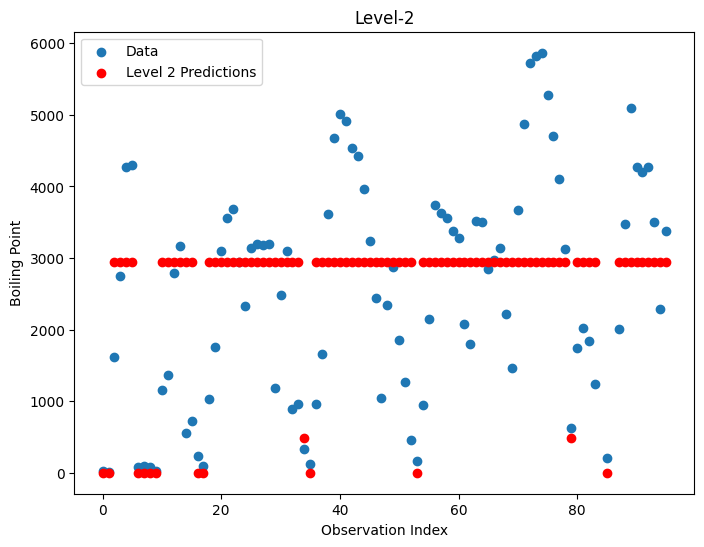


Level-2 Model: Boiling Point = 481.015 + ε

Random Effects (Group-Specific Intercept):
{'Gas': Group Var    0.000003
dtype: float64, 'Liquid': Group Var    0.0
dtype: float64, 'Solid': Group Var    3.643209e-20
dtype: float64}

Standard Errors of Random Effects:
Liquid    892.964500
Solid     140.315849
dtype: float64

Variance of Random Effects:
           Group Var
Group Var   0.004421


In [ ]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
selected_columns = ['Atomic Number', 'State', 'Boiling Point']
data = data[selected_columns]
data.dropna(inplace=True)
X_level1 = data[['Atomic Number']]
y = data['Boiling Point']
X_level1 = sm.add_constant(X_level1)
model_level1 = sm.OLS(y, X_level1).fit()
print("📝 LEVEL-1 MODEL SUMMARY:")
print(model_level1.summary())
coefficients_level1 = pd.DataFrame({
    'Coefficient': model_level1.params,
    'Standard Error': model_level1.bse,
    '95% CI Lower': model_level1.conf_int()[0],
    '95% CI Upper': model_level1.conf_int()[1]
})
print(tabulate(coefficients_level1, headers='keys', tablefmt='psql'))
plt.figure(figsize=(8, 6))
plt.scatter(X_level1['Atomic Number'], y, label='Data')
plt.plot(X_level1['Atomic Number'], model_level1.predict(X_level1), color='red', label='Level 1 Regression')
plt.xlabel('Atomic Number')
plt.ylabel('Boiling Point')
plt.title('Level-1')
plt.legend()
plt.show()
print("\nLevel-1 Model: Boiling Point = {} + {} * Atomic Number + ε".format(model_level1.params['const'], model_level1.params['Atomic Number']))
print("\nCoefficients:")
print(model_level1.params)
print("\nStandard Errors:")
print(model_level1.bse)
print("\nConfidence Intervals:")
print(model_level1.conf_int())
print("\nR-squared =",model_level1.rsquared)
X_level2 = pd.get_dummies(data['State'], drop_first=True)
groups = data['State']
model_level2 = sm.MixedLM(endog=y, exog=X_level2, groups=groups).fit()
print("\n📝 LEVEL-2 MODEL SUMMARY:")
print(model_level2.summary())
coefficients_level2 = pd.DataFrame({
    'Coefficient': model_level2.params,
    'Standard Error': model_level2.bse,
    '95% CI Lower': model_level2.conf_int()[0],
    '95% CI Upper': model_level2.conf_int()[1]
})
print(tabulate(coefficients_level2, headers='keys', tablefmt='psql'))
plt.figure(figsize=(8, 6))
plt.scatter(X_level2.index, y, label='Data')
plt.scatter(X_level2.index, model_level2.fittedvalues, color='red', label='Level 2 Predictions')
plt.xlabel('Observation Index')
plt.ylabel('Boiling Point')
plt.title('Level-2')
plt.legend()
plt.show()
print("\nLevel-2 Model: Boiling Point = {} + ε".format(model_level2.params[0]))
print("\nRandom Effects (Group-Specific Intercept):")
print(model_level2.random_effects)
print("\nStandard Errors of Random Effects:")
print(model_level2.bse_fe)
print("\nVariance of Random Effects:")
print(model_level2.cov_re)

**`Bayesian Additive Regression Trees`**

Mean Squared Error = 13501514.459433656
R-squared Score = -0.0921315799725353


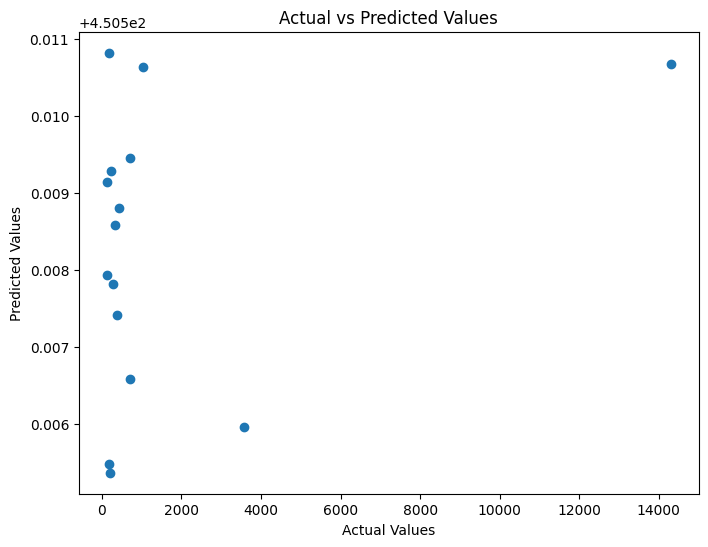

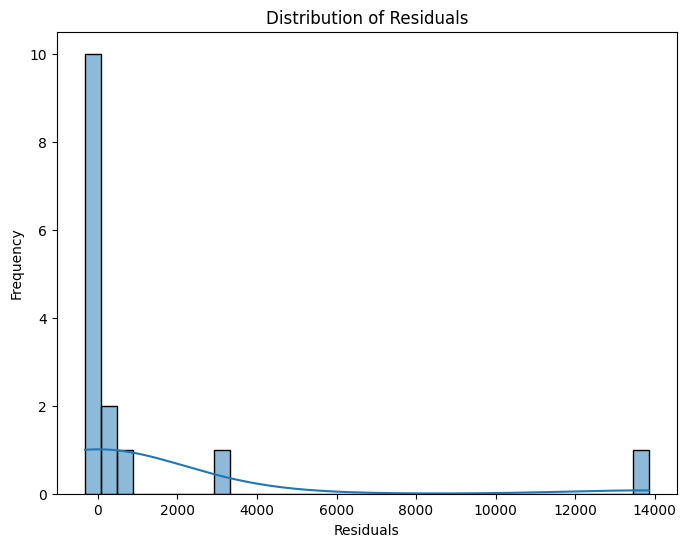

Model Coefficients:
Atomic Number: 0.00019066399279461853
Atomic Mass: 0.00023190650021817584
Density: 7.531962879696698e-05
Melting Point: -0.0008319843731492721
Boiling Point: -0.0005670385627706963
Molar Volume: -0.00018611778120774283
Atomic Radius: -0.00038332807029868696
Electronegativity: -1.7299888853648858e-05
 
Intercept = 450.50892857142856
Estimated Precision of the noise = 16.52842728723158
Estimated Variance = 1.9383265172613902e-06
 
╒═══════════════════╤═══════════════╕
│      Feature      │  Coefficient  │
╞═══════════════════╪═══════════════╡
│   Atomic Number   │   0.000191    │
├───────────────────┼───────────────┤
│    Atomic Mass    │   0.000232    │
├───────────────────┼───────────────┤
│      Density      │    7.5e-05    │
├───────────────────┼───────────────┤
│   Melting Point   │   -0.000832   │
├───────────────────┼───────────────┤
│   Boiling Point   │   -0.000567   │
├───────────────────┼───────────────┤
│   Molar Volume    │   -0.000186   │
├──────────────

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import BayesianRidge
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
data.dropna(subset=['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Specific Heat'], inplace=True)
X = data[['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
          'Molar Volume', 'Atomic Radius', 'Electronegativity']]
y = data['Specific Heat']
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
bayesian_ridge = BayesianRidge()
bayesian_ridge.fit(X_train_scaled, y_train)
predictions = bayesian_ridge.predict(X_test_scaled)
mse = mean_squared_error(y_test, predictions)
r_squared = r2_score(y_test, predictions)
print("Mean Squared Error =", mse)
print("R-squared Score =", r_squared)
plt.figure(figsize=(8, 6))
plt.scatter(y_test, predictions)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.show()
residuals = y_test - predictions
plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True)
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Distribution of Residuals")
plt.show()
print("Model Coefficients:")
for i, feature in enumerate(X.columns):
    print(f"{feature}: {bayesian_ridge.coef_[i]}")
print(" ")
print("Intercept =", bayesian_ridge.intercept_)
print("Estimated Precision of the noise =", bayesian_ridge.lambda_)
print("Estimated Variance =", bayesian_ridge.alpha_)
print(" ")
coefficients = [(feature, coef) for feature, coef in zip(X.columns, bayesian_ridge.coef_)]
highlight_threshold = 0.001
rows = []
for feature, coef in coefficients:
    coef_str = f"{coef:.6f}" if abs(coef) > highlight_threshold else f"{coef:.6f}"
    rows.append([feature, coef_str])
table_str = tabulate(rows, headers=["Feature", "Coefficient"], tablefmt="fancy_grid", numalign="center", stralign="center")
print(table_str)

**`Gaussian Process Regression`**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
data = pd.read_csv("Modern_Periodic_Table.csv")
features = ['Atomic Number', 'Period', 'Graph Period']
target = 'Half-Life'
X = data[features].values
y = data[target].values
y = np.where(np.isinf(y), np.nan, y)
y = np.where(y > 1e6, np.nan, y)
nan_indices = np.isnan(y)
X = X[~nan_indices]
y = y[~nan_indices]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
y_train = np.log(y_train)
kernel = C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2))
gp_model = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, random_state=42)
gp_model.fit(X_train, y_train)
y_pred_log, y_std_log = gp_model.predict(X_test, return_std=True)
y_pred = np.exp(y_pred_log)
y_std = np.exp(y_std_log)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error =", mse)
print("\nKernel Parameters:")
print("Constant Kernel Parameter =", gp_model.kernel_.k1.get_params()['constant_value'])
print("RBF Kernel Parameter (Length Scale) =", gp_model.kernel_.k2.get_params()['length_scale'])
print("\nModel Coefficients:")
print("Coefficients =", gp_model.alpha_)

Mean Squared Error = 27492633626.376686

Kernel Parameters:
Constant Kernel Parameter = 28.69551191637174
RBF Kernel Parameter (Length Scale) = 1.3123939762481072

Model Coefficients:
Coefficients = [-2.35763592  0.6633491   2.06819224  0.13398485  0.06298022  0.03098808
  0.95003327  0.10724019  2.96864439 -0.23384616  0.21742793 -1.45361881
  1.86787847 -2.65045595 -0.28948919 -1.01645344]


**`Functional Regression`**

In [ ]:
!pip install scikit-fda

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.7/434.7 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 51.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 7.1 MB/s eta 0:00:00
  Created wheel for fdasrsf: filename=fdasrsf-2.5.9-cp310-cp310-linux_x86_64.whl size=3081153 sha256=a3a74816f3355da515854126d70730fa86d5f8ef0ee6be829dab56f1d8f13022
  Stored in directory: /root/.cache/pip/wheels/21/42/68/fca5b3478fc522fbea1559a5a483ce876c56f33558c500b59f
Successfully built fdasrsf


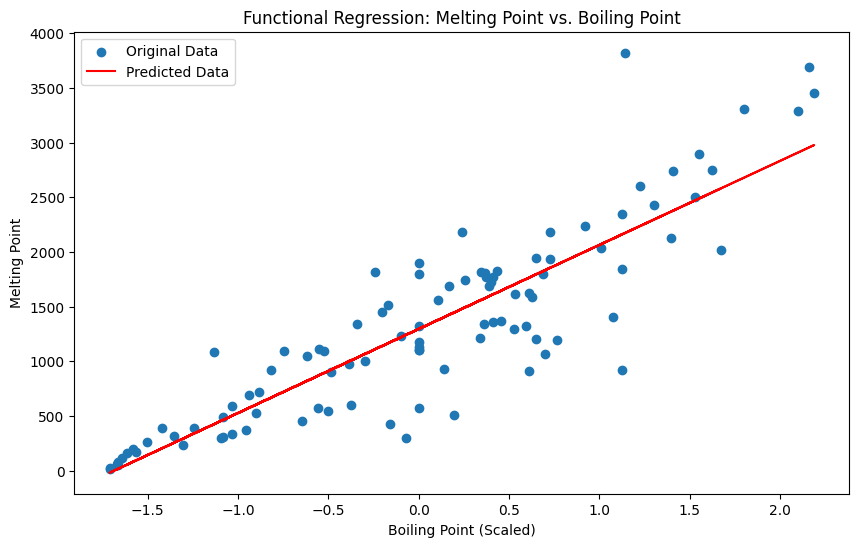

Coefficients = [768.2875635]
Intercept = 1296.574455445544
R-squared = 0.7793663987168493


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
data = pd.read_csv("Modern_Periodic_Table.csv")
melting_points = data['Melting Point']
boiling_points = data['Boiling Point']
data.dropna(subset=['Melting Point'], inplace=True)
melting_points_np = data['Melting Point'].values
boiling_points_np = data['Boiling Point'].values
imputer = SimpleImputer(strategy='mean')
boiling_points_np_imputed = imputer.fit_transform(boiling_points_np.reshape(-1, 1))
scaler = StandardScaler()
boiling_points_np_scaled = scaler.fit_transform(boiling_points_np_imputed)
ridge_regression = Ridge(alpha=1.0)
ridge_regression.fit(boiling_points_np_scaled, melting_points_np)
coefficients = ridge_regression.coef_
intercept = ridge_regression.intercept_
predicted_melting_points = ridge_regression.predict(boiling_points_np_scaled)
r_squared = r2_score(melting_points_np, predicted_melting_points)
plt.figure(figsize=(10, 6))
plt.scatter(boiling_points_np_scaled, melting_points_np, label='Original Data')
plt.plot(boiling_points_np_scaled, predicted_melting_points, color='red', label='Predicted Data')
plt.xlabel('Boiling Point (Scaled)')
plt.ylabel('Melting Point')
plt.title('Functional Regression: Melting Point vs. Boiling Point')
plt.legend()
plt.show()
print("Coefficients =", coefficients)
print("Intercept =", intercept)
print("R-squared =", r_squared)

**`Instrumental Variables Regression`**

In [ ]:
pip install linearmodels

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.2/94.2 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 4.2 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/linearmodels/iv/model.py:549: MissingValueWarning: 
Inputs contain missing values. Dropping rows with missing observations.
  super().__init__(


                            OLS Estimation Summary                            
Dep. Variable:            Atomic Mass   R-squared:                      0.9026
Estimator:                        OLS   Adj. R-squared:                 0.8880
No. Observations:                  46   F-statistic:                    491.27
Date:                Sun, Mar 24 2024   P-value (F-stat)                0.0000
Time:                        17:09:38   Distribution:                  chi2(6)
Cov. Estimator:                robust                                         
                                                                              
                                  Parameter Estimates                                   
                      Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
----------------------------------------------------------------------------------------
Density                  0.0109     0.0014     7.9148     0.0000      0.0082      0.0136
Melting Poin

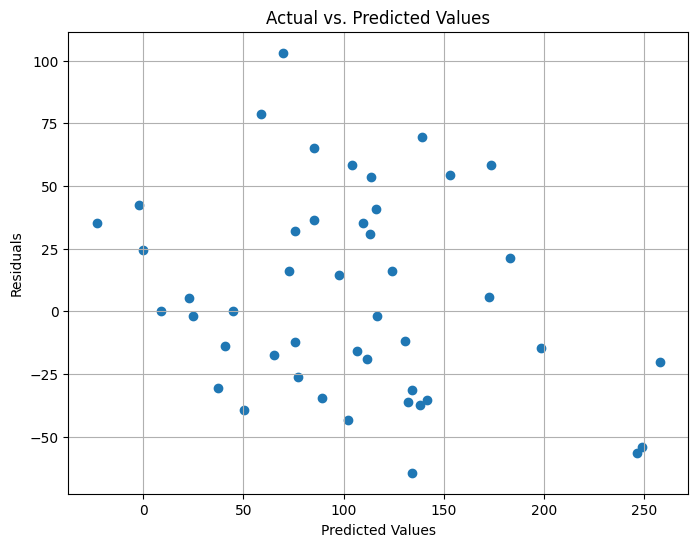

+----------------------+----------------+-----------------+-----------+-------------+
|                      |      Parameter |      Std. Error |    T-stat |     P-value |
+======================+================+=================+===========+=============+
| Density              |      0.0109139 |      0.00137892 |  7.91483  | 2.44249e-15 |
+----------------------+----------------+-----------------+-----------+-------------+
| Melting Point        |     -0.0349186 |      0.0138316  | -2.52455  | 0.0115848   |
+----------------------+----------------+-----------------+-----------+-------------+
| Boiling Point        |      0.0236822 |      0.00869224 |  2.72452  | 0.00643948  |
+----------------------+----------------+-----------------+-----------+-------------+
| Thermal Conductivity |     -0.134479  |      0.0465316  | -2.89006  | 0.00385172  |
+----------------------+----------------+-----------------+-----------+-------------+
| Specific Heat        |      0.0062814 |      0.00511

In [ ]:
import numpy as np
import pandas as pd
from linearmodels.iv import IV2SLS
import matplotlib.pyplot as plt
data = pd.read_csv('Modern_Periodic_Table.csv')
X = data[['Density', 'Melting Point', 'Boiling Point', 'Thermal Conductivity', 'Specific Heat', 'Thermal Expansion']]
Y = data['Atomic Mass']
data.dropna(subset=['Density', 'Melting Point', 'Boiling Point', 'Thermal Conductivity', 'Specific Heat', 'Thermal Expansion', 'Atomic Mass'], inplace=True)
iv_model = IV2SLS(dependent=Y, exog=X, endog=None, instruments=None)
iv_results = iv_model.fit()
print(iv_results.summary)
print("\nCoefficient Estimates:")
print(iv_results.params)
print("\nStandard Errors:")
print(iv_results.std_errors)
print("\nT-values:")
print(iv_results.tstats)
print("\nP-values:")
print(iv_results.pvalues)
print("\nR-squared:")
print(iv_results.rsquared)
print("\nF-statistic:")
print(iv_results.f_statistic.stat)
plt.figure(figsize=(8, 6))
plt.scatter(iv_results.predict(), iv_results.resids)
plt.title("Actual vs. Predicted Values")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.grid(True)
plt.show()
coef_estimates = iv_results.params.rename('Parameter')
std_errors = iv_results.std_errors.rename('Std. Error')
t_values = iv_results.tstats.rename('T-stat')
p_values = iv_results.pvalues.rename('P-value')
results_df = pd.concat([coef_estimates, std_errors, t_values, p_values], axis=1)
print(tabulate(results_df, headers='keys', tablefmt='grid'))

**`Heteroscedasticity Regression`**

Dep. Variable:                Density   R-squared:                       0.886
Model:                            WLS   Adj. R-squared:                  0.882
Method:                 Least Squares   F-statistic:                     227.4
Date:                Sun, 24 Mar 2024   Prob (F-statistic):           2.52e-41
Time:                        17:35:04   Log-Likelihood:                -847.80
No. Observations:                  92   AIC:                             1704.
Df Residuals:                      88   BIC:                             1714.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -2205.2370    458.998     -4.804      0.000   -3117.400   -1293.074
Atomic Mass      45.0878      3.601     12.

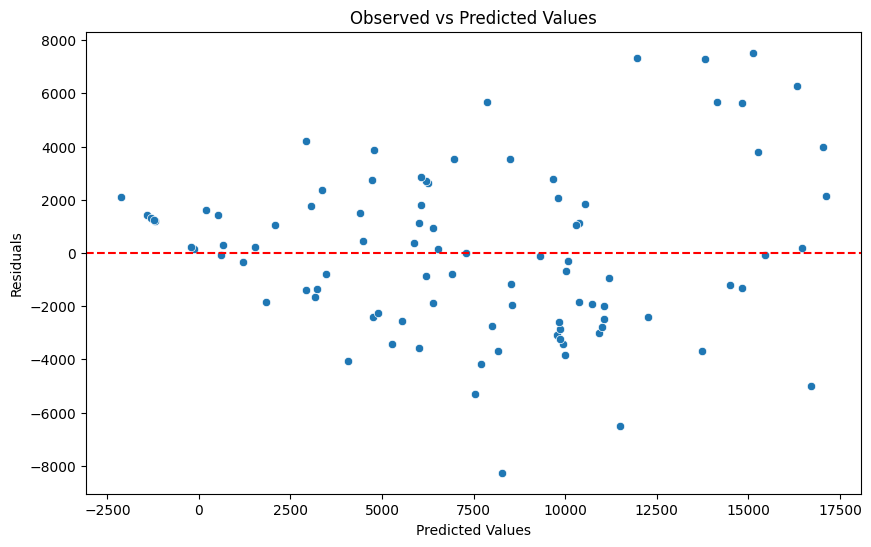

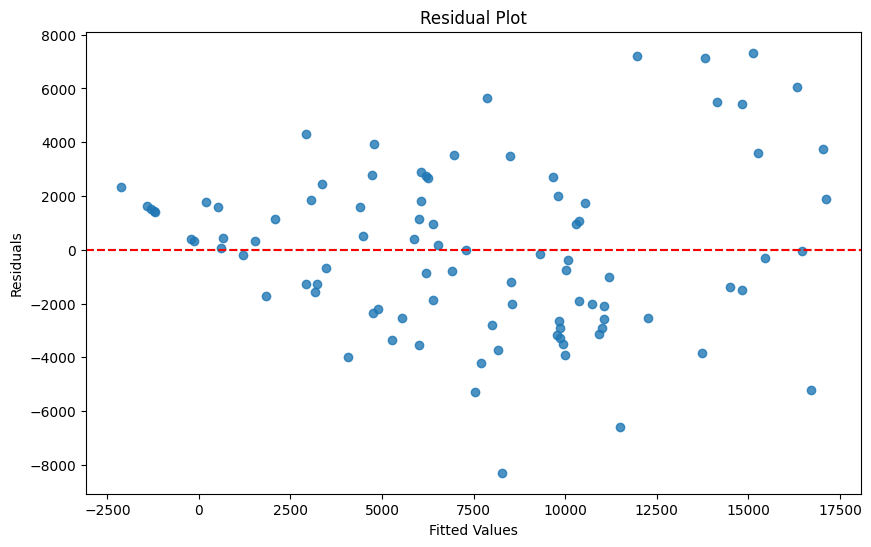

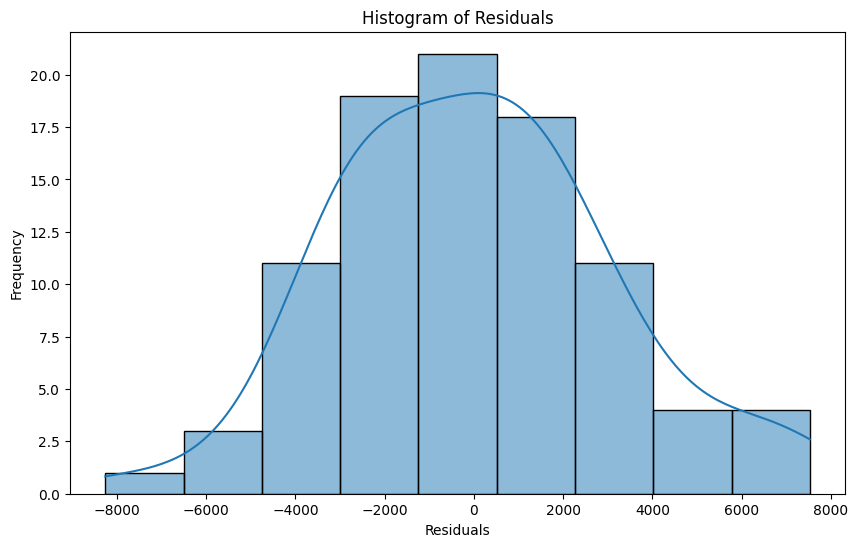


Coefficients:
const           -2205.236999
Atomic Mass        45.087847
Melting Point       0.975067
Boiling Point       1.274338
dtype: float64

Standard Errors:
const            458.998270
Atomic Mass        3.600530
Melting Point      0.597754
Boiling Point      0.379588
dtype: float64

T-values:
const            -4.804456
Atomic Mass      12.522557
Melting Point     1.631218
Boiling Point     3.357165
dtype: float64

P-values:
const            6.333224e-06
Atomic Mass      2.957548e-21
Melting Point    1.064182e-01
Boiling Point    1.164655e-03
dtype: float64

Confidence Intervals:
                         0            1
const         -3117.399609 -1293.074388
Atomic Mass      37.932549    52.243144
Melting Point    -0.212843     2.162977
Boiling Point     0.519987     2.028688

R-squared = 0.8857317485392232

Adjusted R-squared = 0.8818362399666967


In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
import matplotlib.pyplot as plt
import seaborn as sns
data = pd.read_csv('Modern_Periodic_Table.csv')
data.dropna(subset=['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point'], inplace=True)
X = data[['Atomic Mass', 'Melting Point', 'Boiling Point']]
Y = data['Density']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
residuals = model.resid
residual_var = np.var(residuals)
weights = 1 / np.sqrt(np.abs(residuals))
wls_model = sm.WLS(Y, X, weights=weights).fit()
_, bp_pvalue, _, _ = het_breuschpagan(wls_model.resid, wls_model.model.exog)
wls_model_summary = wls_model.summary(title="")
print(wls_model_summary)
print("\nBreusch-Pagan test p-value =", bp_pvalue)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=wls_model.fittedvalues, y=wls_model.resid)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Observed vs Predicted Values")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()
plt.figure(figsize=(10, 6))
sns.residplot(x=wls_model.fittedvalues, y=wls_model.resid)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()
plt.figure(figsize=(10, 6))
sns.histplot(wls_model.resid, kde=True)
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Histogram of Residuals")
plt.show()
print("\nCoefficients:")
print(wls_model.params)
print("\nStandard Errors:")
print(wls_model.bse)
print("\nT-values:")
print(wls_model.tvalues)
print("\nP-values:")
print(wls_model.pvalues)
print("\nConfidence Intervals:")
print(wls_model.conf_int())
print("\nR-squared =", wls_model.rsquared)
print("\nAdjusted R-squared =", wls_model.rsquared_adj)

**`Multivariate Regression`**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
df = pd.read_csv("Modern_Periodic_Table.csv")
X_cols = ['Atomic Number', 'Atomic Mass', 'Heat of Fusion', 'Heat of Vaporization', 'Heat of Combustion',
          'Heat of Combustion', 'Specific Heat', 'Thermal Conductivity', 'Bulk Modulus', 'Young\'s Modulus']
y_cols = ['Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization',
          'Heat of Combustion', 'Specific Heat', 'Thermal Conductivity', 'Bulk Modulus', 'Young\'s Modulus']
df.dropna(subset=X_cols + y_cols, inplace=True)
X = df[X_cols]
y = df[y_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)
model = LinearRegression()
model.fit(X_train_imputed, y_train)
y_pred = model.predict(X_test_imputed)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)
print("Coefficients:")
for i, col in enumerate(X_cols):
    print(f"{col}: {model.coef_[:, i]}")
print("Intercepts:")
for i, col in enumerate(y_cols):
    print(f"{col}: {model.intercept_[i]}")
print("\nPredicted vs. Actual:")
for i in range(min(5, len(y_test))):
    print(f"Predicted: {y_pred[i]}, Actual: {y_test.values[i]}")

Mean Squared Error: 1825050.720286342
Coefficients:
Atomic Number: [ 1.03884017e-16  6.67915613e-17 -4.10057914e-18  3.37063175e-20
 -2.00228663e-18  3.65870588e-17 -1.96321865e-16  1.37431220e-17
 -5.03619590e-10  1.32594186e-09]
Atomic Mass: [ 2.02672294e-16  1.30304208e-16 -8.05417594e-18  6.42092897e-20
 -3.91455492e-18  7.16915789e-17 -3.83070260e-16  2.68178471e-17
 -9.85783688e-10  2.58620540e-09]
Heat of Fusion: [ 7.72886668e-18  5.35662571e-18  7.64463439e-18  2.30027571e-19
  1.05456416e-18 -4.31024126e-17 -6.30274487e-18  1.80745058e-19
  4.39371392e-10  1.92302758e-10]
Heat of Vaporization: [-7.49984903e-17 -4.63827461e-17  4.06579010e-17  1.05456416e-18
  7.15268459e-18 -2.43713176e-16  1.81108191e-16 -1.39132483e-17
  2.62475946e-09 -5.13149455e-10]
Heat of Combustion: [ 7.48453212e-16  4.07408753e-16 -1.54405905e-15 -4.31024126e-17
 -2.43713176e-16  8.99370530e-15 -2.99633817e-15  2.59374610e-16
 -9.44721891e-08 -8.28919637e-09]
Heat of Combustion: [ 7.48453212e-16  4.07

**`K-Means Clustering`**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

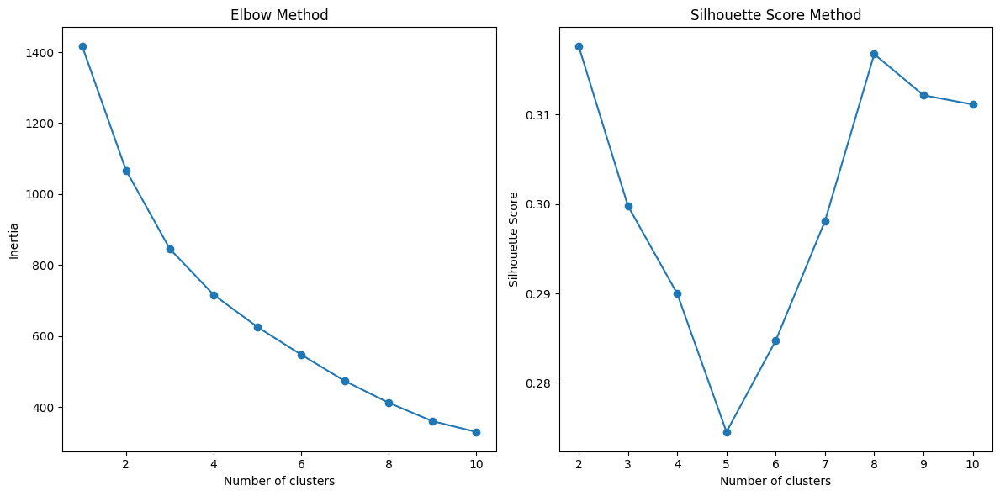

Elbow Method - Inertia Values:
Number of clusters: 1, Inertia: 1416.0
Number of clusters: 2, Inertia: 1066.8935019032494
Number of clusters: 3, Inertia: 845.3735380926038
Number of clusters: 4, Inertia: 716.1699493195086
Number of clusters: 5, Inertia: 625.45554556859
Number of clusters: 6, Inertia: 547.2617965178922
Number of clusters: 7, Inertia: 472.8796573437311
Number of clusters: 8, Inertia: 411.6578391715752
Number of clusters: 9, Inertia: 359.83732615002236
Number of clusters: 10, Inertia: 329.44076885504086

Silhouette Score Method - Silhouette Scores:
Number of clusters: 2, Silhouette Score: 0.3176281735965795
Number of clusters: 3, Silhouette Score: 0.2997862418159469
Number of clusters: 4, Silhouette Score: 0.2899669426072623
Number of clusters: 5, Silhouette Score: 0.2745133843516233
Number of clusters: 6, Silhouette Score: 0.2847347818603465
Number of clusters: 7, Silhouette Score: 0.29810321602391526
Number of clusters: 8, Silhouette Score: 0.3167709149704002
Number of c

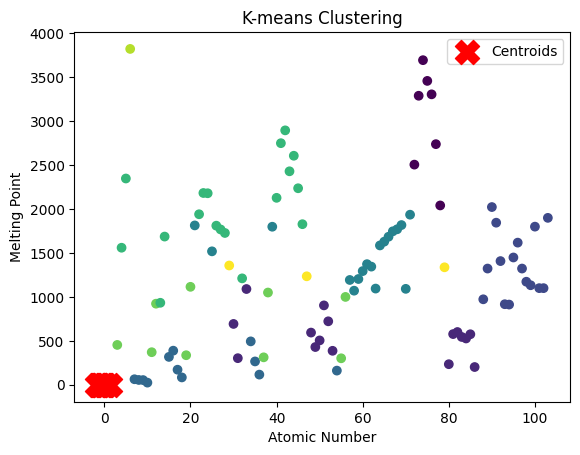

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
numerical_data = data[['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
                       'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity',
                       'Electronegativity', 'Atomic Radius', 'Covalent Radius']]
imputer = SimpleImputer(strategy='mean')
numerical_data_imputed = imputer.fit_transform(numerical_data)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numerical_data_imputed)
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    clusters = kmeans.fit_predict(scaled_data)
    silhouette_avg = silhouette_score(scaled_data, clusters)
    silhouette_scores.append(silhouette_avg)
plt.subplot(1, 2, 2)
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score Method')
plt.tight_layout()
plt.show()
best_k_elbow = inertia.index(min(inertia)) + 1
best_k_silhouette = silhouette_scores.index(max(silhouette_scores)) + 2
best_k = max(best_k_elbow, best_k_silhouette)
print("Elbow Method - Inertia Values:")
for k, inertia_value in enumerate(inertia, 1):
    print(f"Number of clusters: {k}, Inertia: {inertia_value}")
print("\nSilhouette Score Method - Silhouette Scores:")
for k, silhouette_score_value in enumerate(silhouette_scores, 2):
    print(f"Number of clusters: {k}, Silhouette Score: {silhouette_score_value}")
print("\nBest number of clusters (Elbow Method) =", best_k_elbow)
print("Best number of clusters (Silhouette Score Method) =", best_k_silhouette)
print("Best number of clusters (Overall) =", best_k)
kmeans = KMeans(n_clusters=best_k, n_init=10, random_state=42)
clusters = kmeans.fit_predict(scaled_data)
data['Cluster'] = clusters
print("\nCount of elements in each cluster:")
cluster_counts = data['Cluster'].value_counts().reset_index()
cluster_counts.columns = ['Cluster', 'Count']
cluster_counts_table = tabulate(cluster_counts, headers='keys', tablefmt='pretty', showindex=False)
print(cluster_counts_table)
print("Centroids of clusters:")
centroids_df = pd.DataFrame(kmeans.cluster_centers_, columns=numerical_data.columns)
print(tabulate(centroids_df, headers='keys', tablefmt='pretty'))
print()
cluster_stats = data.groupby('Cluster').agg({
    'Atomic Number': ['min', 'max', 'mean'],
    'Atomic Mass': ['min', 'max', 'mean'],
    'Density': ['min', 'max', 'mean'],
    'Melting Point': ['min', 'max', 'mean'],
    'Boiling Point': ['min', 'max', 'mean'],
    'Heat of Fusion': ['min', 'max', 'mean'],
    'Heat of Vaporization': ['min', 'max', 'mean'],
    'Specific Heat': ['min', 'max', 'mean'],
    'Thermal Conductivity': ['min', 'max', 'mean'],
    'Electronegativity': ['min', 'max', 'mean'],
    'Atomic Radius': ['min', 'max', 'mean'],
    'Covalent Radius': ['min', 'max', 'mean']
})
print("Statistics for each cluster:")
print(tabulate(cluster_stats, headers='keys', tablefmt='pretty'))
print()
print("Cluster Labels for each data point:")
cluster_labels_table = tabulate(data[['Element Name', 'Cluster']], headers='keys', showindex=False, tablefmt='pretty')
print(cluster_labels_table)
plt.scatter(data['Atomic Number'], data['Melting Point'], c=data['Cluster'], cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 3], s=300, c='red', marker='X', label='Centroids')
plt.xlabel('Atomic Number')
plt.ylabel('Melting Point')
plt.title('K-means Clustering')
plt.legend()
plt.show()

**`Hierarchical Clustering`**

<ipython-input-33-831667effea8>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)


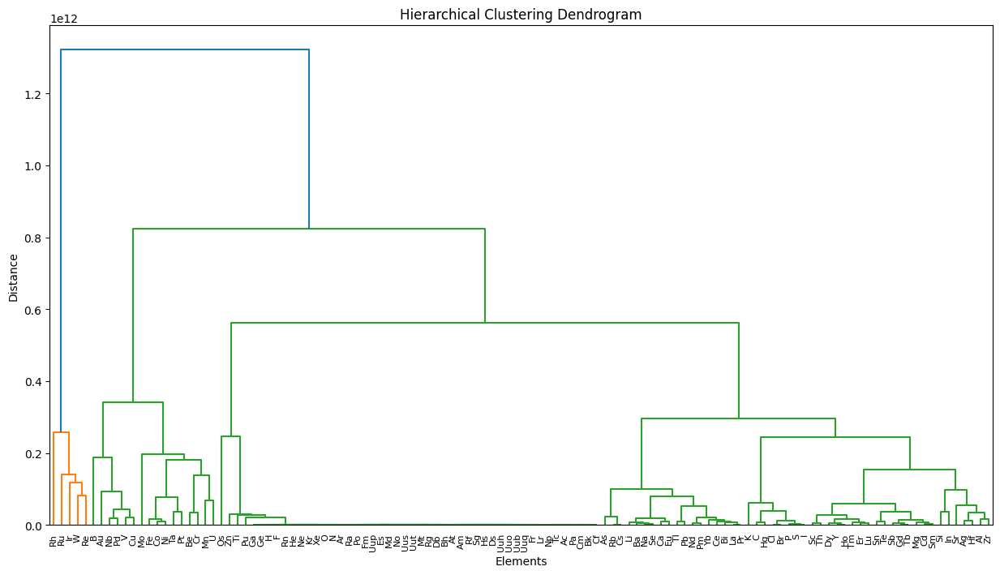

+-----+------------------+-----------+
|     | Element Symbol   |   Cluster |
+=====+==================+===========+
|   0 | H                |        26 |
+-----+------------------+-----------+
|   1 | He               |        25 |
+-----+------------------+-----------+
|   2 | Li               |        49 |
+-----+------------------+-----------+
|   3 | Be               |        17 |
+-----+------------------+-----------+
|   4 | B                |        11 |
+-----+------------------+-----------+
|   5 | C                |        61 |
+-----+------------------+-----------+
|   6 | N                |        24 |
+-----+------------------+-----------+
|   7 | O                |        24 |
+-----+------------------+-----------+
|   8 | F                |        22 |
+-----+------------------+-----------+
|   9 | Ne               |        23 |
+-----+------------------+-----------+
|  10 | Na               |        46 |
+-----+------------------+-----------+
|  11 | Mg               

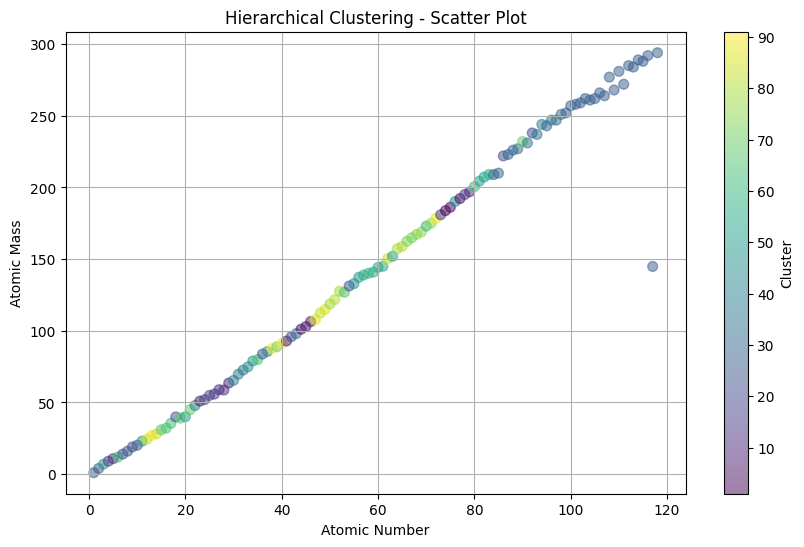

Number of clusters = 91

Elements in each cluster:
+----+-----------+------------------------------------------------------------------------------+
|    |   Cluster | Elements                                                                     |
+====+===========+==============================================================================+
|  0 |         1 | ['W']                                                                        |
+----+-----------+------------------------------------------------------------------------------+
|  1 |         2 | ['Re']                                                                       |
+----+-----------+------------------------------------------------------------------------------+
|  2 |         3 | ['Ir']                                                                       |
+----+-----------+------------------------------------------------------------------------------+
|  3 |         4 | ['Ru']                                          

In [ ]:
import pandas as pd
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import matplotlib.pyplot as plt
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
columns_for_clustering = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity', 'Molar Volume', 'Brinell Hardness', 'Mohs Hardness', 'Bulk Modulus', 'Shear Modulus', 'Young\'s Modulus', 'Refractive Index', 'Speed of Sound', 'Valency', 'Electronegativity', 'Electron Affinity', 'Autoignition Point', 'Flash Point', 'Atomic Radius', 'Covalent Radius', 'van der Waals Radius', 'Mass Magnetic Susceptibility', 'Molar Magnetic Susceptibility', 'Volume Magnetic Susceptibility']
X = data[columns_for_clustering]
X.fillna(X.mean(), inplace=True)
Z = linkage(X, 'ward')
plt.figure(figsize=(15, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Elements')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90., leaf_font_size=8., labels=data['Element Symbol'].values)
plt.show()
max_d = 1200
clusters = fcluster(Z, max_d, criterion='distance')
cluster_details = pd.DataFrame({'Element Symbol': data['Element Symbol'], 'Cluster': clusters})
print(tabulate(cluster_details, headers='keys', tablefmt='grid'))
plt.figure(figsize=(10, 6))
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=clusters, cmap='viridis', s=50, alpha=0.5)
plt.title('Hierarchical Clustering - Scatter Plot')
plt.xlabel(columns_for_clustering[0])
plt.ylabel(columns_for_clustering[1])
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()
num_clusters = cluster_details['Cluster'].nunique()
print(f"Number of clusters = {num_clusters}\n")
print("Elements in each cluster:")
cluster_elements = cluster_details.groupby('Cluster')['Element Symbol'].apply(list).reset_index(name='Elements')
print(tabulate(cluster_elements, headers='keys', tablefmt='grid'), "\n")
cluster_stats = cluster_details.groupby('Cluster').size().reset_index(name='Count')
cluster_stats['Percentage'] = cluster_stats['Count'] / len(cluster_details) * 100
print("Statistics about the clusters:")
print(tabulate(cluster_stats, headers='keys', tablefmt='grid'))
centroids = X.groupby(clusters).mean()
print("\nCentroids of clusters:")
print(tabulate(centroids, headers='keys', tablefmt='grid'))

**`Density-Based Spatial Clustering of Applications with Noise (DBSCAN)`**

Estimated number of clusters = 2
Estimated number of noise points = 74

Cluster 0:
Number of elements: 8
+-------+-----------------+---------------+------------+-----------------+-----------------+--------------------------+--------------------------+---------------------+------------------------+------------------+------------------------+----------------------+-----------------+--------------+------------------------+---------------------+------------------+----------------+--------------------+-----------------+--------------------+----------------+-----------------+-------------------+-------------------+--------------------+------------------+-----------+---------------------+---------------------+----------------------+---------------+--------------------+---------------+--------------------+----------------------+--------------------------+----------+----------+---------------------------+---------------+-------------------------+---------------+--------------------------------+

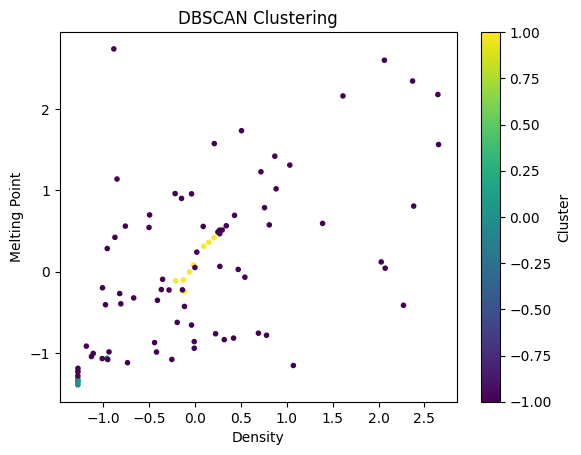

Cluster 0:
+-------+-----------------+---------------+------------+-----------------+-----------------+--------------------------+--------------------------+---------------------+------------------------+------------------+------------------------+----------------------+-----------------+--------------+------------------------+---------------------+------------------+----------------+--------------------+-----------------+--------------------+----------------+-----------------+-------------------+-------------------+--------------------+------------------+-----------+---------------------+---------------------+----------------------+---------------+--------------------+---------------+--------------------+----------------------+--------------------------+----------+----------+---------------------------+---------------+-------------------------+---------------+--------------------------------+---------------------------------+----------------------------------+-------------------------

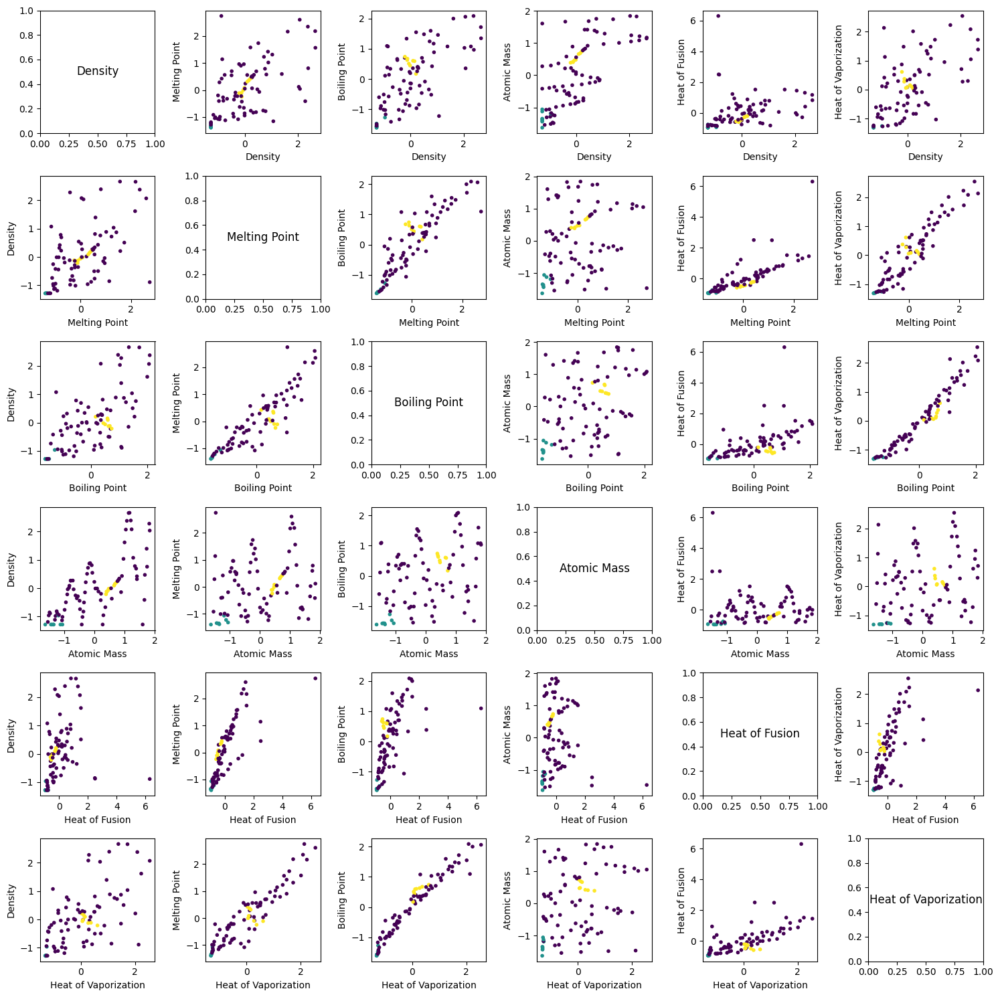

In [ ]:
import warnings
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from tabulate import tabulate
warnings.filterwarnings("ignore", message="The default value of numeric_only in DataFrame.mean is deprecated")
data = pd.read_csv("Modern_Periodic_Table.csv")
features = ['Density', 'Melting Point', 'Boiling Point', 'Atomic Mass', 'Heat of Fusion', 'Heat of Vaporization']
data.dropna(subset=features, inplace=True)
data.fillna(data.mean(), inplace=True)
X = data[features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(X_scaled)
n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise_ = list(clusters).count(-1)
print('Estimated number of clusters = %d' % n_clusters_)
print('Estimated number of noise points = %d' % n_noise_)
for cluster_label in set(clusters):
    cluster_data = data[clusters == cluster_label]
    print(f"\nCluster {cluster_label}:")
    print(f"Number of elements: {len(cluster_data)}")
    print(tabulate(cluster_data.describe(), headers='keys', tablefmt='grid'))
    print("\n")
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap='viridis', marker='.')
plt.xlabel(features[0])
plt.ylabel(features[1])
plt.title('DBSCAN Clustering')
plt.colorbar(label='Cluster')
plt.show()
for cluster_label in set(clusters):
    cluster_data = data[clusters == cluster_label]
    print(f"Cluster {cluster_label}:")
    print(tabulate(cluster_data.describe(), headers='keys', tablefmt='grid'))
    print("\n")
fig, axs = plt.subplots(len(features), len(features), figsize=(15, 15))
for i in range(len(features)):
    for j in range(len(features)):
        if i != j:
            axs[i, j].scatter(X_scaled[:, i], X_scaled[:, j], c=clusters, cmap='viridis', marker='.')
            axs[i, j].set_xlabel(features[i])
            axs[i, j].set_ylabel(features[j])
        else:
            axs[i, j].text(0.5, 0.5, features[i], fontsize=12, ha='center', va='center')
plt.tight_layout()
plt.show()

**`Mean Shift Clustering`**

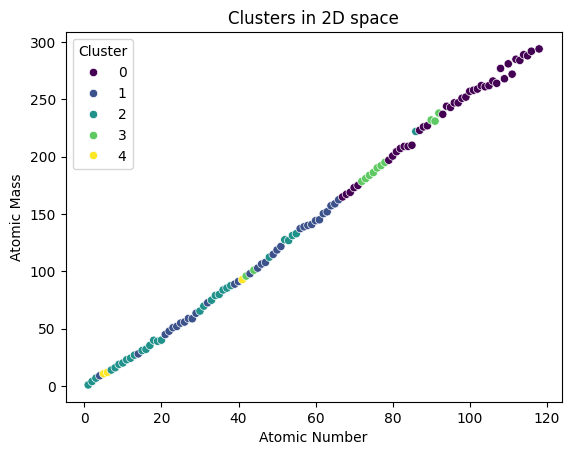

Number of clusters: 5

Cluster centers:
+-----------+---------------------+---------------------+----------------------+----------------------+----------------------+
|  Cluster  |    Atomic Number    |     Atomic Mass     |       Density        |    Melting Point     |    Boiling Point     |
+-----------+---------------------+---------------------+----------------------+----------------------+----------------------+
| Cluster 0 | 0.8307072587063183  | 0.8184528974304286  | 0.10231197316315115  | -0.03324785877776277 | 0.041003368871394066 |
| Cluster 1 | -0.4366126402467622 | -0.4525084009523405 | -0.14156109067953998 | 0.11031044864458042  | 0.15858808832470833  |
| Cluster 2 | -0.873605664565224  | -0.8702691356400386 | -0.8596913695649722  | -0.9459924396757428  | -0.9961474453083533  |
| Cluster 3 | 0.4550466375675794  | 0.47683352449603433 |  2.231466056338216   |  2.1016036601514294  |  1.8759747266205313  |
| Cluster 4 | -1.5706448457977742 | -1.5142699979966725 | -1.0127972454

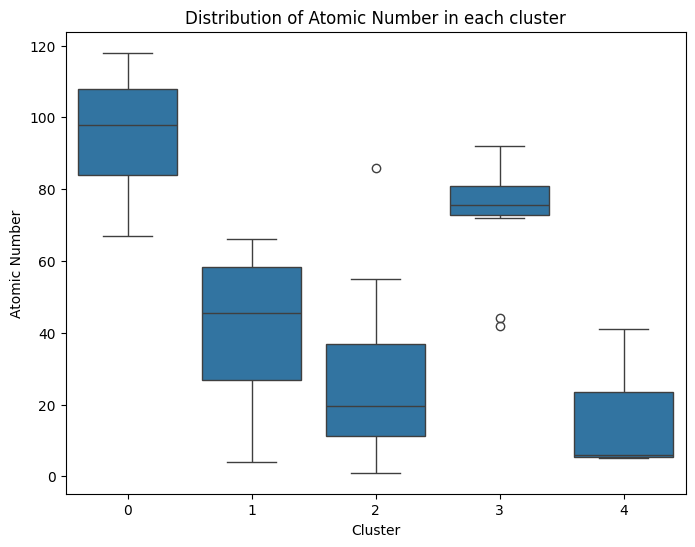

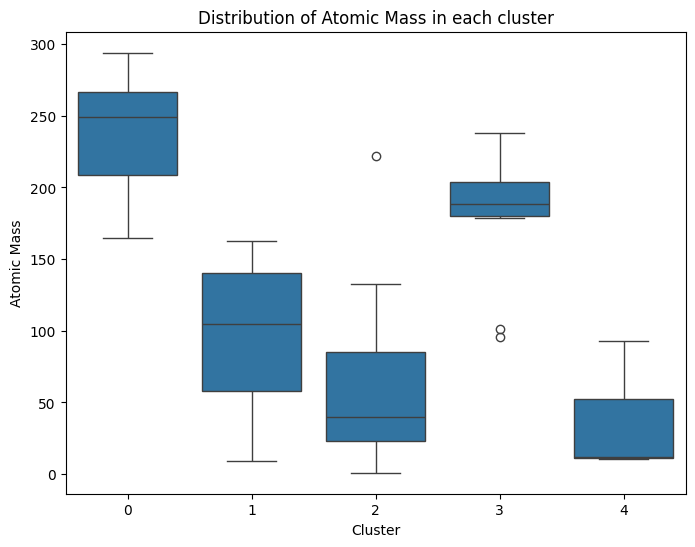

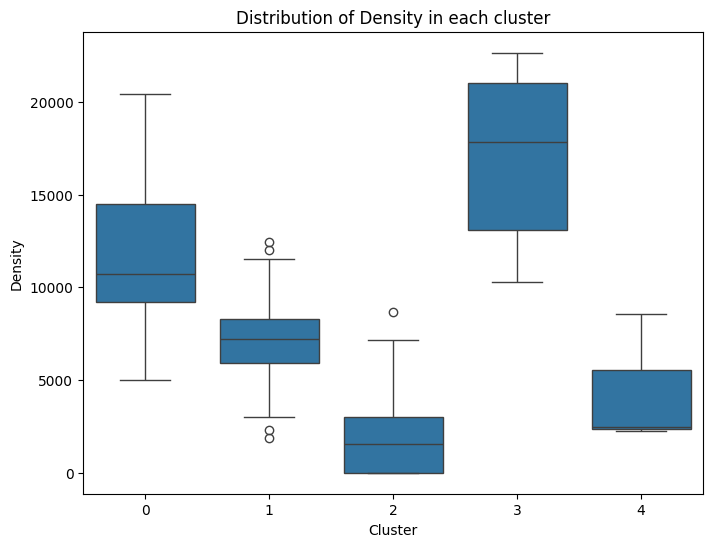

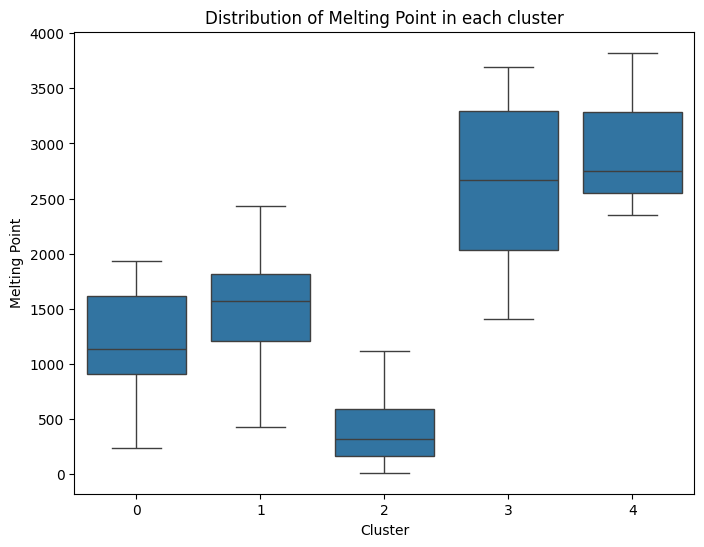

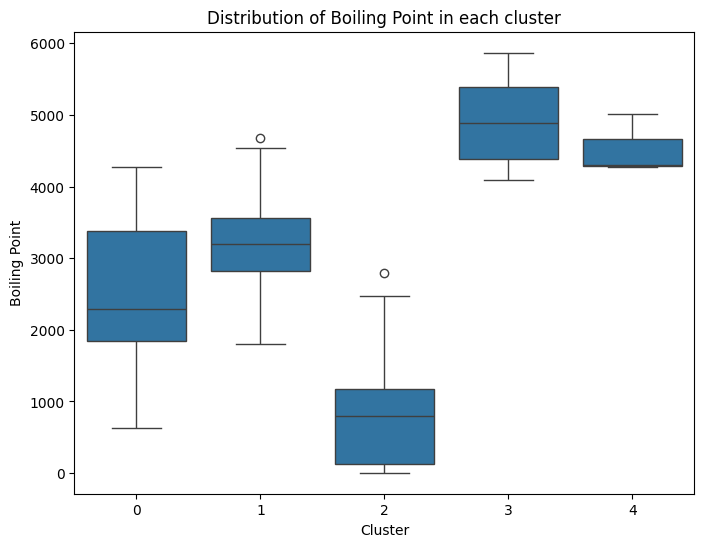

In [ ]:
import pandas as pd
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
selected_features = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point']
X = data[selected_features]
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)
bandwidth = estimate_bandwidth(X_scaled, quantile=0.2, n_samples=500)
ms = MeanShift(bandwidth=bandwidth)
ms.fit(X_scaled)
labels = ms.labels_
cluster_centers = ms.cluster_centers_
data['Cluster'] = labels
sns.scatterplot(data=data, x=selected_features[0], y=selected_features[1], hue='Cluster', palette='viridis')
plt.title('Clusters in 2D space')
plt.xlabel(selected_features[0])
plt.ylabel(selected_features[1])
plt.legend(title='Cluster')
plt.show()
num_clusters = len(cluster_centers)
print("Number of clusters:", num_clusters)
print("\nCluster centers:")
cluster_center_table = [["Cluster {}".format(i), *center] for i, center in enumerate(cluster_centers)]
print(tabulate(cluster_center_table, headers=["Cluster", *selected_features], tablefmt="pretty"))
print("\nDetails about each cluster:")
for i in range(num_clusters):
    cluster_data = data[data['Cluster'] == i][selected_features]
    num_elements = len(cluster_data)
    print("\nCluster", i, "contains", num_elements, "elements")
    print("Mean values of features in Cluster", i, ":")
    print(tabulate([["Mean"] + cluster_data.mean().tolist()], headers=["", *selected_features], tablefmt="pretty"))
for feature in selected_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=data, x='Cluster', y=feature)
    plt.title(f'Distribution of {feature} in each cluster')
    plt.xlabel('Cluster')
    plt.ylabel(feature)
    plt.show()

**`Gaussian Mixture Models (GMM)`**

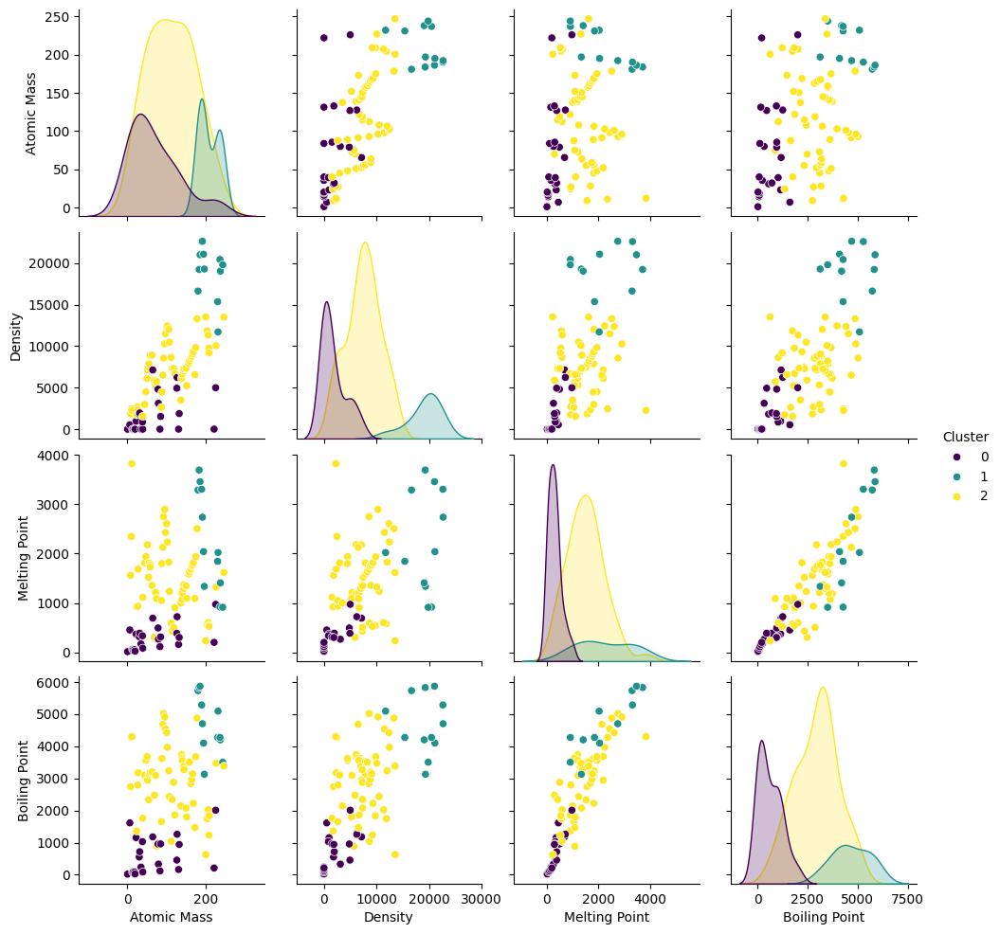

Cluster Means:
   Atomic Mass   Density  Melting Point  Boiling Point
0    -0.643621 -0.997078      -1.097573      -1.265866
1     1.325049  1.981313       1.049128       1.322568
2    -0.024108 -0.023012       0.201887       0.210244
+----+---------------+------------+-----------------+-----------------+
|    |   Atomic Mass |    Density |   Melting Point |   Boiling Point |
|----+---------------+------------+-----------------+-----------------|
|  0 |    -0.643621  | -0.997078  |       -1.09757  |       -1.26587  |
|  1 |     1.32505   |  1.98131   |        1.04913  |        1.32257  |
|  2 |    -0.0241077 | -0.0230116 |        0.201887 |        0.210244 |
+----+---------------+------------+-----------------+-----------------+

Cluster Covariances:
+----+-------------------------------+---------------------------+---------------------------------+---------------------------------+---------------------------+-----------------------+-----------------------------+-----------------------

In [ ]:
import pandas as pd
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
features = ['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point']
data.dropna(subset=features, inplace=True)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[features])
n_components = 3
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(data_scaled)
clusters = gmm.predict(data_scaled)
data['Cluster'] = clusters
sns.pairplot(data=data, vars=features, hue='Cluster', palette='viridis')
plt.show()
cluster_means = pd.DataFrame(gmm.means_, columns=features)
print("Cluster Means:")
print(cluster_means)
print(tabulate(cluster_means, headers='keys', tablefmt='psql'))
covariances_reshaped = gmm.covariances_.reshape(n_components, len(features), len(features))
covariance_data = [cov_matrix.flatten() for cov_matrix in covariances_reshaped]
cluster_covariances = pd.DataFrame(covariance_data, columns=[f'{feat1}-{feat2}_cov' for feat1 in features for feat2 in features])
print("\nCluster Covariances:")
print(tabulate(cluster_covariances, headers='keys', tablefmt='psql'))
cluster_weights = gmm.weights_
print("\nCluster Weights:", cluster_weights)

**`Spectral Clustering`**

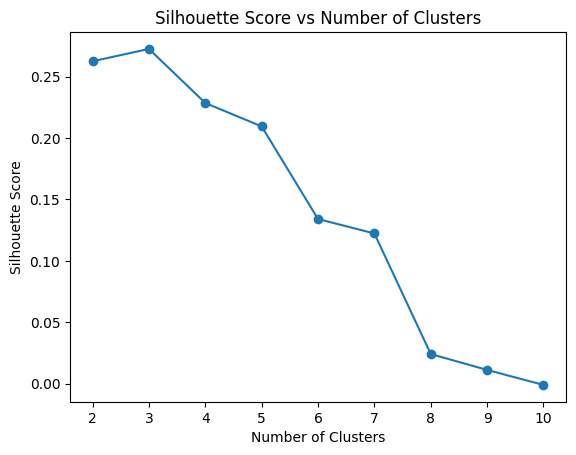

Optimal number of clusters = 3


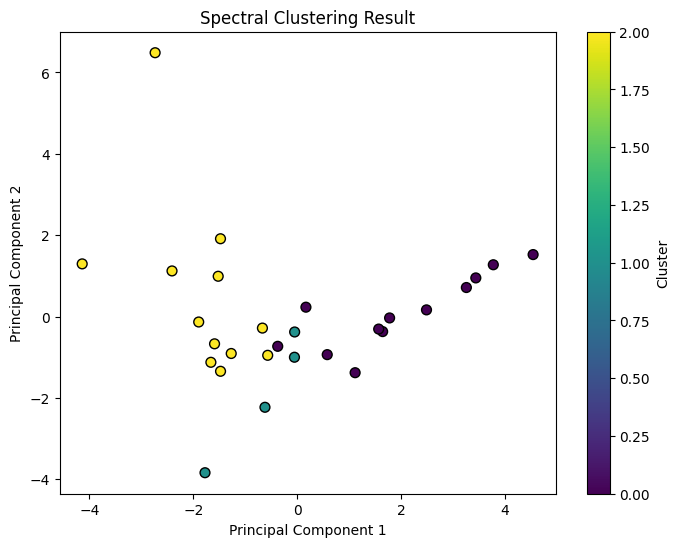

Centroid of Cluster 0:
+---------------+-----------+-----------------+-----------------+-----------------+------------------+------------------------+---------------------+-----------------+-------------------+------------------------+
|   Atomic Mass |   Density |   Melting Point |   Boiling Point |   Specific Heat |   Heat of Fusion |   Heat of Vaporization |   Electronegativity |   Atomic Radius |   Covalent Radius |   van der Waals Radius |
+===============+===========+=================+=================+=================+==================+========================+=====================+=================+===================+========================+
|         -0.30 |     -0.58 |           -0.54 |           -0.89 |            0.18 |            -0.30 |                  -0.81 |                0.80 |           -0.85 |             -0.68 |                  -0.29 |
+---------------+-----------+-----------------+-----------------+-----------------+------------------+-----------------------

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import SpectralClustering
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
columns_for_clustering = ['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Specific Heat',
                          'Heat of Fusion', 'Heat of Vaporization', 'Electronegativity', 'Atomic Radius',
                          'Covalent Radius', 'van der Waals Radius']
data.dropna(subset=columns_for_clustering, inplace=True)
X = data[columns_for_clustering]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
silhouette_scores = []
for n_clusters in range(2, 11):
    spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='rbf', random_state=42)
    cluster_labels = spectral_clustering.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.show()
optimal_n_clusters = silhouette_scores.index(max(silhouette_scores)) + 2
print("Optimal number of clusters =", optimal_n_clusters)
spectral_clustering = SpectralClustering(n_clusters=optimal_n_clusters, affinity='rbf', random_state=42)
cluster_labels = spectral_clustering.fit_predict(X_scaled)
data['Cluster'] = cluster_labels
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_labels, cmap='viridis', edgecolor='k', s=50)
plt.title('Spectral Clustering Result')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster')
plt.show()
centroids = []
for cluster_id in range(optimal_n_clusters):
    cluster_data = X_scaled[cluster_labels == cluster_id]
    centroid = np.mean(cluster_data, axis=0)
    centroids.append(centroid)
for i, centroid in enumerate(centroids):
    print(f"Centroid of Cluster {i}:")
    print(tabulate([centroid], headers=columns_for_clustering, tablefmt='grid', floatfmt=".2f"))
    print()
print(tabulate(data[['Element Name', 'Cluster']], headers='keys', tablefmt='grid'))

**`Affinity Propagation`**



Cluster assignments:
+-----+----------------+-----------+
|     | Element Name   |   Cluster |
+=====+================+===========+
|   0 | Hydrogen       |         0 |
+-----+----------------+-----------+
|   1 | Helium         |         4 |
+-----+----------------+-----------+
|   2 | Lithium        |         6 |
+-----+----------------+-----------+
|   3 | Beryllium      |         1 |
+-----+----------------+-----------+
|   4 | Boron          |         2 |
+-----+----------------+-----------+
|   5 | Carbon         |         3 |
+-----+----------------+-----------+
|   6 | Nitrogen       |         4 |
+-----+----------------+-----------+
|   7 | Oxygen         |         4 |
+-----+----------------+-----------+
|   8 | Fluorine       |         4 |
+-----+----------------+-----------+
|   9 | Neon           |         4 |
+-----+----------------+-----------+
|  10 | Sodium         |         5 |
+-----+----------------+-----------+
|  11 | Magnesium      |         6 |
+-----+---------

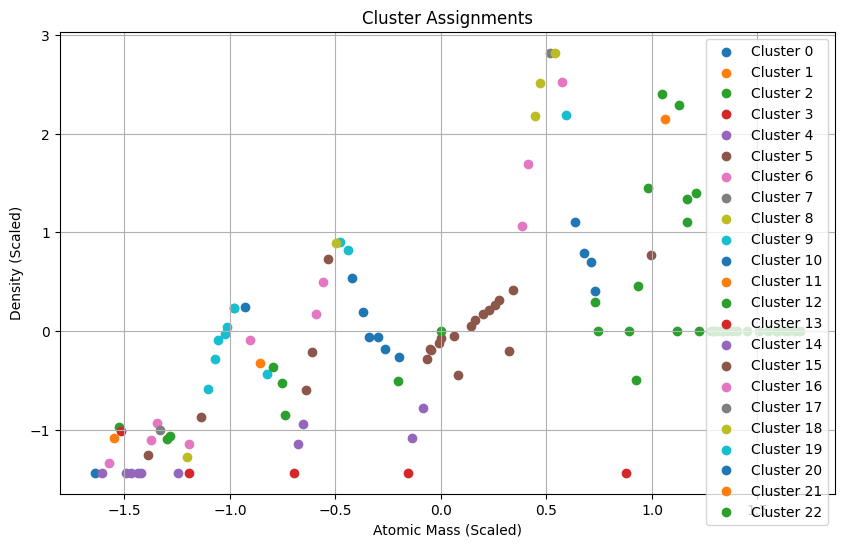

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import AffinityPropagation
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import silhouette_score
from tabulate import tabulate
import matplotlib.pyplot as plt
data = pd.read_csv("Modern_Periodic_Table.csv")
X = data[['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization',
          'Heat of Combustion', 'Specific Heat', 'Thermal Conductivity', 'Thermal Expansion', 'Liquid Density',
          'Molar Volume', 'Brinell Hardness', 'Mohs Hardness', 'Vickers Hardness', 'Bulk Modulus', 'Shear Modulus',
          "Young's Modulus", "Poisson's Ratio", 'Refractive Index', 'Speed of Sound', 'Atomic Radius', 'Covalent Radius',
          'van der Waals Radius']]
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)
aff_prop = AffinityPropagation(damping=0.7)
aff_prop.fit(X_scaled)
cluster_labels = aff_prop.labels_
data['Cluster'] = cluster_labels
cluster_assignments = data[['Element Name', 'Cluster']]
print("\nCluster assignments:")
print(tabulate(cluster_assignments, headers="keys", tablefmt="grid"))
silhouette_avg = silhouette_score(X_scaled, cluster_labels)
table = [["Silhouette Score:", silhouette_avg]]
print(tabulate(table, headers=["Metric", "Value"], tablefmt="grid"))
cluster_counts = np.bincount(cluster_labels)
centroids = []
for cluster_label in set(cluster_labels):
    centroid = X_scaled[cluster_labels == cluster_label].mean(axis=0)
    centroids.append(centroid)
cluster_details = []
for i, centroid in enumerate(centroids):
    cluster_detail = [f"Cluster {i}", cluster_counts[i], centroid]
    cluster_details.append(cluster_detail)
print("\nCluster Details:")
print(tabulate(cluster_details, headers=["Cluster", "Number of Elements", "Centroid"], tablefmt="grid"))
plt.figure(figsize=(10, 6))
for cluster_label in set(cluster_labels):
    cluster_data = X_scaled[cluster_labels == cluster_label]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_label}')
plt.title('Cluster Assignments')
plt.xlabel('Atomic Mass (Scaled)')
plt.ylabel('Density (Scaled)')
plt.legend()
plt.grid(True)
plt.show()

**`Fuzzy Clustering (Fuzzy C-Means)`**

In [ ]:
pip install -U scikit-fuzzy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894078 sha256=2c807fde054aeca54ec6893ea0f68f992e80e3bd98e4cf92185324e8b1b8bbb1
  Stored in directory: /root/.cache/pip/wheels/4f/86/1b/dfd97134a2c8313e519bcebd95d3fedc7be7944db022094bc8
Successfully built scikit-fuzzy


<ipython-input-28-bf612496d238>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features.fillna(features.mean(), inplace=True)


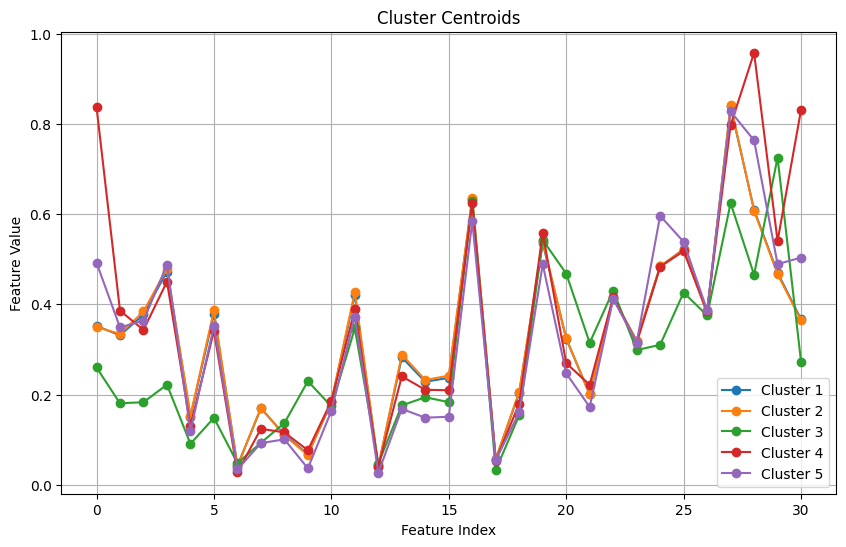

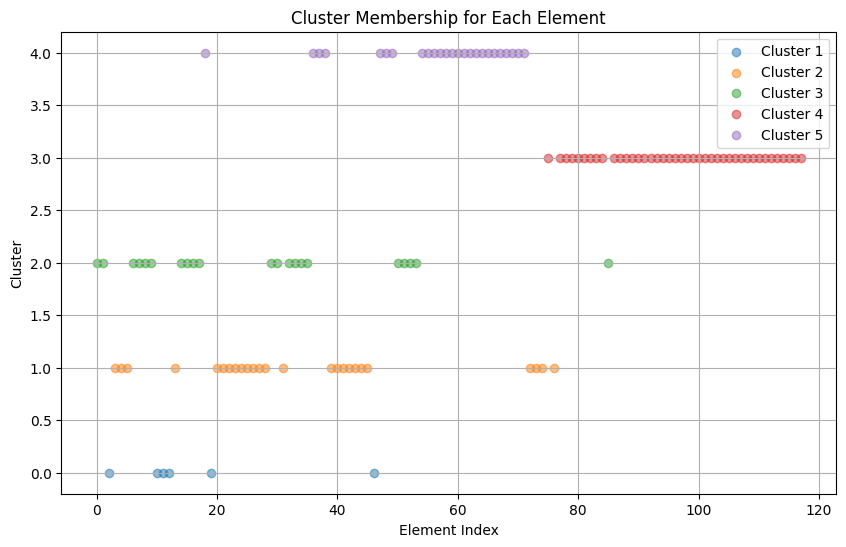

Cluster centroids:
Cluster 1 = [0.35224751 0.33133926 0.37762399 0.47290399 0.15038503 0.37932159
 0.04153911 0.16940883 0.11119145 0.06762112 0.18246109 0.42137166
 0.04058959 0.28241677 0.22834902 0.2371479  0.63472141 0.05660857
 0.20404902 0.53606525 0.32393851 0.20027425 0.41458204 0.31965722
 0.48411833 0.52228395 0.38070476 0.83896965 0.60935505 0.47028585
 0.36693611]
Cluster 2 = [0.34964699 0.33455158 0.38421856 0.47929646 0.15288141 0.38644828
 0.04135077 0.17062049 0.10934746 0.06589507 0.18431827 0.42740735
 0.04051541 0.28883684 0.23226477 0.24202709 0.63593728 0.05687217
 0.20617525 0.53974903 0.32505626 0.20024697 0.41386223 0.31958824
 0.48435271 0.52155726 0.38024172 0.84173441 0.6077056  0.46706167
 0.36447373]
Cluster 3 = [0.26003131 0.18065961 0.18307323 0.2219389  0.09075169 0.1483403
 0.04791532 0.09299308 0.13669569 0.22970056 0.17393543 0.34701735
 0.04678506 0.17601393 0.19395691 0.18320952 0.62854185 0.03260042
 0.15430365 0.5427713  0.46833195 0.31459465 0.43

In [ ]:
import numpy as np
import pandas as pd
import skfuzzy as fuzz
import matplotlib.pyplot as plt
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
features = data[['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization',
                 'Specific Heat', 'Thermal Conductivity', 'Thermal Expansion', 'Molar Volume', 'Brinell Hardness',
                 'Mohs Hardness', 'Vickers Hardness', 'Bulk Modulus', 'Shear Modulus', "Young's Modulus",
                 "Poisson's Ratio", 'Refractive Index', 'Speed of Sound', 'Valency', 'Electronegativity',
                 'Electron Affinity', 'Autoignition Point', 'Flash Point', 'Atomic Radius', 'Covalent Radius',
                 'van der Waals Radius', 'Space Group Number', 'Period', 'Group', 'Atomic Number']]
features.fillna(features.mean(), inplace=True)
features_array = features.values
normalized_data = (features_array - features_array.min(axis=0)) / (features_array.max(axis=0) - features_array.min(axis=0))
num_clusters = 5
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(normalized_data.T, num_clusters, 2, error=0.005, maxiter=1000, init=None)
cluster_centroids = cntr
cluster_membership = np.argmax(u, axis=0)
data['Cluster'] = cluster_membership
plt.figure(figsize=(10, 6))
for i, centroid in enumerate(cluster_centroids):
    plt.plot(centroid, label=f'Cluster {i+1}', marker='o')
plt.title('Cluster Centroids')
plt.xlabel('Feature Index')
plt.ylabel('Feature Value')
plt.legend()
plt.grid(True)
plt.show()
plt.figure(figsize=(10, 6))
for i in range(num_clusters):
    cluster_elements = data[data['Cluster'] == i]
    plt.scatter(cluster_elements.index, cluster_elements['Cluster'], label=f'Cluster {i+1}', alpha=0.5)
plt.title('Cluster Membership for Each Element')
plt.xlabel('Element Index')
plt.ylabel('Cluster')
plt.legend()
plt.grid(True)
plt.show()
print("Cluster centroids:")
for i, centroid in enumerate(cluster_centroids):
    print(f"Cluster {i+1} = {centroid}")
print("\nCluster membership for each element:")
print(tabulate(data[['Element Name', 'Cluster']], headers='keys', tablefmt='psql'))

**`Balanced Iterative Reducing and Clustering using Hierarchies (BIRCH)`**

+-----------+----------+-------+-----------------------------------------+------+----------------------------------------+
| Cluster   | Size     |       | Mean                                    |      | Std                                    |
+===========+==========+=======+=========================================+======+========================================+
| Cluster 0 | Size: 78 | Mean: | Atomic Number                 70.192308 | Std: | Atomic Number                32.834515 |
|           |          |       | Atomic Mass                  172.159152 |      | Atomic Mass                  85.645205 |
|           |          |       | Density                    10523.581818 |      | Density                    5660.071220 |
|           |          |       | Melting Point               1806.204839 |      | Melting Point               720.022803 |
|           |          |       | Boiling Point               3682.038889 |      | Boiling Point               957.859064 |
|           |   

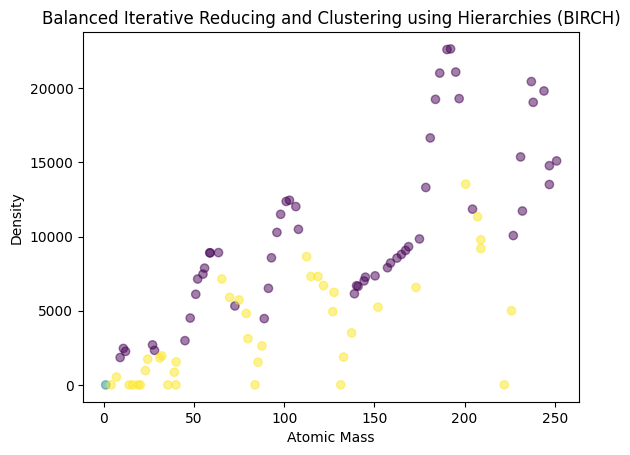

In [ ]:
import pandas as pd
from sklearn.cluster import Birch
from sklearn.preprocessing import StandardScaler
from tabulate import tabulate
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
pd.options.mode.chained_assignment = None
data = pd.read_csv("Modern_Periodic_Table.csv")
features = data[['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Specific Heat']]
features.fillna(features.mean(), inplace=True)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)
birch = Birch(threshold=0.5, branching_factor=50)
birch.fit(scaled_features)
clusters = birch.predict(scaled_features)
data['Cluster'] = clusters
cluster_details = []
for cluster_id in sorted(set(clusters)):
    cluster_data = data[data['Cluster'] == cluster_id]
    cluster_size = len(cluster_data)
    cluster_mean = cluster_data.mean()
    cluster_std = cluster_data.std()
    cluster_details.append([f"Cluster {cluster_id}", f"Size: {cluster_size}", "Mean:", cluster_mean, "Std:", cluster_std])
print(tabulate(cluster_details, headers=['Cluster', 'Size', '', 'Mean', '', 'Std'], tablefmt='grid'))
plt.scatter(data['Atomic Mass'], data['Density'], c=data['Cluster'], cmap='viridis', alpha=0.5)
plt.xlabel('Atomic Mass')
plt.ylabel('Density')
plt.title('Balanced Iterative Reducing and Clustering using Hierarchies (BIRCH)')
plt.show()

**`Self-Organizing Maps (SOM)`**

In [ ]:
pip install MiniSom

  Preparing metadata (setup.py) ... done
  Created wheel for MiniSom: filename=MiniSom-2.3.2-py3-none-any.whl size=10650 sha256=0a8db46e8c7907396f05ffa09a4eaa70e22fdc9907c7a06c9a0d4dc34f0988db
  Stored in directory: /root/.cache/pip/wheels/b4/f6/8a/9daf8831901c3e3805775633404248f10663d1c80b7e5a1314
Successfully built MiniSom


Epoch 1/100
Epoch 2/100
Epoch 3/100
Epoch 4/100
Epoch 5/100
Epoch 6/100
Epoch 7/100
Epoch 8/100
Epoch 9/100
Epoch 10/100
Epoch 11/100
Epoch 12/100
Epoch 13/100
Epoch 14/100
Epoch 15/100
Epoch 16/100
Epoch 17/100
Epoch 18/100
Epoch 19/100
Epoch 20/100
Epoch 21/100
Epoch 22/100
Epoch 23/100
Epoch 24/100
Epoch 25/100
Epoch 26/100
Epoch 27/100
Epoch 28/100
Epoch 29/100
Epoch 30/100
Epoch 31/100
Epoch 32/100
Epoch 33/100
Epoch 34/100
Epoch 35/100
Epoch 36/100
Epoch 37/100
Epoch 38/100
Epoch 39/100
Epoch 40/100
Epoch 41/100
Epoch 42/100
Epoch 43/100
Epoch 44/100
Epoch 45/100
Epoch 46/100
Epoch 47/100
Epoch 48/100
Epoch 49/100
Epoch 50/100
Epoch 51/100
Epoch 52/100
Epoch 53/100
Epoch 54/100
Epoch 55/100
Epoch 56/100
Epoch 57/100
Epoch 58/100
Epoch 59/100
Epoch 60/100
Epoch 61/100
Epoch 62/100
Epoch 63/100
Epoch 64/100
Epoch 65/100
Epoch 66/100
Epoch 67/100
Epoch 68/100
Epoch 69/100
Epoch 70/100
Epoch 71/100
Epoch 72/100
Epoch 73/100
Epoch 74/100
Epoch 75/100
Epoch 76/100
Epoch 77/100
Epoch 78

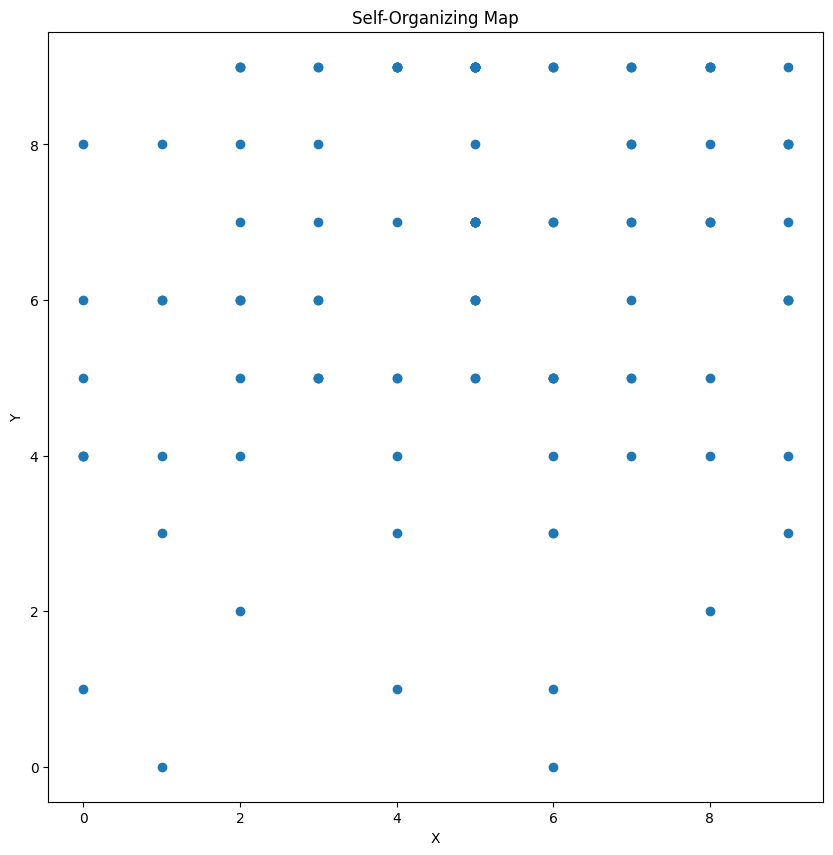

 [ 100 / 100 ] 100% - 0:00:00 left 
 quantization error: 1.0481446753584212


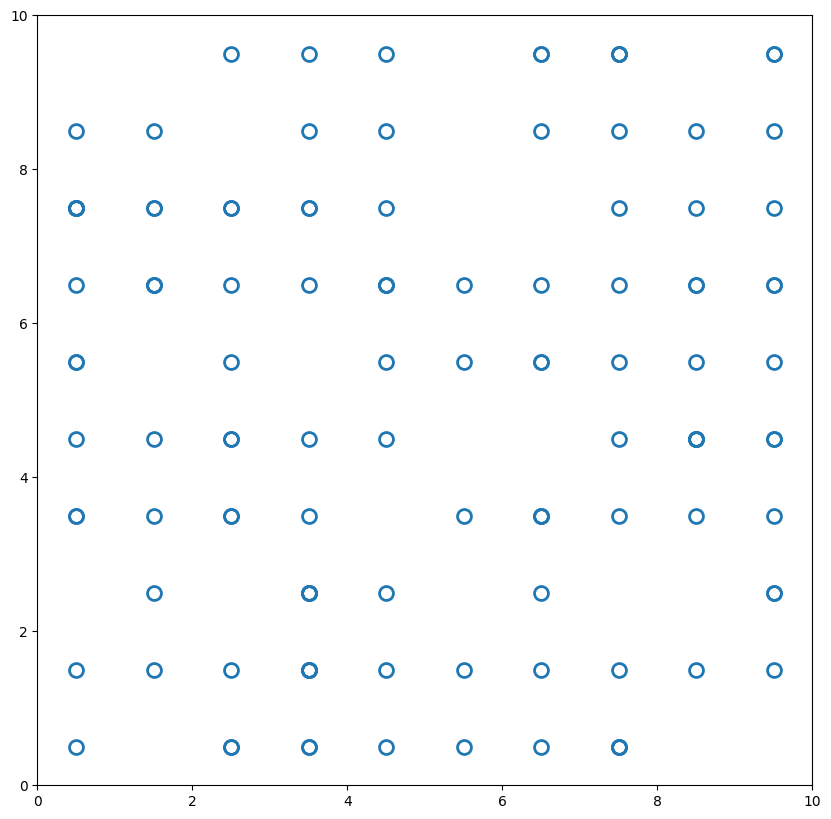

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from minisom import MiniSom
class SOM:
    def __init__(self, input_size, map_size):
        self.input_size = input_size
        self.map_size = map_size
        self.weights = np.random.random((map_size[0], map_size[1], input_size))
    def euclidean_distance(self, x, y):
        return np.sqrt(np.sum((x - y) ** 2))
    def find_best_matching_unit(self, x):
        min_dist = np.inf
        bmu = None
        for i in range(self.map_size[0]):
            for j in range(self.map_size[1]):
                dist = self.euclidean_distance(x, self.weights[i, j])
                if dist < min_dist:
                    min_dist = dist
                    bmu = np.array([i, j])
        return bmu
    def update_weights(self, x, bmu, learning_rate, sigma):
        for i in range(self.map_size[0]):
            for j in range(self.map_size[1]):
                weight = self.weights[i, j]
                dist_to_bmu = self.euclidean_distance(bmu, np.array([i, j]))
                influence = np.exp(- (dist_to_bmu ** 2) / (2 * sigma ** 2))
                self.weights[i, j] += learning_rate * influence * (x - weight)
    def train(self, data, epochs, learning_rate=0.1, initial_sigma=1.0):
        for epoch in range(1, epochs + 1):
            sigma = initial_sigma * np.exp(-epoch / epochs)
            for sample in data:
                bmu = self.find_best_matching_unit(sample)
                self.update_weights(sample, bmu, learning_rate, sigma)
            print(f"Epoch {epoch}/{epochs}")
    def predict(self, data):
        predicted = []
        for sample in data:
            bmu = self.find_best_matching_unit(sample)
            predicted.append(bmu)
        return np.array(predicted)
data = pd.read_csv('Modern_Periodic_Table.csv')
columns_for_som = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity', 'Thermal Expansion', 'Liquid Density', 'Molar Volume', 'Brinell Hardness', 'Mohs Hardness', 'Vickers Hardness', 'Bulk Modulus', 'Shear Modulus', "Young's Modulus", "Poisson's Ratio", 'Refractive Index', 'Speed of Sound', 'Valency', 'Electronegativity', 'Electron Affinity', 'Autoignition Point', 'Flash Point', 'Atomic Radius', 'Covalent Radius', 'van der Waals Radius']
imputer = SimpleImputer(strategy='mean')
data[columns_for_som] = imputer.fit_transform(data[columns_for_som])
try:
    input_size = len(columns_for_som)
    map_size = (10, 10)
    epochs = 100
    data_normalized = (data[columns_for_som] - data[columns_for_som].mean()) / data[columns_for_som].std()
    som = SOM(input_size, map_size)
    som.train(data_normalized.values, epochs)
    predicted = som.predict(data_normalized.values)
    plt.figure(figsize=(map_size[0], map_size[1]))
    plt.scatter(predicted[:, 0], predicted[:, 1])
    plt.title('Self-Organizing Map')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()
except Exception as e:
    print("Error:", e)
columns_for_som = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity', 'Thermal Expansion', 'Liquid Density', 'Molar Volume', 'Brinell Hardness', 'Mohs Hardness', 'Vickers Hardness', 'Bulk Modulus', 'Shear Modulus', "Young's Modulus", "Poisson's Ratio", 'Refractive Index', 'Speed of Sound', 'Valency', 'Electronegativity', 'Electron Affinity', 'Autoignition Point', 'Flash Point', 'Atomic Radius', 'Covalent Radius', 'van der Waals Radius']
data[columns_for_som] = data[columns_for_som].fillna(data[columns_for_som].mean())
data_normalized = (data[columns_for_som] - data[columns_for_som].mean()) / data[columns_for_som].std()
size_of_map = 10
epochs = 100
input_len = len(columns_for_som)
som = MiniSom(size_of_map, size_of_map, input_len, sigma=0.5, learning_rate=0.5)
som.random_weights_init(data_normalized.values)
som.train_batch(data_normalized.values, epochs, verbose=True)
plt.figure(figsize=(size_of_map, size_of_map))
for i, x in enumerate(data_normalized.values):
    w = som.winner(x)
    plt.plot(w[0]+.5, w[1]+.5, 'o', markerfacecolor='None', markeredgecolor='C0', markersize=10, markeredgewidth=2)
plt.axis([0, size_of_map, 0, size_of_map])
plt.show()

**`Agglomerative Clustering`**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
<ipython-input-5-98d0a1c8253d>:32: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cluster_details = data.groupby('Cluster').mean()


+-----------+---------------+-----------+-----------------+-----------------+------------------+------------------------+-----------------+------------------------+---------------------+----------------+-----------------+-------------------+
|   Cluster |   Atomic Mass |   Density |   Melting Point |   Boiling Point |   Heat of Fusion |   Heat of Vaporization |   Specific Heat |   Thermal Conductivity |   Thermal Expansion |   Molar Volume |   Atomic Radius |   Covalent Radius |
+===========+===============+===========+=================+=================+==================+========================+=================+========================+=====================+================+=================+===================+
|         0 |      113.777  |   6283.67 |         616.484 |         1906.23 |          6.98833 |                165.558 |          982.9  |                69.25   |         3.73333e-05 |    1.946e-05   |     1.65667e-10 |       1.49833e-10 |
+-----------+---------------+---

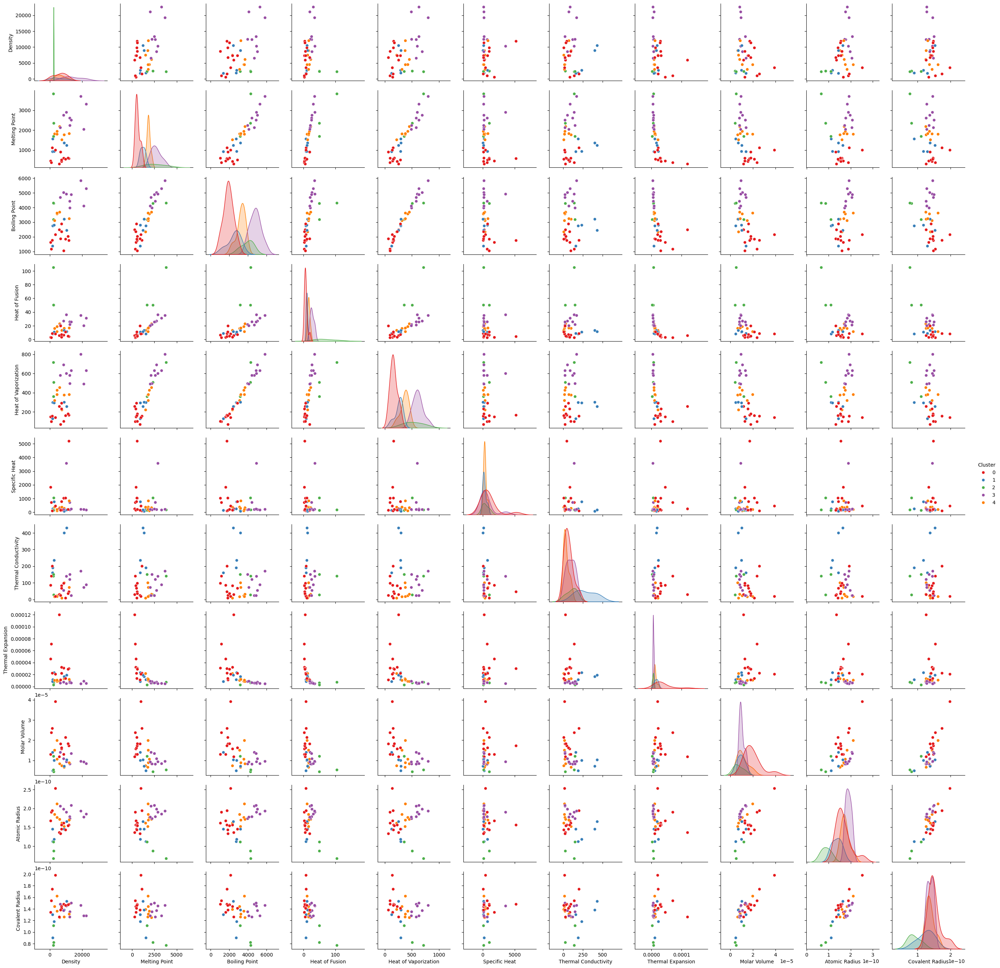

In [ ]:
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
selected_columns = [
    'Element Name',
    'Atomic Mass',
    'Density',
    'Melting Point',
    'Boiling Point',
    'Heat of Fusion',
    'Heat of Vaporization',
    'Specific Heat',
    'Thermal Conductivity',
    'Thermal Expansion',
    'Molar Volume',
    'Atomic Radius',
    'Covalent Radius',
]
data = data[selected_columns].dropna()
element_names = data['Element Name']
data = data.drop(columns=['Element Name'])
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)
cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
clusters = cluster.fit_predict(scaled_data)
data['Cluster'] = clusters
data['Element Name'] = element_names
cluster_details = data.groupby('Cluster').mean()
print(tabulate(cluster_details, headers='keys', tablefmt='grid'))
sns.pairplot(data=data, hue='Cluster', palette='Set1', vars=data.columns[1:-2])
plt.show()

**`Divisive Clustering`**

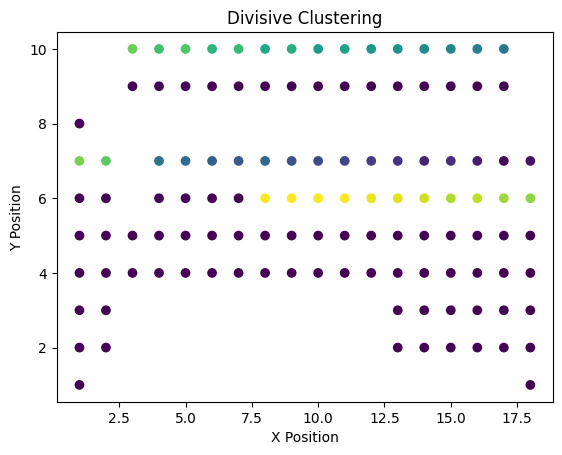

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
class DivisiveClustering:
    def __init__(self, min_cluster_size):
        self.min_cluster_size = min_cluster_size
    def fit(self, X):
        self.labels_ = np.zeros(X.shape[0])
        self._split_clusters(X, np.arange(X.shape[0]))
    def _split_clusters(self, X, cluster_indices):
        if len(cluster_indices) < self.min_cluster_size:
            return
        max_diameter = -1
        for cluster_index in cluster_indices:
            cluster_points = X[cluster_index]
            cluster_diameter = np.max(np.linalg.norm(cluster_points - np.mean(cluster_points, axis=0)))
            if cluster_diameter > max_diameter:
                max_diameter = cluster_diameter
                max_diameter_index = cluster_index
        new_clusters_indices = []
        for index in cluster_indices:
            if index != max_diameter_index:
                dist_to_split_point = np.linalg.norm(X[index] - X[max_diameter_index])
                if dist_to_split_point < max_diameter / 2:
                    new_clusters_indices.append(index)
        new_label = np.max(self.labels_) + 1
        for index in new_clusters_indices:
            self.labels_[index] = new_label
        self._split_clusters(X, new_clusters_indices)
data = pd.read_csv("/content/Dataset/Modern_Periodic_Table.csv")
X = data[['Atomic Mass', 'Atomic Number', 'Period', 'X Position', 'Y Position']]
min_cluster_size = 5
divisive_clustering = DivisiveClustering(min_cluster_size)
divisive_clustering.fit(X.values)
plt.scatter(X['X Position'], X['Y Position'], c=divisive_clustering.labels_)
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Divisive Clustering')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
data = pd.read_csv("/content/Dataset/Modern_Periodic_Table.csv")
X = data[['Atomic Mass', 'Atomic Number', 'Period', 'X Position', 'Y Position']]
class DivisiveClustering:
    def __init__(self):
        pass
    def fit(self, X):
        self.labels_ = np.zeros(len(X))
        self._divide(X, 0)
    def _divide(self, X, label):
        if len(X) == 1:
            self.labels_[X.index] = label
            return
        split_index = len(X) // 2
        left_data = X.iloc[:split_index]
        right_data = X.iloc[split_index:]
        self._divide(left_data, label)
        self._divide(right_data, label + 1)
divisive_cluster = DivisiveClustering()
divisive_cluster.fit(X)
print("Cluster assignments =", divisive_cluster.labels_)
num_clusters = len(set(divisive_cluster.labels_))
print("\nNumber of clusters =", num_clusters)
cluster_info = []
for i in range(num_clusters):
    cluster_indices = [index for index, label in enumerate(divisive_cluster.labels_) if label == i]
    cluster_size = len(cluster_indices)
    cluster_info.append([f"Cluster {i}", f"{cluster_size}", f"{cluster_indices}"])
print("\n📝 Cluster information:")
print(tabulate(cluster_info, headers=["Cluster", "Size", "Indices"], tablefmt="grid"))

Cluster assignments = [0. 1. 2. 1. 2. 2. 3. 1. 2. 3. 2. 3. 3. 4. 1. 2. 3. 2. 3. 3. 4. 2. 3. 3.
 4. 3. 4. 4. 5. 1. 2. 3. 2. 3. 3. 4. 2. 3. 3. 4. 3. 4. 4. 5. 2. 3. 4. 3.
 4. 4. 5. 3. 4. 4. 5. 4. 5. 5. 6. 1. 2. 3. 2. 3. 3. 4. 2. 3. 3. 4. 3. 4.
 4. 5. 2. 3. 4. 3. 4. 4. 5. 3. 4. 4. 5. 4. 5. 5. 6. 2. 3. 4. 3. 4. 4. 5.
 3. 4. 4. 5. 4. 5. 5. 6. 3. 4. 5. 4. 5. 5. 6. 4. 5. 5. 6. 5. 6. 6. 7.]

Number of clusters = 8

📝 Cluster information:
+-----------+--------+----------------------------------------------------------------------------------------------------------------------------------------------+
| Cluster   |   Size | Indices                                                                                                                                      |
+===========+========+==============================================================================================================================================+
| Cluster 0 |      1 | [0]                                           

**`Leader Clustering`**

+-----------+----------------------+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|  Cluster  |  Number of Elements  | Elements                                                                                                                                                                                                                                                                                                                                                                 |
+===========+======================+====================================================================================================================================================================

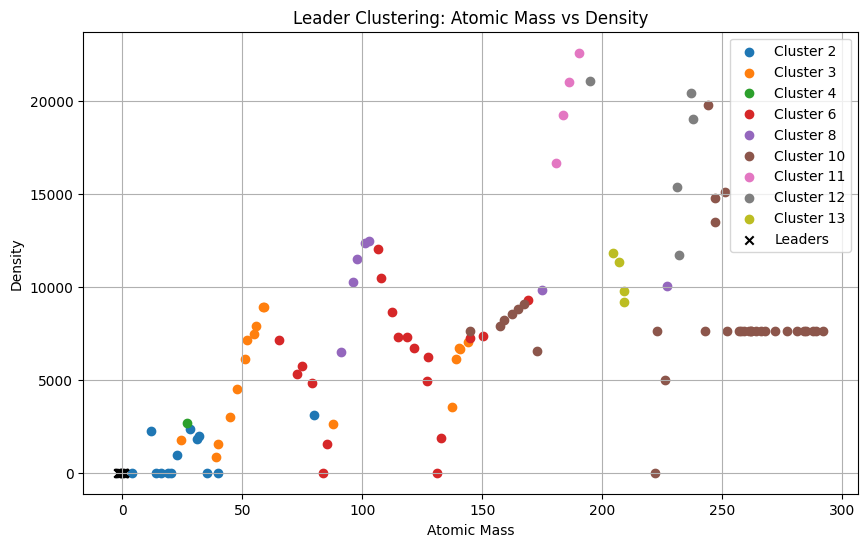

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances
from tabulate import tabulate
data = pd.read_csv('Modern_Periodic_Table.csv')
selected_features = ['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat']
data[selected_features] = data[selected_features].fillna(data[selected_features].mean())
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[selected_features])
def distance(point1, point2):
    return np.linalg.norm(point1 - point2)
leaders = [data_scaled[0]]
non_leaders = np.delete(data_scaled, 0, axis=0)
threshold_distance = 2.0
clusters = {}
for idx, point in enumerate(non_leaders):
    min_distance = float('inf')
    closest_leader = None
    for leader_idx, leader in enumerate(leaders):
        dist = distance(point, leader)
        if dist < min_distance:
            min_distance = dist
            closest_leader = leader
            closest_leader_idx = leader_idx
    if min_distance <= threshold_distance:
        if closest_leader_idx in clusters:
            clusters[closest_leader_idx].append(idx)
        else:
            clusters[closest_leader_idx] = [idx]
    else:
        leaders.append(point)
table_data = []
for cluster_idx, elements in clusters.items():
    elements_list = data.iloc[elements]['Element Name'].tolist()
    table_data.append([cluster_idx + 1, len(elements), ", ".join(elements_list)])
print(tabulate(table_data, headers=["Cluster", "Number of Elements", "Elements"], tablefmt="grid", numalign="center"))
def plot_clusters(feature1, feature2):
    plt.figure(figsize=(10, 6))
    plt.title(f"Leader Clustering: {feature1} vs {feature2}")
    plt.xlabel(feature1)
    plt.ylabel(feature2)
    for cluster_idx, elements in clusters.items():
        plt.scatter(data.iloc[elements][feature1], data.iloc[elements][feature2], label=f'Cluster {cluster_idx + 1}')
    leaders_x = [leader[0] for leader in leaders]
    leaders_y = [leader[1] for leader in leaders]
    plt.scatter(leaders_x, leaders_y, color='black', marker='x', label='Leaders')
    plt.legend()
    plt.grid(True)
    plt.show()
feature1 = 'Atomic Mass'
feature2 = 'Density'
plot_clusters(feature1, feature2)

**`Clustering In Quest (CLIQUE)`**

In [ ]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 7.6 MB/s eta 0:00:00


In [ ]:
!pip install pyclustering

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyclustering: filename=pyclustering-0.10.1.2-py3-none-any.whl size=2395100 sha256=a3c2d48a760eb963fd4d1162baddbf57a38878911558e905f060e395da0ddd26
  Stored in directory: /root/.cache/pip/wheels/b5/42/97/11eee99f5c1e4fdfc170f0a54f9c9eb195df66edb4cf69f449
Successfully built pyclustering


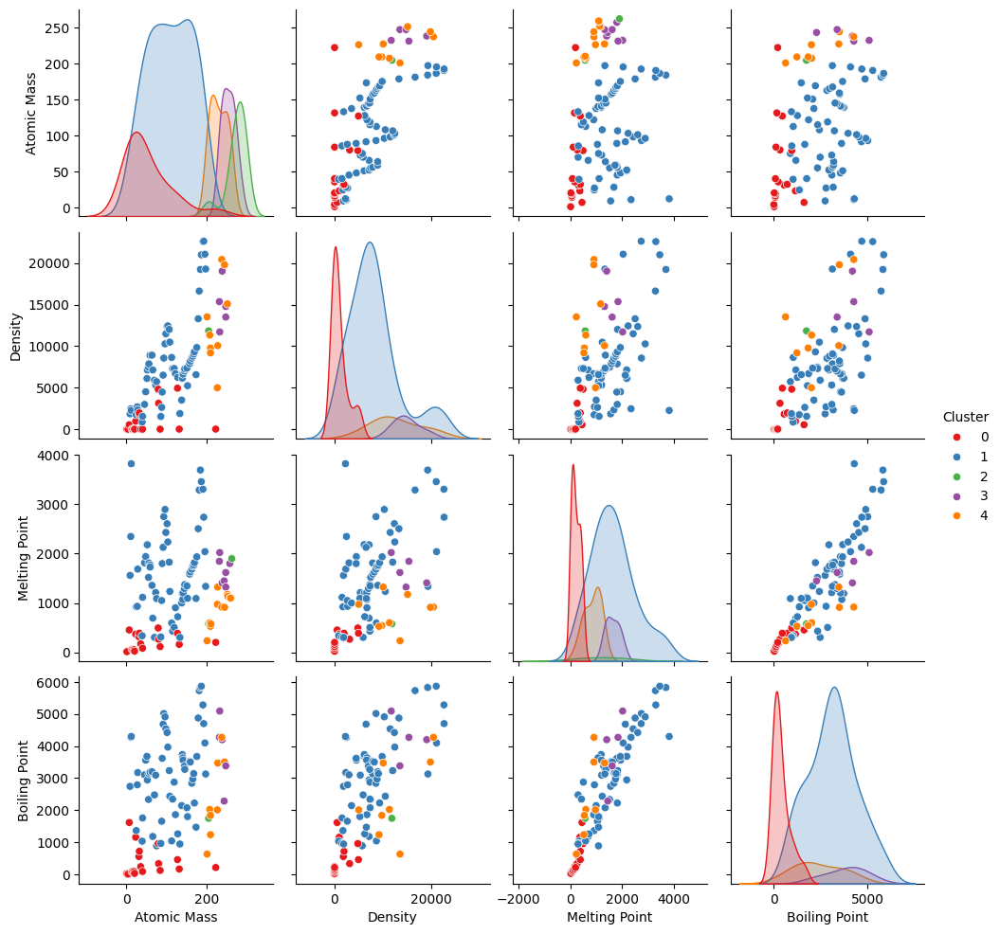

╒════════════════╤═══════════╕
│ Element Name   │  Cluster  │
╞════════════════╪═══════════╡
│ Hydrogen       │     0     │
├────────────────┼───────────┤
│ Helium         │     0     │
├────────────────┼───────────┤
│ Lithium        │     0     │
├────────────────┼───────────┤
│ Beryllium      │     1     │
├────────────────┼───────────┤
│ Boron          │     1     │
├────────────────┼───────────┤
│ Carbon         │     1     │
├────────────────┼───────────┤
│ Nitrogen       │     0     │
├────────────────┼───────────┤
│ Oxygen         │     0     │
├────────────────┼───────────┤
│ Fluorine       │     0     │
├────────────────┼───────────┤
│ Neon           │     0     │
├────────────────┼───────────┤
│ Sodium         │     0     │
├────────────────┼───────────┤
│ Magnesium      │     1     │
├────────────────┼───────────┤
│ Aluminum       │     1     │
├────────────────┼───────────┤
│ Silicon        │     1     │
├────────────────┼───────────┤
│ Phosphorus     │     0     │
├───────

<ipython-input-25-948b0a3631b6>:36: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=data, x='Atomic Mass', y='Melting Point', palette='Set1')


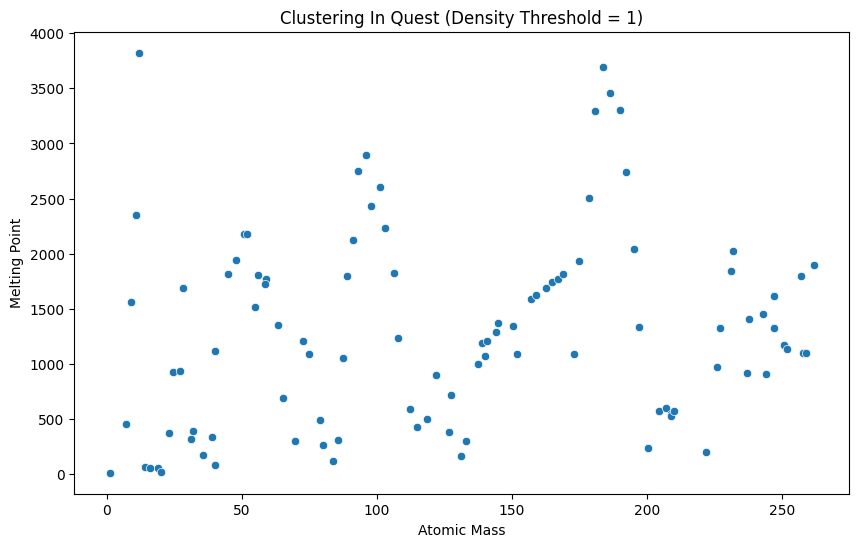

<ipython-input-25-948b0a3631b6>:36: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=data, x='Atomic Mass', y='Melting Point', palette='Set1')


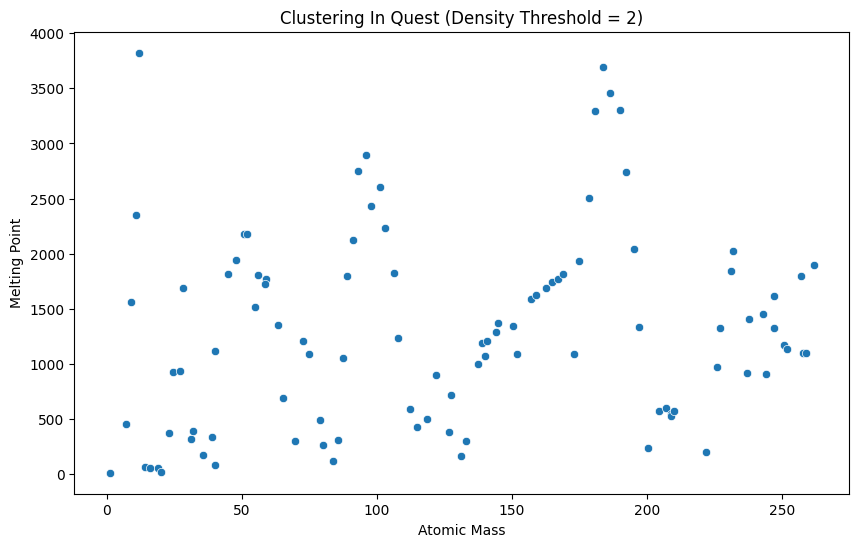

<ipython-input-25-948b0a3631b6>:36: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=data, x='Atomic Mass', y='Melting Point', palette='Set1')


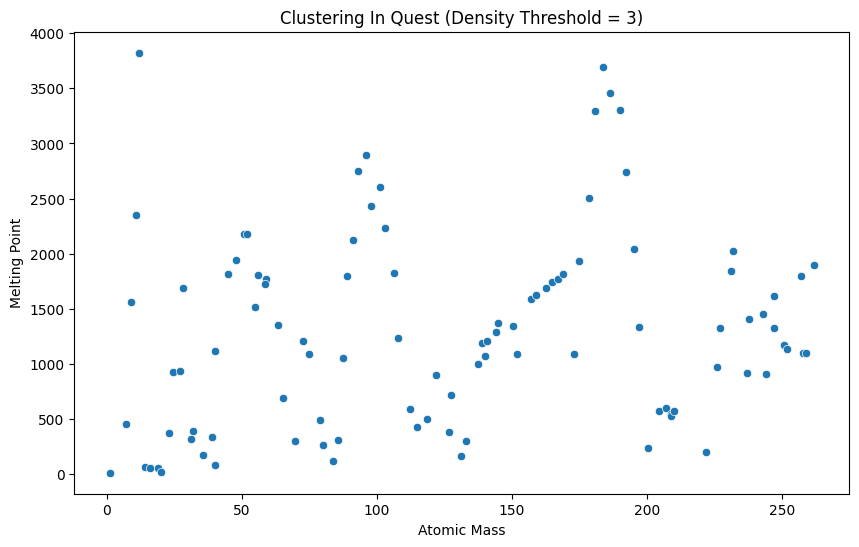

In [ ]:
import pandas as pd
from sklearn_extra.cluster import KMedoids
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from tabulate import tabulate
from pyclustering.cluster import clique
import seaborn as sns
data = pd.read_csv("Modern_Periodic_Table.csv")
features = data[['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity', 'Bulk Modulus', 'Young\'s Modulus', 'Atomic Radius', 'Covalent Radius']]
imputer = SimpleImputer(strategy='mean')
imputed_features = imputer.fit_transform(features)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(imputed_features)
kmedoids = KMedoids(n_clusters=5, random_state=42)
kmedoids.fit(scaled_features)
cluster_labels = kmedoids.labels_
data['Cluster'] = cluster_labels
sns.pairplot(data=data, vars=['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point'], hue='Cluster', palette='Set1')
plt.show()
selected_data = data[['Element Name', 'Cluster']]
data_list = selected_data.values.tolist()
print(tabulate(data_list, headers=['Element Name', 'Cluster'], tablefmt='fancy_grid', numalign='center'))
parameters = data[['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point']]
imputer = SimpleImputer(strategy='mean')
imputed_features = imputer.fit_transform(parameters)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(imputed_features)
num_intervals = 5
density_thresholds = [1, 2, 3]
for density_threshold in density_thresholds:
    try:
        clique_instance = clique.clique(scaled_features, num_intervals, density_threshold)
        clique_instance.process()
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=data, x='Atomic Mass', y='Melting Point', palette='Set1')
        plt.xlabel('Atomic Mass')
        plt.ylabel('Melting Point')
        plt.title(f'Clustering In Quest (Density Threshold = {density_threshold})')
        plt.show()
    except RuntimeError as e:
        print(f"Error occurred for density threshold {density_threshold}: {e}")

**`Principal Component Analysis (PCA)`**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
data = pd.read_csv('Modern_Periodic_Table.csv')
numeric_cols = ['Atomic Number', 'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Absolute Melting Point',
                'Absolute Boiling Point', 'Critical Pressure', 'Critical Temperature', 'Heat of Fusion',
                'Heat of Vaporization', 'Heat of Combustion', 'Specific Heat', 'Adiabatic Index', 'Neel Point',
                'Thermal Conductivity', 'Thermal Expansion', 'Liquid Density', 'Molar Volume', 'Brinell Hardness',
                'Mohs Hardness', 'Vickers Hardness', 'Bulk Modulus', 'Shear Modulus', "Young's Modulus",
                "Poisson's Ratio", 'Refractive Index', 'Speed of Sound', 'Valency', 'Electronegativity',
                'Electron Affinity', 'Autoignition Point', 'Flash Point', 'Atomic Radius', 'Covalent Radius',
                'van der Waals Radius', 'Half-Life', 'Lifetime', 'Neutron Cross Section', 'Neutron Mass Absorption',
                'Graph Period', 'Graph Group']
numeric_data = data[numeric_cols]
numeric_data = numeric_data.apply(pd.to_numeric, errors='coerce')
numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)
numeric_data = numeric_data.apply(lambda x: np.where(x > 1e10, np.nan, x))
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(numeric_data)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)
pca = PCA()
pca.fit(scaled_data)
principal_components = pca.components_
print("Explained Variance Ratio =", pca.explained_variance_ratio_)
print("\nPrincipal Components =", principal_components)

Explained Variance Ratio = [2.09800458e-01 1.17709768e-01 8.64718320e-02 5.63217610e-02
 5.10306733e-02 4.41195737e-02 4.25726782e-02 3.95723082e-02
 3.91086637e-02 3.25369925e-02 2.95347313e-02 2.92696267e-02
 2.59789043e-02 2.43390194e-02 2.10094884e-02 1.86351680e-02
 1.81244801e-02 1.54783222e-02 1.39725833e-02 1.12581172e-02
 9.99684009e-03 9.57631655e-03 8.09165734e-03 6.92679486e-03
 6.26806655e-03 6.18692770e-03 4.92916187e-03 4.06500416e-03
 3.71059484e-03 2.90427411e-03 2.50117737e-03 2.14783141e-03
 1.75257738e-03 1.48801906e-03 9.95416976e-04 7.81859928e-04
 5.40536468e-04 2.91792355e-04 8.26153597e-10 1.49863478e-11
 1.95185489e-12]

Principal Components = [[ 1.30522177e-01  1.29950482e-01  2.62514611e-01 ...  1.44117598e-02
   1.44292803e-01 -1.06409568e-01]
 [-2.67013278e-01 -2.65271020e-01 -7.19791254e-02 ... -4.09376282e-02
  -3.14810412e-01  1.42732962e-01]
 [-3.01293861e-01 -3.01561275e-01 -1.79966919e-01 ...  4.16914388e-02
  -2.10217464e-01 -3.04759052e-01]
 ...
 [

**`Linear Discriminant Analysis (LDA)`**

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

Accuracy = 0.8333333333333334

Confusion Matrix:
[[0 1 0 0 0 0 0]
 [0 1 0 0 0 0 0]
 [0 1 1 0 0 0 0]
 [0 0 0 3 0 0 0]
 [0 0 0 0 3 1 0]
 [0 0 0 0 1 3 0]
 [0 0 0 0 0 0 9]]

Classification Report:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.33      1.00      0.50         1
           3       1.00      0.50      0.67         2
           4       1.00      1.00      1.00         3
           5       0.75      0.75      0.75         4
           6       0.75      0.75      0.75         4
           7       1.00      1.00      1.00         9

    accuracy                           0.83        24
   macro avg       0.69      0.71      0.67        24
weighted avg       0.85      0.83      0.83        24

╒══════════╤═════════════╤══════════╤════════════╤═══════════╕
│   Period │   Precision │   Recall │   F1-score │   Support │
╞══════════╪═════════════╪══════════╪════════════╪═══════════╡
│        1 │    0    

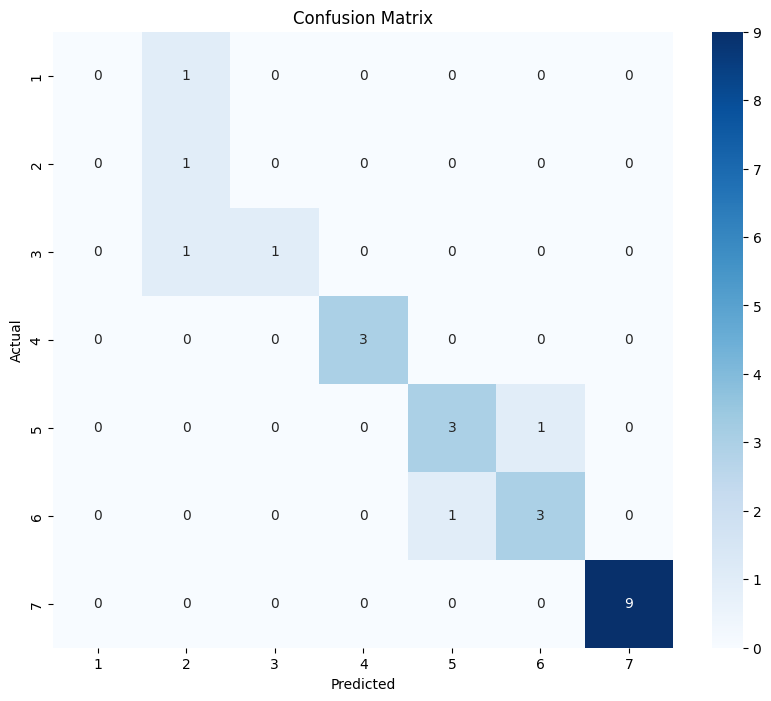

In [ ]:
import pandas as pd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
data = pd.read_csv('Modern_Periodic_Table.csv')
data = data.dropna(axis=1)
columns_to_keep = ['Atomic Number', 'Period', 'Electron Configuration']
data = data[columns_to_keep]
label_encoder = LabelEncoder()
data['Electron Configuration'] = label_encoder.fit_transform(data['Electron Configuration'])
X = data.drop(columns=['Period'])
y = data['Period']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
y_pred = lda.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)
print("Accuracy =", accuracy)
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)
class_report_dict = classification_report(y_test, y_pred, output_dict=True)
report_tuples = [(key, value['precision'], value['recall'], value['f1-score'], value['support']) for key, value in class_report_dict.items() if key.isdigit()]
report_tuples.insert(0, ('Period', 'Precision', 'Recall', 'F1-score', 'Support'))
print(tabulate(report_tuples, headers='firstrow', tablefmt='fancy_grid'))
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=lda.classes_, yticklabels=lda.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

**`Independent Component Analysis (ICA)`**

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


+-----+----------------+------------------+-----------------+---------+----------+--------------------------+---------------+-------------------+----------------+---------------+------------+--------------+--------------+--------------+
|     | Element Name   | Element Symbol   |   Atomic Number | Block   |   Period | Electron Configuration   | CAS Number    | Quantum Numbers   |   Graph Period |   Graph Group |      ICA-1 |        ICA-2 |        ICA-3 |        ICA-4 |
|-----+----------------+------------------+-----------------+---------+----------+--------------------------+---------------+-------------------+----------------+---------------+------------+--------------+--------------+--------------|
|   0 | Hydrogen       | H                |               1 | s       |        1 | 1s1                      | CAS1333-74-0  | 2S1/2             |            1   |             1 |  0.0727962 | -0.0344879   |  0.496708    |  0.0924993   |
|   1 | Helium         | He               |         

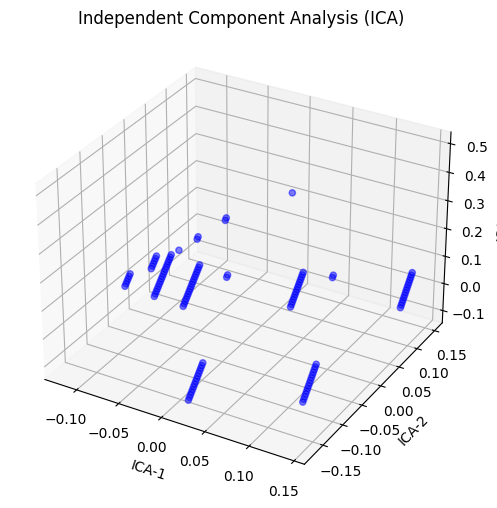




📋 Independent Component Analysis (ICA) Report:
------------------------------------------------
Number of components = 4

Mixing Matrix:
[[ 9.61024644e+00  2.01033193e+00 -4.58701882e+00 -7.48990751e-01]
 [ 8.25594634e+00  1.39017587e+00 -6.72995774e+00  1.61691985e+00]
 [ 8.05717513e+00 -3.15581559e+00 -6.10202415e+00  2.42653211e+00]
 [-7.74818602e-03 -2.58381152e+00 -1.72137830e+00 -1.04096453e+01]]

Independent Components:
[[ 0.22351501 -0.21209862  0.07481477 -0.03158769]
 [ 0.01832511  0.18132121 -0.20767255 -0.02156342]
 [ 0.26626976 -0.36750017  0.05891138 -0.06250948]
 [-0.04874628  0.01592277  0.04174957 -0.08035211]]

Kurtosis of Independent Components = [-1.20646615 -1.03756737 -1.11128482 -1.68135349]

Negentropy of Independent Components = [2.54626997695751, 2.6822539972489245, 2.1939659374660314, 3.6507883998602333]



In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import FastICA
from sklearn.preprocessing import StandardScaler
from tabulate import tabulate
from scipy.stats import kurtosis
data = pd.read_csv("Modern_Periodic_Table.csv")
data.replace([np.inf, -np.inf], np.nan, inplace=True)
columns_without_nans = data.columns[data.notna().all()].tolist()
data_cleaned = data[columns_without_nans].dropna()
numeric_columns = data_cleaned.select_dtypes(include=['float64', 'int64']).columns
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_cleaned[numeric_columns])
ica = FastICA(n_components=len(numeric_columns), random_state=42)
ica_result = ica.fit_transform(data_scaled)
ica_df = pd.DataFrame(ica_result, columns=[f'ICA-{i}' for i in range(1, len(numeric_columns)+1)])
result_df = pd.concat([data_cleaned.reset_index(drop=True), ica_df], axis=1)
print(tabulate(result_df, headers='keys', tablefmt='psql'))
fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(result_df['ICA-1'], result_df['ICA-2'], result_df['ICA-3'], c='b', marker='o', alpha=0.5)
ax.set_title('Independent Component Analysis (ICA)')
ax.set_xlabel('ICA-1')
ax.set_ylabel('ICA-2')
ax.set_zlabel('ICA-3')
plt.show()
mixing_matrix = ica.mixing_
independent_components = ica.components_
component_kurtosis = kurtosis(independent_components, axis=1)
def negentropy(X):
    def g(x):
        return np.tanh(x / 2)
    return np.mean(np.log(np.cosh(X)) - np.log(np.sqrt(np.mean(g(X)**2)) + 1e-10))
component_negentropy = [negentropy(ic) for ic in independent_components]
ica_report = f"""
\n\n📋 Independent Component Analysis (ICA) Report:
------------------------------------------------
Number of components = {len(independent_components)}
\nMixing Matrix:
{mixing_matrix}
\nIndependent Components:
{independent_components}
\nKurtosis of Independent Components = {component_kurtosis}
\nNegentropy of Independent Components = {component_negentropy}
"""
print(ica_report)

**`Factor Analysis (FA)`**

In [ ]:
pip install factor-analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 425.2 kB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor-analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42564 sha256=131190a735e4faf53f2d22d56e1dac8c690e95f9f92e72f2bbbbb7a832689a34
  Stored in directory: /root/.cache/pip/wheels/24/59/82/6493618e30ed1cb7a013b9e1b0c9e17de80b04dfcef4ba8a4d
Successfully built factor-analyzer


Factor Loadings:
+--------------------------------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+--------------+-------------+-------------+
|                                |    Factor 1 |    Factor 2 |    Factor 3 |    Factor 4 |    Factor 5 |    Factor 6 |    Factor 7 |     Factor 8 |    Factor 9 |   Factor 10 |
|--------------------------------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+--------------+-------------+-------------|
| Atomic Number                  |  0.433126   | -0.432962   |  0.553482   |  0.0187037  | -0.151856   |  0.241246   |  0.00736297 |  0.186199    | -0.163289   |  0.0715845  |
| Atomic Mass                    |  0.429472   | -0.428209   |  0.549997   |  0.0271674  | -0.155021   |  0.246629   |  0.0179111  |  0.180745    | -0.162742   |  0.0710445  |
| Density                        |  0.760301   | -0.00330678 |  0.341494   | -0.0432573  | -0.146663   

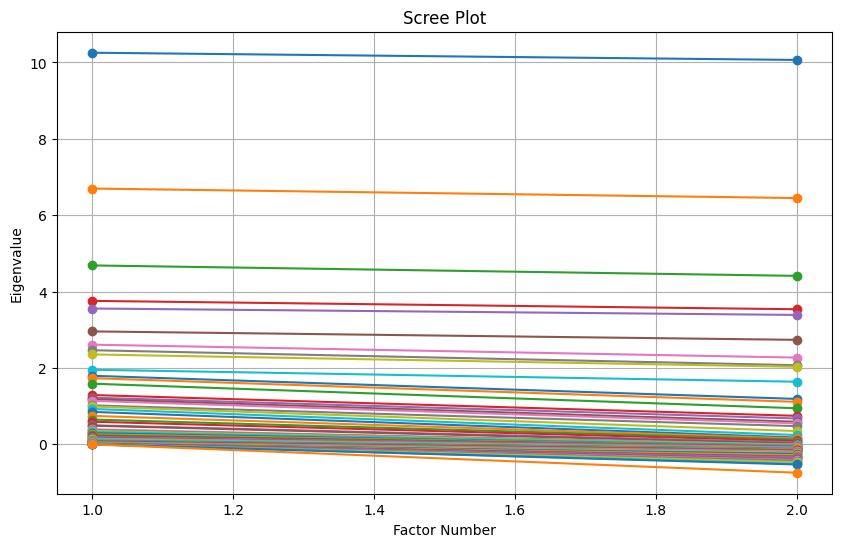

In [ ]:
import pandas as pd
from factor_analyzer import FactorAnalyzer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import numpy as np
from tabulate import tabulate
df = pd.read_csv("Modern_Periodic_Table.csv")
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df_numeric = df.select_dtypes(include=['number'])
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df_numeric), columns=df_numeric.columns)
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_imputed), columns=df_imputed.columns)
n_factors = 10
fa = FactorAnalyzer(n_factors, rotation=None)
fa.fit(df_scaled)
factor_loadings = pd.DataFrame(fa.loadings_, index=df_numeric.columns, columns=[f'Factor {i+1}' for i in range(n_factors)])
print("Factor Loadings:")
print(tabulate(factor_loadings, headers='keys', tablefmt='psql'))
explained_variance = fa.get_factor_variance()
explained_variance_df = pd.DataFrame(explained_variance, index=['Sum of Squared Loadings', 'Proportion Var', 'Cumulative Var'], columns=[f'Factor {i+1}' for i in range(n_factors)])
print("\nExplained Variance:")
print(tabulate(explained_variance_df, headers='keys', tablefmt='psql'))
eigenvalues = fa.get_eigenvalues()
print("\nEigenvalues:")
print(eigenvalues)
for i, eigenvalue in enumerate(eigenvalues, start=1):
    print(f"\nFactor {i} = {eigenvalue}")
communalities = fa.get_communalities()
print("\nCommunalities:")
print(tabulate(pd.DataFrame(communalities, index=df_numeric.columns, columns=["Communalities"]), headers='keys', tablefmt='psql'))
total_variance = np.sum(fa.get_factor_variance()[0])
print("\nTotal Variance Explained by Factors =", total_variance)
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o')
plt.title('Scree Plot')
plt.xlabel('Factor Number')
plt.ylabel('Eigenvalue')
plt.grid(True)
plt.show()

**`t-Distributed Stochastic Neighbor Embedding (t-SNE)`**

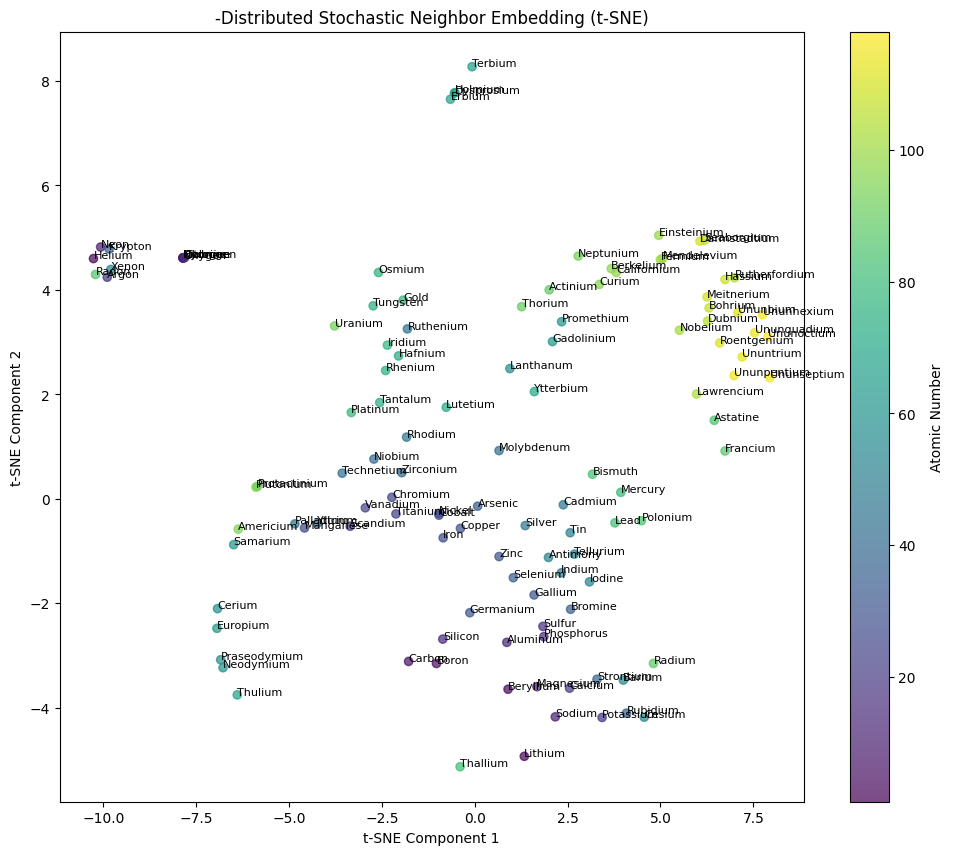

Summary of Statistics:
+-------+---------------------+---------------------+
|       |   t-SNE Component 1 |   t-SNE Component 2 |
|-------+---------------------+---------------------|
| count |          118        |          118        |
| mean  |            0.131696 |            1.08763  |
| std   |            4.83753  |            3.16533  |
| min   |          -10.2628   |           -5.12712  |
| 25%   |           -2.68271  |           -1.11648  |
| 50%   |            0.880842 |            0.920658 |
| 75%   |            3.75017  |            3.77748  |
| max   |            7.94419  |            8.27248  |
+-------+---------------------+---------------------+


In [ ]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.preprocessing import RobustScaler
import matplotlib.pyplot as plt
from tabulate import tabulate
data = pd.read_csv("Modern_Periodic_Table.csv")
selected_columns = ['Element Name', 'Atomic Number', 'Block', 'Period', 'Electron Configuration',
                    'CAS Number', 'Half-Life', 'Lifetime', 'Quantum Numbers',
                    'Graph Period', 'Graph Group',
                    'Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
                    'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat',
                    'Molar Volume', 'Brinell Hardness', 'Molar Magnetic Susceptibility']
data_selected = data[selected_columns].copy()
data_selected.fillna(0, inplace=True)
for col in data_selected.select_dtypes(include=['object']):
    data_selected[col] = pd.factorize(data_selected[col])[0]
max_finite_half_life = np.nanmax(data_selected['Half-Life'][np.isfinite(data_selected['Half-Life'])])
max_finite_lifetime = np.nanmax(data_selected['Lifetime'][np.isfinite(data_selected['Lifetime'])])
data_selected['Half-Life'].replace(np.inf, max_finite_half_life, inplace=True)
data_selected['Lifetime'].replace(np.inf, max_finite_lifetime, inplace=True)
scaler = RobustScaler()
data_scaled = scaler.fit_transform(data_selected)
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(data_scaled)
plt.figure(figsize=(12, 10))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=data['Atomic Number'], cmap='viridis', alpha=0.7)
for i, txt in enumerate(data['Element Name']):
    plt.annotate(txt, (tsne_result[i, 0], tsne_result[i, 1]), fontsize=8)
plt.colorbar(label='Atomic Number')
plt.title('-Distributed Stochastic Neighbor Embedding (t-SNE)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()
tsne_data = pd.concat([data, pd.DataFrame(tsne_result, columns=['t-SNE Component 1', 't-SNE Component 2'])], axis=1)
summary_stats = tsne_data[['t-SNE Component 1', 't-SNE Component 2']].describe()
print("Summary of Statistics:")
print(tabulate(summary_stats, headers='keys', tablefmt='psql'))

**`Isomap`**

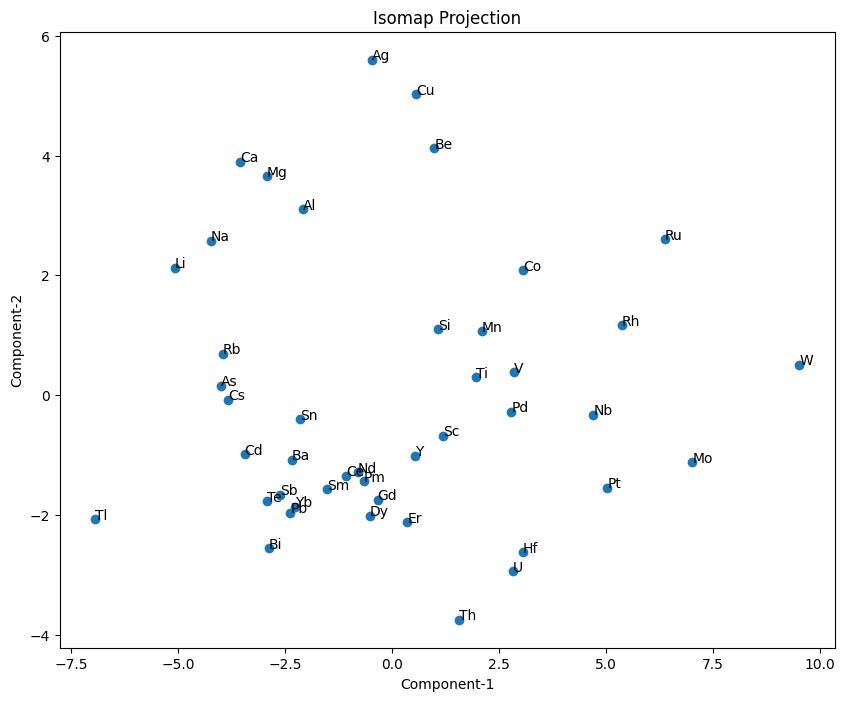

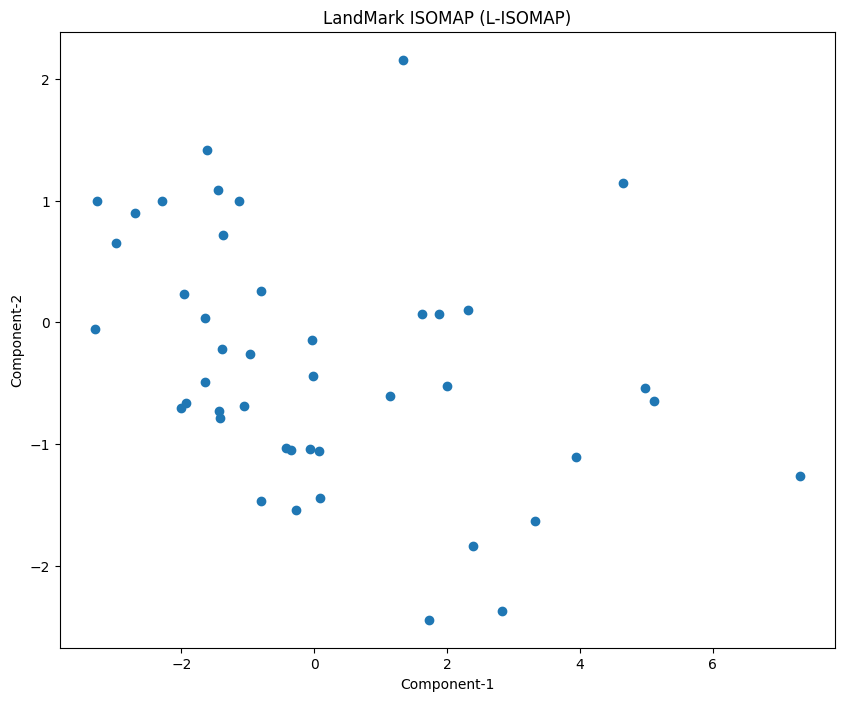

In [ ]:
import pandas as pd
from sklearn.manifold import Isomap
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
data = pd.read_csv("Modern_Periodic_Table.csv")
features = ['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization',
            'Specific Heat', 'Thermal Conductivity', 'Bulk Modulus', 'Young\'s Modulus']
data = data.dropna(subset=features)
component_data = data[features]
scaler = StandardScaler()
component_data_scaled = scaler.fit_transform(component_data)
iso = Isomap(n_components=2)
iso_data = iso.fit_transform(component_data_scaled)
plt.figure(figsize=(10, 8))
plt.scatter(iso_data[:, 0], iso_data[:, 1])
plt.title('Isomap Projection')
plt.xlabel('Component-1')
plt.ylabel('Component-2')
for i, txt in enumerate(data['Element Symbol']):
    plt.annotate(txt, (iso_data[i, 0], iso_data[i, 1]))
plt.show()
## ------------- LandMark ISOMAP (L-ISOMAP) ------------- ##
data2 = data.dropna(subset=features)
component_data2 = data[features]
scaler2 = StandardScaler()
component_data_scaled2 = scaler.fit_transform(component_data2)
num_landmarks = 10
landmark_indices = np.random.choice(len(component_data_scaled), num_landmarks, replace=False)
landmark_distances = np.zeros((num_landmarks, num_landmarks))
for i in range(num_landmarks):
    for j in range(i+1, num_landmarks):
        diff = component_data_scaled[landmark_indices[i]] - component_data_scaled[landmark_indices[j]]
        distance = np.sqrt(np.sum(diff ** 2))
        landmark_distances[i, j] = distance
        landmark_distances[j, i] = distance
iso_landmark2 = Isomap(n_neighbors=num_landmarks - 1, n_components=2, metric='precomputed')
iso_landmark.fit(landmark_distances)
data_landmark_distances = np.zeros((len(component_data_scaled), num_landmarks))
for i in range(len(component_data_scaled)):
    for j in range(num_landmarks):
        diff = component_data_scaled[i] - component_data_scaled[landmark_indices[j]]
        data_landmark_distances[i, j] = np.sqrt(np.sum(diff ** 2))
embedding_landmark = iso_landmark.transform(data_landmark_distances)
plt.figure(figsize=(10, 8))
plt.scatter(embedding_landmark[:, 0], embedding_landmark[:, 1])
plt.title('LandMark ISOMAP (L-ISOMAP)')
plt.xlabel('Component-1')
plt.ylabel('Component-2')
plt.show()

**`Local Linear Embedding`**

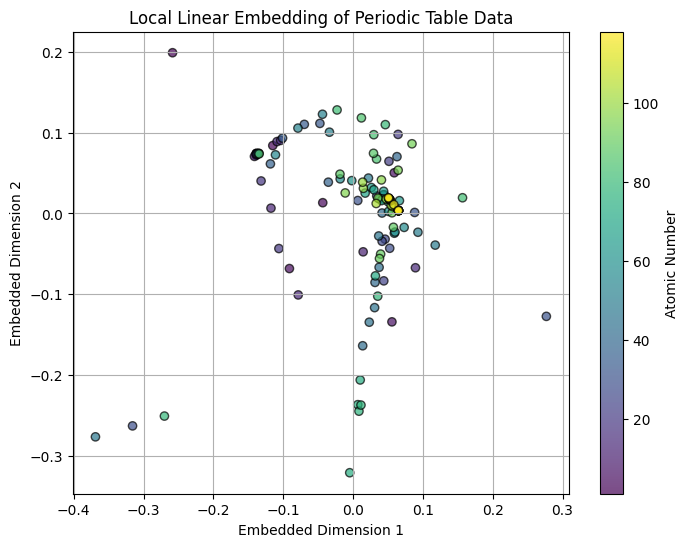

In [ ]:
import pandas as pd
import numpy as np
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
data = pd.read_csv("Modern_Periodic_Table.csv")
features = data[['Density', 'Melting Point', 'Boiling Point', 'Heat of Fusion', 'Heat of Vaporization', 'Specific Heat', 'Thermal Conductivity', 'Thermal Expansion']]
imputer = SimpleImputer(strategy='mean')
imputed_features = imputer.fit_transform(features)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(imputed_features)
lle = LocallyLinearEmbedding(n_neighbors=10, n_components=2, random_state=42)
embedded_data = lle.fit_transform(scaled_features)
plt.figure(figsize=(8, 6))
plt.scatter(embedded_data[:, 0], embedded_data[:, 1], c=data['Atomic Number'], cmap='viridis', edgecolor='k', alpha=0.7)
plt.title('Local Linear Embedding of Periodic Table Data')
plt.xlabel('Embedded Dimension 1')
plt.ylabel('Embedded Dimension 2')
plt.colorbar(label='Atomic Number')
plt.grid(True)
plt.show()

**`Hessian Eigenmaps`**

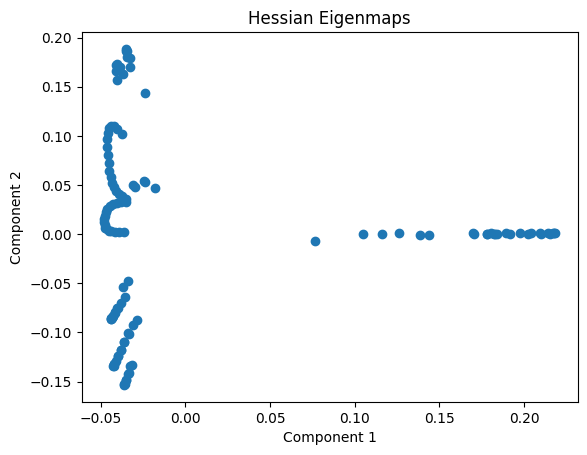

In [ ]:
import numpy as np
import pandas as pd
from sklearn.manifold import SpectralEmbedding
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler
data = pd.read_csv("Modern_Periodic_Table.csv")
data.dropna(axis=1, inplace=True)
numeric_columns = data.select_dtypes(include=np.number).columns
data[numeric_columns] = data[numeric_columns].clip(lower=-1e10, upper=1e10)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data[numeric_columns])
distances = pairwise_distances(scaled_data, metric="euclidean")
k = 10
squared_distances = distances ** 2
neighbors_indices = np.argpartition(squared_distances, k + 1, axis=1)[:, :k + 1]
neighbor_distances = squared_distances[np.arange(squared_distances.shape[0])[:, None], neighbors_indices]
sigma2 = np.mean(neighbor_distances[:, -1])
affinity_matrix = np.exp(-squared_distances / sigma2)
degrees = np.sum(affinity_matrix, axis=1)
D = np.diag(degrees)
L = D - affinity_matrix
H = np.dot(np.dot(np.sqrt(np.diag(degrees ** -1)), L), np.sqrt(np.diag(degrees ** -1)))
n_components = 2
_, eigenvectors = np.linalg.eigh(H)
embedding = eigenvectors[:, 1:n_components + 1]
import matplotlib.pyplot as plt
plt.scatter(embedding[:, 0], embedding[:, 1])
plt.title("Hessian Eigenmaps")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.show()

**`Spectral Embedding`**

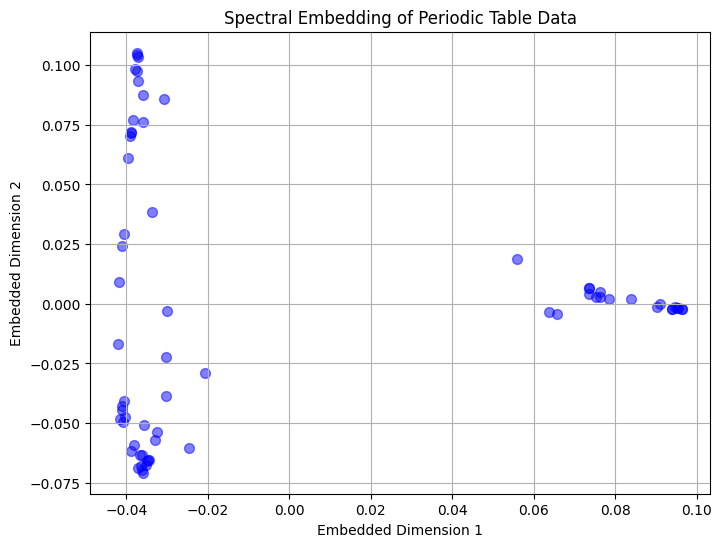

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import SpectralEmbedding
import matplotlib.pyplot as plt
data = pd.read_csv('Modern_Periodic_Table.csv')
embedding_features = ['Atomic Mass', 'Density', 'Melting Point', 'Boiling Point',
                      'Specific Heat', 'Thermal Conductivity', 'Electronegativity']
data_subset = data.dropna(subset=embedding_features)
X = data_subset[embedding_features].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
spectral_embedding = SpectralEmbedding(n_components=2, affinity='nearest_neighbors')
X_embedding = spectral_embedding.fit_transform(X_scaled)
plt.figure(figsize=(8, 6))
plt.scatter(X_embedding[:, 0], X_embedding[:, 1], s=50, c='blue', alpha=0.5)
plt.title('Spectral Embedding of Periodic Table Data')
plt.xlabel('Embedded Dimension 1')
plt.ylabel('Embedded Dimension 2')
plt.grid(True)
plt.show()

**`Uniform Manifold Approximation and Projection (UMAP)`**

In [ ]:
!pip install umap-learn pandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 4.7 MB/s eta 0:00:00


UMAP parameters:
Number of components: 2
Number of neighbors: 15
Minimum distance: 0.1


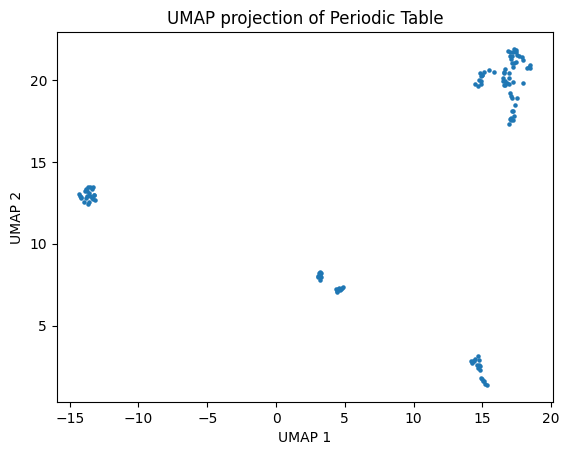

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import umap
data = pd.read_csv("Modern_Periodic_Table.csv")
data_numeric = data.select_dtypes(include=['float64', 'int64'])
data_numeric.fillna(data_numeric.median(), inplace=True)
data_numeric = data_numeric.clip(lower=-1e9, upper=1e9)
if data_numeric.shape[0] > 0:
    reducer = umap.UMAP()
    embedding = reducer.fit_transform(data_numeric)
    print("UMAP parameters:")
    print("Number of components:", reducer.n_components)
    print("Number of neighbors:", reducer.n_neighbors)
    print("Minimum distance:", reducer.min_dist)
    plt.scatter(embedding[:, 0], embedding[:, 1], s=5)
    plt.title('UMAP projection of Periodic Table')
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.show()
else:
    print("The dataset is empty after preprocessing!")

**`Multidimensional Scaling (MDS)`**

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


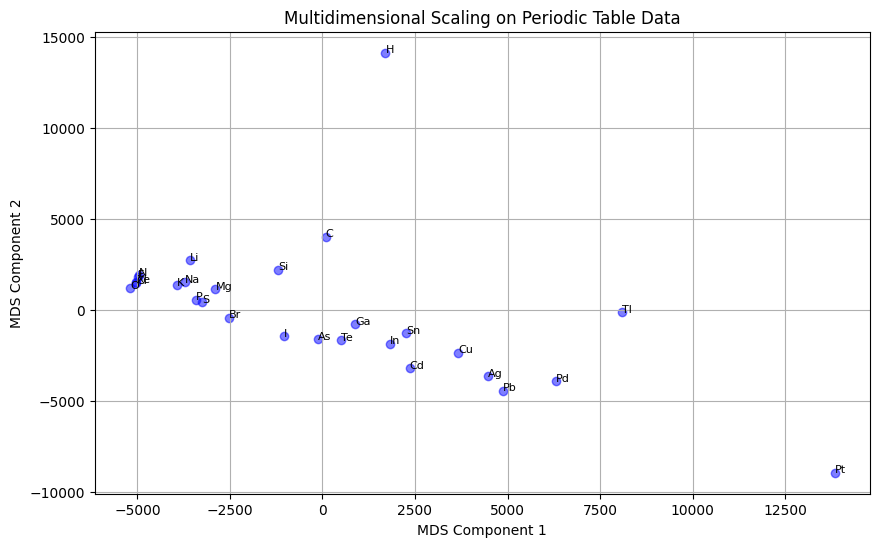

In [ ]:
import pandas as pd
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
data = pd.read_csv("Modern_Periodic_Table.csv")
selected_columns = [
    'Atomic Mass',
    'Density',
    'Melting Point',
    'Boiling Point',
    'Specific Heat',
    'Thermal Conductivity',
    'Electronegativity',
    'Atomic Radius',
    'Covalent Radius',
    'van der Waals Radius'
]
data = data.dropna(subset=selected_columns)
X = data[selected_columns].values
mds = MDS(n_components=2, dissimilarity='euclidean')
X_transformed = mds.fit_transform(X)
plt.figure(figsize=(10, 6))
plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c='blue', alpha=0.5)
for i, symbol in enumerate(data['Element Symbol']):
    plt.annotate(symbol, (X_transformed[i, 0], X_transformed[i, 1]), fontsize=8)
plt.xlabel('MDS Component 1')
plt.ylabel('MDS Component 2')
plt.title('Multidimensional Scaling on Periodic Table Data')
plt.grid(True)
plt.show()

**`Sammon Mapping`**

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


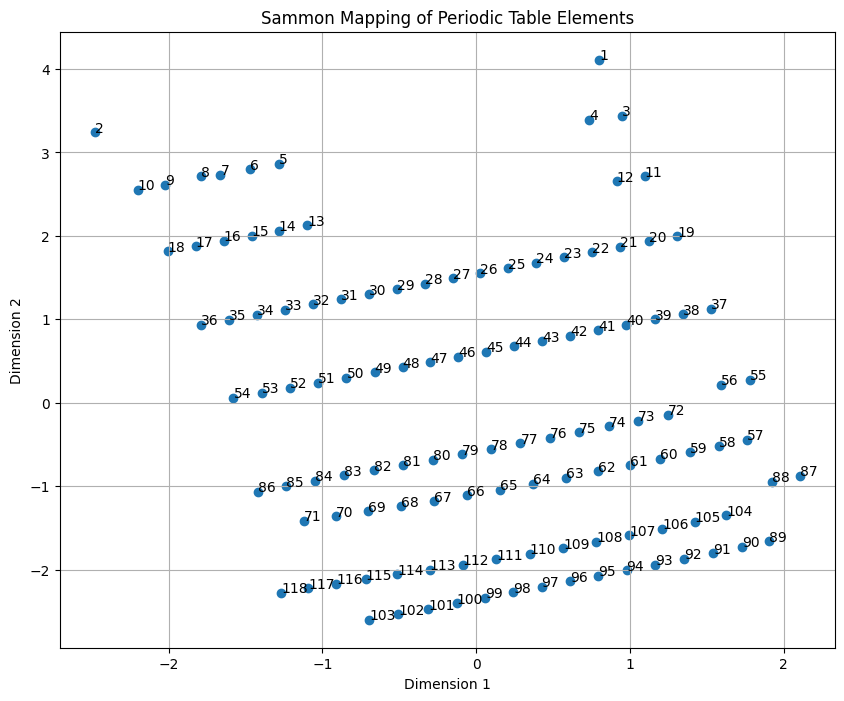

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
data = pd.read_csv('Modern_Periodic_Table.csv')
selected_columns = ['Atomic Number', 'Period', 'Graph Period', 'Graph Group']
data_numeric = data[selected_columns].select_dtypes(include=np.number)
imputer = SimpleImputer(strategy='mean')
data_numeric_imputed = pd.DataFrame(imputer.fit_transform(data_numeric), columns=data_numeric.columns)
scaler = StandardScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(data_numeric_imputed), columns=data_numeric.columns)
X = data_scaled.values
if X.size == 0:
    print("No data points available for calculation!")
else:
    mds = MDS(n_components=2, dissimilarity='euclidean')
    X_transformed = mds.fit_transform(X)
    plt.figure(figsize=(10, 8))
    plt.scatter(X_transformed[:, 0], X_transformed[:, 1])
    for i, txt in enumerate(data['Atomic Number']):
        plt.annotate(txt, (X_transformed[i, 0], X_transformed[i, 1]))
    plt.title('Sammon Mapping of Periodic Table Elements')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.grid(True)
    plt.show()

**`Deep Belief Network`**

Mean values:
[ 2.55874096e+03  1.29647149e+03  1.44876991e+02  5.95000000e+01
  1.59369048e-10  5.94622222e+02  2.55887128e+03  7.08744729e+08
  1.31380282e-10  2.06540476e+07  9.63735238e+02  4.16222222e+02
  4.43750000e+00  2.51551515e+03  7.64556760e+03  8.77503750e+06
  7.61622093e+01  1.73691489e+00  4.63650000e+02  1.00762712e+01
  5.88983051e+00  9.94444444e+00 -1.73171429e+03  1.37706452e+01
  2.65906543e+02  7.70563768e+03  4.12336707e-07  1.29657446e+03
  3.74000000e+06  6.38320902e-08  2.02086164e-03  1.31914894e+00
  1.88888889e+00  7.27272727e-01  1.27200000e+02  8.71630016e+02
  2.09288217e-01  8.82408819e-01  1.33103811e+00  9.42551711e-01
  9.12514046e-01  9.59020341e-01  1.20559315e+00  5.25423729e+00
  2.92444444e-01  1.07526616e+00  1.82393617e+02  6.24469886e+02
  3.50573750e+03  2.05933333e+00  5.80440034e+01  1.62761905e-05
  3.77570093e+00  3.40006978e-03  1.79526316e-10]
Standard deviation:
[1.40701029e+03 8.13038442e+02 8.77428009e+01 3.40624427e+01
 4.84620732

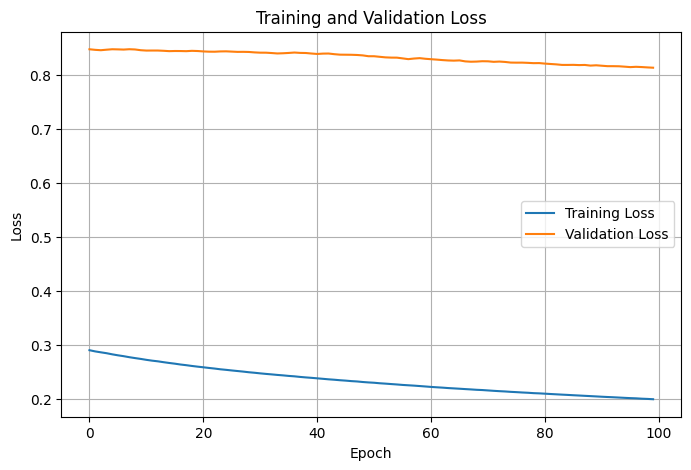

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
data = pd.read_csv('Modern_Periodic_Table.csv')
numeric_cols = data.select_dtypes(include=[np.number]).columns
data[numeric_cols] = data[numeric_cols].fillna(data[numeric_cols].mean())
columns_to_exclude = []
for col in numeric_cols:
    if np.any(np.isinf(data[col])) or np.any(np.abs(data[col]) > 1e10):
        columns_to_exclude.append(col)
numeric_cols = numeric_cols.difference(columns_to_exclude)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data[numeric_cols])
print("Mean values:")
print(scaler.mean_)
print("Standard deviation:")
print(np.sqrt(scaler.var_))
X_train, X_test = train_test_split(scaled_data, test_size=0.2, random_state=42)
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(X_train.shape[1], activation='linear')
])
model.compile(optimizer='adam', loss='mse')
model.fit(X_train, X_train, epochs=100, batch_size=32, validation_data=(X_test, X_test))
loss = model.evaluate(X_test, X_test)
print('Test Loss = ', loss)
history = model.fit(X_train, X_train, epochs=100, batch_size=32, validation_data=(X_test, X_test), verbose=0)
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

**`Restricted Boltzmann Machine`**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.neural_network import BernoulliRBM
from sklearn.model_selection import train_test_split
data = pd.read_csv('/content/Dataset/Modern_Periodic_Table.csv')
X = data[['Atomic Mass', 'Atomic Number', 'Period', 'X Position', 'Y Position']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
rbm = BernoulliRBM(n_components=64,
                   n_iter=200,
                   learning_rate=0.01,
                   batch_size=10,
                   random_state=42,
                   verbose=True)
rbm_pipeline = Pipeline([('scaler', scaler), ('rbm', rbm)])
rbm_pipeline.fit(X_scaled)
X_transformed = rbm_pipeline.transform(X_scaled)
print("\nTransformed Data:")
print(X_transformed)
print("\n")
X_train, X_test = train_test_split(X_scaled, test_size=0.2, random_state=42)
rbm2 = BernoulliRBM(n_components=5, learning_rate=0.1, batch_size=10, n_iter=100, verbose=1, random_state=42)
rbm_pipeline2 = Pipeline(steps=[('rbm', rbm)])
rbm_pipeline2.fit(X_train)
train_score = rbm_pipeline2.score_samples(X_train)
test_score = rbm_pipeline2.score_samples(X_test)
print("\nRBM training score =", np.mean(train_score))
print("RBM testing score =", np.mean(test_score))
class RBM:
    def __init__(self, num_visible, num_hidden, learning_rate=0.1, batch_size=10, epochs=100):
        self.num_visible = num_visible
        self.num_hidden = num_hidden
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.epochs = epochs
        self.weights = np.random.randn(num_visible, num_hidden) * 0.1
        self.visible_bias = np.zeros(num_visible)
        self.hidden_bias = np.zeros(num_hidden)
    def sigmoid(self, x):
        return 1 / (1 + np.exp(-x))
    def gibbs_sampling(self, visible_prob):
        hidden_prob = self.sigmoid(np.dot(visible_prob, self.weights) + self.hidden_bias)
        hidden_state = np.random.binomial(1, hidden_prob)
        visible_prob = self.sigmoid(np.dot(hidden_state, self.weights.T) + self.visible_bias)
        return hidden_state, visible_prob
    def train(self, data):
        num_samples = data.shape[0]
        for epoch in range(self.epochs):
            np.random.shuffle(data)
            for i in range(0, num_samples, self.batch_size):
                batch_data = data[i:i+self.batch_size]
                positive_hidden_prob = self.sigmoid(np.dot(batch_data, self.weights) + self.hidden_bias)
                positive_hidden_state = np.random.binomial(1, positive_hidden_prob)
                negative_hidden_state, reconstructed_visible_prob = self.gibbs_sampling(batch_data)
                negative_visible_prob = reconstructed_visible_prob
                self.weights += self.learning_rate * (np.dot(batch_data.T, positive_hidden_prob) - np.dot(negative_visible_prob.T, negative_hidden_state)) / self.batch_size
                self.visible_bias += self.learning_rate * np.mean(batch_data - negative_visible_prob, axis=0)
                self.hidden_bias += self.learning_rate * np.mean(positive_hidden_prob - negative_hidden_state, axis=0)
    def generate_samples(self, num_samples):
        visible_samples = np.random.rand(num_samples, self.num_visible)
        _, generated_samples = self.gibbs_sampling(visible_samples)
        return generated_samples
class PeriodicTableData:
    def __init__(self, filename):
        self.data = pd.read_csv(filename)
    def preprocess_data(self):
        self.data = self.data.select_dtypes(include=[np.number])
        self.data = self.data.dropna(axis=1)
        self.data.replace([np.inf, -np.inf], np.nan, inplace=True)
        self.data = self.data.dropna(axis=0)
        scaler = MinMaxScaler()
        self.data = pd.DataFrame(scaler.fit_transform(self.data), columns=self.data.columns)
        return self.data.values
if __name__ == "__main__":
    dataset = PeriodicTableData("Modern_Periodic_Table.csv")
    preprocessed_data = dataset.preprocess_data()
    print("\nPreprocessed Data Shape:", preprocessed_data.shape)
    rbm3 = RBM(num_visible=preprocessed_data.shape[1], num_hidden=100)
    rbm3.train(preprocessed_data)
    generated_samples = rbm3.generate_samples(10)
    print("\nGenerated Samples Shape:", generated_samples.shape)
    print("\nGenerated Samples:")
    print(generated_samples)

[BernoulliRBM] Iteration 1, pseudo-likelihood = -2.98, time = 0.00s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -3.47, time = 0.01s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -4.05, time = 0.01s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -4.52, time = 0.01s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -5.04, time = 0.01s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -5.51, time = 0.01s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -6.03, time = 0.01s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -6.49, time = 0.01s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -6.99, time = 0.01s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -7.49, time = 0.01s
[BernoulliRBM] Iteration 11, pseudo-likelihood = -7.96, time = 0.01s
[BernoulliRBM] Iteration 12, pseudo-likelihood = -8.43, time = 0.01s
[BernoulliRBM] Iteration 13, pseudo-likelihood = -8.88, time = 0.01s
[BernoulliRBM] Iteration 14, pseudo-likelihood = -9.31, time = 0.01s
[BernoulliRBM] Iteration 15, pseudo-likelih

**`Curvilinear Component Analysis `**

[[ 0.49143995  0.017686  ]
 [ 0.46069839 -0.20323117]
 [ 0.38384791 -0.10403147]
 [ 0.37831633  0.0421    ]
 [ 0.47500935  0.03464163]
 [ 0.48713257  0.02464301]
 [ 0.37211639 -0.39074406]
 [ 0.49131764  0.01803968]
 [ 0.4817237  -0.03321323]
 [ 0.40805615 -0.38416009]
 [ 0.41924501 -0.09307614]
 [ 0.32208425 -0.05892135]
 [ 0.38376435 -0.03340806]
 [ 0.46054761  0.01900144]
 [ 0.29789857 -0.25878648]
 [ 0.44697039 -0.057073  ]
 [ 0.31694477 -0.39782308]
 [ 0.3435251  -0.42919482]
 [ 0.38325316 -0.091166  ]
 [ 0.1617937  -0.13045421]
 [-0.09447156  0.06614869]
 [-0.02128096  0.20462408]
 [ 0.03740408  0.28836472]
 [ 0.37042235  0.12991579]
 [-0.11669278  0.04107171]
 [ 0.28626799  0.10689894]
 [ 0.25732382  0.12857188]
 [ 0.03142624  0.16677133]
 [ 0.28271559  0.07074363]
 [ 0.06994161 -0.25141959]
 [ 0.34473617 -0.11122469]
 [-0.03625118  0.00564277]
 [ 0.01584436 -0.32752725]
 [ 0.16965337 -0.37488877]
 [ 0.31985513 -0.31458101]
 [ 0.29690766 -0.44563492]
 [ 0.19629098 -0.16321411]
 

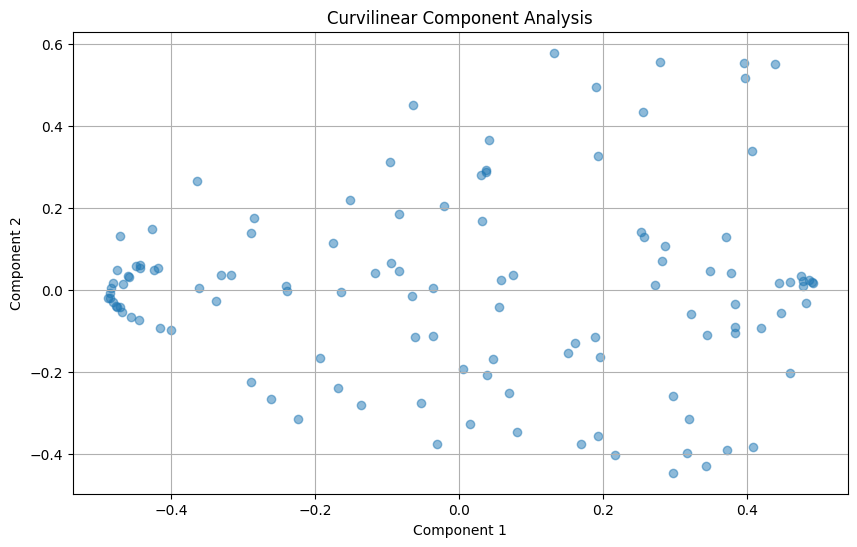

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import KernelPCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
data = pd.read_csv("Modern_Periodic_Table.csv")
data_numeric = data.select_dtypes(include=[np.number])
data_numeric.replace([np.inf, -np.inf], np.nan, inplace=True)
data_numeric = data_numeric.fillna(data_numeric.mean())
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_numeric)
cca = KernelPCA(n_components=2, kernel='rbf')
cca_pipeline = make_pipeline(scaler, cca)
transformed_data = cca_pipeline.fit_transform(data_numeric)
print(transformed_data)
plt.figure(figsize=(10, 6))
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], alpha=0.5)
plt.title('Curvilinear Component Analysis')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.grid(True)
plt.show()

**`Random Projection`**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.random_projection import GaussianRandomProjection
from sklearn.preprocessing import RobustScaler
class PeriodicTableRandomProjection:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.data = None
        self.random_projection = None
    def load_dataset(self):
        self.data = pd.read_csv(self.dataset_path)
    def preprocess_data(self):
        self.data = self.data.select_dtypes(include=np.number).dropna(axis=1)
    def scale_data(self):
        self.data.replace([np.inf, -np.inf], np.nan, inplace=True)
        self.data.dropna(inplace=True)
        scaler = RobustScaler()
        self.data = scaler.fit_transform(self.data)
    def fit_random_projection(self, n_components):
        self.random_projection = GaussianRandomProjection(n_components=n_components)
        self.random_projection.fit(self.data)
    def transform_data(self):
        if self.random_projection is not None:
            projected_data = self.random_projection.transform(self.data)
            return projected_data
        else:
            print("Random Projection has not been fitted yet.")
            return None
if __name__ == "__main__":
    dataset_path = "Modern_Periodic_Table.csv"
    random_projection = PeriodicTableRandomProjection(dataset_path)
    random_projection.load_dataset()
    random_projection.preprocess_data()
    random_projection.scale_data()
    random_projection.fit_random_projection(n_components=10)
    transformed_data = random_projection.transform_data()
    if transformed_data is not None:
        print("Transformed data shape = ", transformed_data.shape)

Transformed data shape =  (38, 10)


/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (6 < 10).The dimensionality of the problem will not be reduced.
  warnings.warn(


**`Quadratic Discriminant Analysis`**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0:
  Mean = [-1.39235189 -1.4331631  -1.78121364  1.07574504 -1.46739785]
  Number of data points = 13
  Within-cluster sum of squares = 4.637797694787643

Cluster 1:
  Mean = [0.98559124 0.98431993 0.79137133 0.74411756 0.74049003]
  Number of data points = 32
  Within-cluster sum of squares = 38.3112020187649

Cluster 2:
  Mean = [-1.03279158 -1.0285931  -0.84516431 -1.16989004 -0.85609039]
  Number of data points = 21
  Within-cluster sum of squares = 24.047730974848996

Cluster 3:
  Mean = [-0.57559771 -0.54292249 -0.44785084  0.65198872 -0.59661615]
  Number of data points = 20
  Within-cluster sum of squares = 11.643634471046898

Cluster 4:
  Mean = [ 0.59885552  0.59369053  0.74355643 -0.79601609  0.76638523]
  Number of data points = 33
  Within-cluster sum of squares = 44.87164639299164



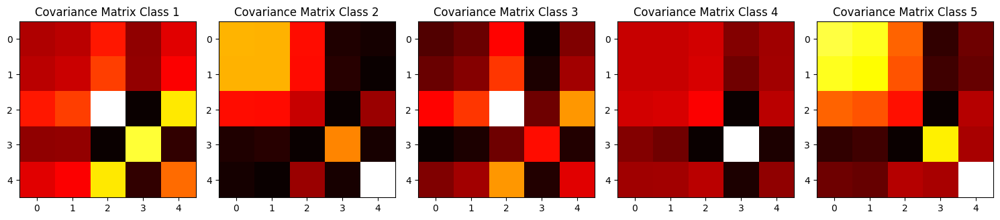

In [ ]:
import pandas as pd
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
dataset_path = "/content/Dataset/Modern_Periodic_Table.csv"
periodic_table = pd.read_csv(dataset_path)
X = periodic_table[['Atomic Mass', 'Atomic Number', 'Period', 'X Position', 'Y Position']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)
cluster_means = []
for label in np.unique(cluster_labels):
    X_class = X_scaled[cluster_labels == label]
    cluster_mean = np.mean(X_class, axis=0)
    cluster_means.append(cluster_mean)
within_cluster_sums = []
for label in np.unique(cluster_labels):
    X_class = X_scaled[cluster_labels == label]
    cluster_mean = cluster_means[label]
    within_cluster_sum = np.sum((X_class - cluster_mean) ** 2)
    within_cluster_sums.append(within_cluster_sum)
for label, mean, count, within_sum in zip(np.unique(cluster_labels), cluster_means, np.bincount(cluster_labels), within_cluster_sums):
    print(f"Cluster {label}:")
    print(f"  Mean = {mean}")
    print(f"  Number of data points = {count}")
    print(f"  Within-cluster sum of squares = {within_sum}")
    print()
cov_matrices = []
for label in np.unique(cluster_labels):
    X_class = X_scaled[cluster_labels == label]
    cov_matrix = np.cov(X_class, rowvar=False)
    cov_matrices.append(cov_matrix)
fig, axes = plt.subplots(1, len(cov_matrices), figsize=(15, 5))
for i, cov_matrix in enumerate(cov_matrices):
    axes[i].imshow(cov_matrix, cmap='hot', interpolation='nearest')
    axes[i].set_title(f'Covariance Matrix Class {i+1}')
plt.tight_layout()
plt.show()

**`Deep Autoencoding Gaussian Mixture Model (DAGMM)`**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.mixture import GaussianMixture
class Encoder(tf.keras.Model):
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, z_dim):
        super(Encoder, self).__init__()
        self.dense1 = tf.keras.layers.Dense(hidden_dim1, activation='relu')
        self.dense2 = tf.keras.layers.Dense(hidden_dim2, activation='relu')
        self.dense3 = tf.keras.layers.Dense(z_dim, activation=None)
    def call(self, inputs):
        x = self.dense1(inputs)
        x = self.dense2(x)
        z = self.dense3(x)
        return z
class Decoder(tf.keras.Model):
    def __init__(self, z_dim, hidden_dim2, hidden_dim1, output_dim):
        super(Decoder, self).__init__()
        self.dense1 = tf.keras.layers.Dense(hidden_dim2, activation='relu')
        self.dense2 = tf.keras.layers.Dense(hidden_dim1, activation='relu')
        self.dense3 = tf.keras.layers.Dense(output_dim, activation=None)
    def call(self, inputs):
        x = self.dense1(inputs)
        x = self.dense2(x)
        output = self.dense3(x)
        return output
class DAGMM:
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, z_dim, n_gmm_components):
        self.encoder = Encoder(input_dim, hidden_dim1, hidden_dim2, z_dim)
        self.decoder = Decoder(z_dim, hidden_dim2, hidden_dim1, input_dim)
        self.n_gmm_components = n_gmm_components
        self.gmm = GaussianMixture(n_components=n_gmm_components)
    def compute_energy(self, x, x_hat, z, gamma):
        recon_loss = tf.reduce_sum(tf.square(x - x_hat), axis=1)
        sample_energy = tf.reduce_sum(tf.square(z), axis=1)
        energy = tf.reduce_mean(recon_loss + gamma * sample_energy)
        return energy
    def fit(self, X_train, learning_rate=1e-3, epochs=100, batch_size=64, gamma=0.1):
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
        for epoch in range(epochs):
            idx = np.random.permutation(len(X_train))
            X_train_shuffled = X_train[idx]
            total_batch = len(X_train) // batch_size
            for i in range(total_batch):
                batch_x = X_train_shuffled[i * batch_size:(i + 1) * batch_size]
                with tf.GradientTape() as tape:
                    z = self.encoder(batch_x)
                    x_hat = self.decoder(z)
                    loss = self.compute_energy(batch_x, x_hat, z, gamma)
                gradients = tape.gradient(loss, self.encoder.trainable_variables + self.decoder.trainable_variables)
                optimizer.apply_gradients(zip(gradients, self.encoder.trainable_variables + self.decoder.trainable_variables))
            print("Epoch:", epoch + 1, "Loss = ", loss.numpy())
        encoded_data = self.encoder.predict(X_train)
        self.gmm.fit(encoded_data)
    def predict(self, X_test):
        encoded_data = self.encoder.predict(X_test)
        reconstructions = self.decoder.predict(encoded_data)
        energy = np.sum(np.square(X_test - reconstructions), axis=1)
        likelihood = -self.gmm.score_samples(encoded_data)
        anomaly_score = energy + likelihood
        return anomaly_score
    def print_details(self):
        print("Number of Gaussian components:", self.n_gmm_components)
        print("Encoder Architecture:")
        print(self.encoder.summary())
        print("Decoder Architecture:")
        print(self.decoder.summary())
        print("")
        print("Means:\n", self.gmm.means_)
        print("")
        print("Covariances:\n", self.gmm.covariances_)
        print("")
        print("Weights = ", self.gmm.weights_)
data = pd.read_csv("Periodic_Table.csv")
data.dropna(inplace=True)
X = data.drop(columns=["Atomic Number", "Period", "Group", "Electron Affinity"])
input_dim = X.shape[1]
hidden_dim1 = 64
hidden_dim2 = 32
z_dim = 10
n_gmm_components = 3
dagmm = DAGMM(input_dim, hidden_dim1, hidden_dim2, z_dim, n_gmm_components)
dagmm.fit(X.values)
dagmm.print_details()

Epoch: 1 Loss =  15929962.0
Epoch: 2 Loss =  14454893.0
Epoch: 3 Loss =  14274748.0
Epoch: 4 Loss =  14863837.0
Epoch: 5 Loss =  13699827.0
Epoch: 6 Loss =  13419476.0
Epoch: 7 Loss =  12298058.0
Epoch: 8 Loss =  14298340.0
Epoch: 9 Loss =  13275216.0
Epoch: 10 Loss =  12655763.0
Epoch: 11 Loss =  13311578.0
Epoch: 12 Loss =  11871128.0
Epoch: 13 Loss =  12721136.0
Epoch: 14 Loss =  11222131.0
Epoch: 15 Loss =  11683319.0
Epoch: 16 Loss =  11964848.0
Epoch: 17 Loss =  10760816.0
Epoch: 18 Loss =  10268940.0
Epoch: 19 Loss =  10558049.0
Epoch: 20 Loss =  9403944.0
Epoch: 21 Loss =  10074942.0
Epoch: 22 Loss =  9660008.0
Epoch: 23 Loss =  9988363.0
Epoch: 24 Loss =  9086448.0
Epoch: 25 Loss =  8808700.0
Epoch: 26 Loss =  8638113.0
Epoch: 27 Loss =  8330857.5
Epoch: 28 Loss =  7240263.0
Epoch: 29 Loss =  6903029.0
Epoch: 30 Loss =  6762710.0
Epoch: 31 Loss =  5619396.5
Epoch: 32 Loss =  5468186.0
Epoch: 33 Loss =  4858986.0
Epoch: 34 Loss =  4304903.0
Epoch: 35 Loss =  3882227.2
Epoch: 36

**`Linear Autoencoder`**

Epoch [1/100], Loss: 1.1926
Epoch [2/100], Loss: 1.1866
Epoch [3/100], Loss: 1.1808
Epoch [4/100], Loss: 1.1750
Epoch [5/100], Loss: 1.1692
Epoch [6/100], Loss: 1.1635
Epoch [7/100], Loss: 1.1579
Epoch [8/100], Loss: 1.1523
Epoch [9/100], Loss: 1.1468
Epoch [10/100], Loss: 1.1413
Epoch [11/100], Loss: 1.1359
Epoch [12/100], Loss: 1.1305
Epoch [13/100], Loss: 1.1251
Epoch [14/100], Loss: 1.1198
Epoch [15/100], Loss: 1.1145
Epoch [16/100], Loss: 1.1093
Epoch [17/100], Loss: 1.1041
Epoch [18/100], Loss: 1.0989
Epoch [19/100], Loss: 1.0938
Epoch [20/100], Loss: 1.0887
Epoch [21/100], Loss: 1.0836
Epoch [22/100], Loss: 1.0785
Epoch [23/100], Loss: 1.0735
Epoch [24/100], Loss: 1.0685
Epoch [25/100], Loss: 1.0635
Epoch [26/100], Loss: 1.0585
Epoch [27/100], Loss: 1.0535
Epoch [28/100], Loss: 1.0485
Epoch [29/100], Loss: 1.0435
Epoch [30/100], Loss: 1.0386
Epoch [31/100], Loss: 1.0336
Epoch [32/100], Loss: 1.0287
Epoch [33/100], Loss: 1.0237
Epoch [34/100], Loss: 1.0188
Epoch [35/100], Loss: 1

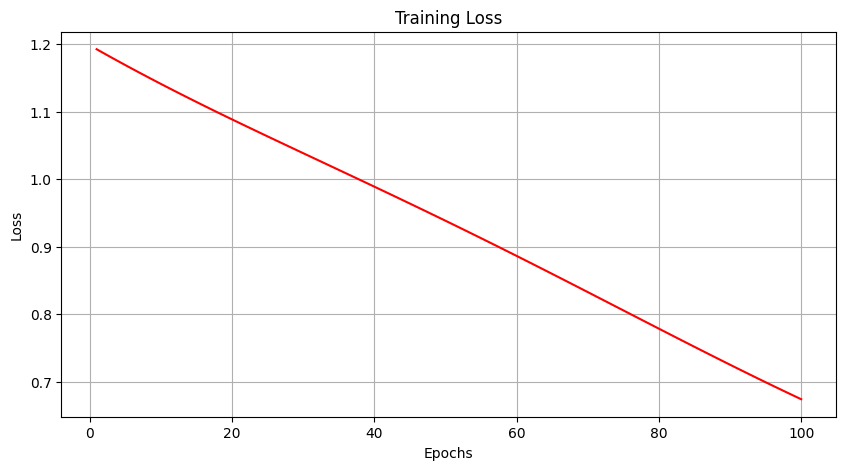

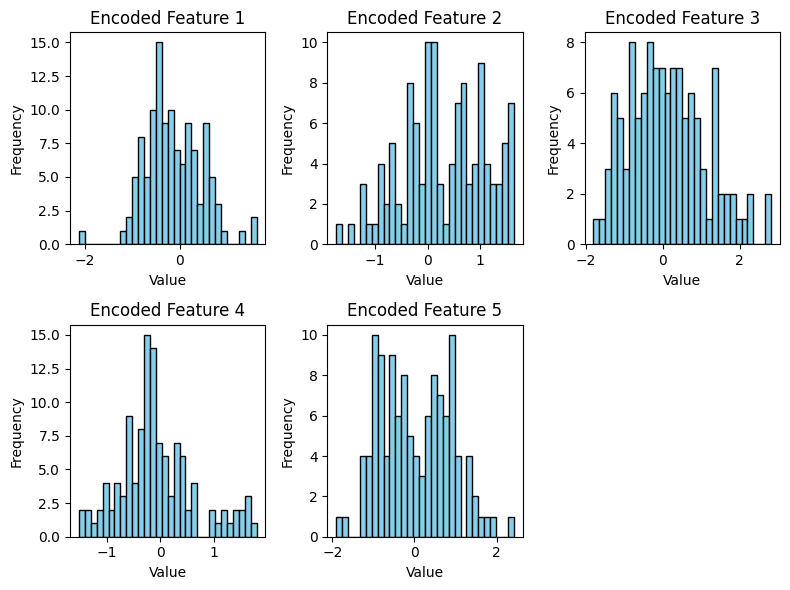

Encoded Features:
[[ 8.00703585e-01 -6.72660947e-01  1.66073573e+00  1.79855633e+00
   3.38623732e-01]
 [ 8.12496424e-01 -1.74182415e+00  2.81416559e+00  5.94823658e-01
   1.77889943e+00]
 [ 9.66637731e-01 -3.42799038e-01  1.40101004e+00  1.44480455e+00
   5.32529414e-01]
 [ 1.59985054e+00 -1.01827055e-01  1.72575247e+00  9.78769243e-01
   1.36056232e+00]
 [ 1.61950803e+00 -8.38759065e-01  2.00456452e+00 -5.93957722e-01
   2.41761732e+00]
 [ 1.36486018e+00 -6.64630771e-01  2.05676007e+00 -2.11001396e-01
   1.90929830e+00]
 [ 5.82495987e-01 -1.24365377e+00  2.21182656e+00  6.63349628e-01
   1.32502162e+00]
 [ 2.45368496e-01 -1.26828778e+00  1.80645990e+00  4.01754588e-01
   1.01960146e+00]
 [-1.78374842e-01 -1.27980709e+00  1.27855444e+00  8.35088715e-02
   6.20800555e-01]
 [ 7.26715684e-01 -1.42892671e+00  2.67363358e+00  6.63614511e-01
   1.69082630e+00]
 [ 5.52148938e-01 -1.12059802e-01  1.01400316e+00  1.55325043e+00
   1.48169965e-01]
 [ 8.51177812e-01 -1.22081041e-02  1.27965605e+

In [ ]:
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
data = pd.read_csv('Periodic_Table.csv')
features = ['Atomic Mass', 'Boiling Point', 'Density', 'Melting Point', 'Molar Heat',
            'Atomic Number', 'Period', 'Group', 'X Position', 'Y Position',
            'WX Position', 'WY Position', 'Electron Affinity']
data.fillna(data.mean(), inplace=True)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[features])
data_tensor = torch.tensor(data_scaled, dtype=torch.float32)
class Autoencoder(nn.Module):
    def __init__(self, input_size, encoding_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Linear(input_size, encoding_dim)
        self.decoder = nn.Linear(encoding_dim, input_size)
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
input_size = len(features)
encoding_dim = 5
model = Autoencoder(input_size, encoding_dim)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
losses = []
num_epochs = 100
for epoch in range(num_epochs):
    outputs = model(data_tensor)
    loss = criterion(outputs, data_tensor)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    losses.append(loss.item())
    if (epoch+1) % 1 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), losses, color='red')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.show()
encoded_features = model.encoder(data_tensor).detach().numpy()
encoded_mean = np.mean(encoded_features, axis=0)
encoded_std = np.std(encoded_features, axis=0)
plt.figure(figsize=(8, 6))
for i in range(encoding_dim):
    plt.subplot(2, 3, i+1)
    plt.hist(encoded_features[:, i], bins=30, color='skyblue', edgecolor='black')
    plt.title(f'Encoded Feature {i+1}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
print("Encoded Features:")
print(encoded_features)
print("Encoded Features (First 5 rows):")
print(encoded_features[:5])
print("\nMean of Encoded Features:")
print(encoded_mean)
print("\nStandard Deviation of Encoded Features:")
print(encoded_std)

**`Nonlinear Autoencoder`**

Dataset size: 119 samples, 13 features
Encoding dimension: 5
Epoch 1/100, Average Loss = 0.9954
Epoch 2/100, Average Loss = 0.9731
Epoch 3/100, Average Loss = 0.9645
Epoch 4/100, Average Loss = 0.9548
Epoch 5/100, Average Loss = 0.9410
Epoch 6/100, Average Loss = 0.9317
Epoch 7/100, Average Loss = 0.9216
Epoch 8/100, Average Loss = 0.9046
Epoch 9/100, Average Loss = 0.8942
Epoch 10/100, Average Loss = 0.8855
Epoch 11/100, Average Loss = 0.8646
Epoch 12/100, Average Loss = 0.8317
Epoch 13/100, Average Loss = 0.8232
Epoch 14/100, Average Loss = 0.7920
Epoch 15/100, Average Loss = 0.7723
Epoch 16/100, Average Loss = 0.7532
Epoch 17/100, Average Loss = 0.7292
Epoch 18/100, Average Loss = 0.7006
Epoch 19/100, Average Loss = 0.6762
Epoch 20/100, Average Loss = 0.6404
Epoch 21/100, Average Loss = 0.6185
Epoch 22/100, Average Loss = 0.5909
Epoch 23/100, Average Loss = 0.5652
Epoch 24/100, Average Loss = 0.5407
Epoch 25/100, Average Loss = 0.5171
Epoch 26/100, Average Loss = 0.4904
Epoch 27/100

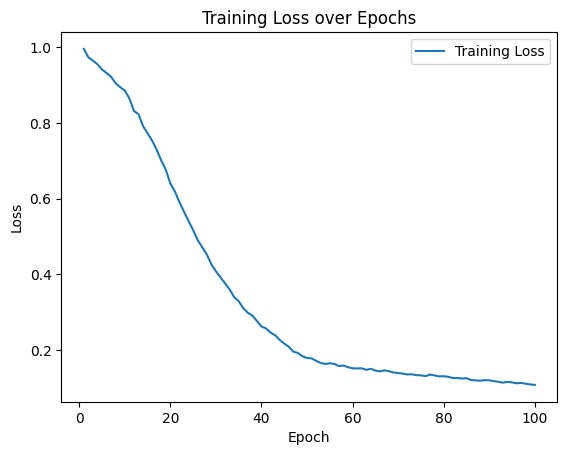

Final loss = 0.1080


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, encoding_dim),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 64),
            nn.ReLU(),
            nn.Linear(64, input_dim)
        )
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
class NonlinearAutoencoder:
    def __init__(self, input_dim, encoding_dim, learning_rate=0.001, batch_size=32, num_epochs=100):
        self.input_dim = input_dim
        self.encoding_dim = encoding_dim
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.num_epochs = num_epochs
        self.model = Autoencoder(input_dim, encoding_dim)
        self.criterion = nn.MSELoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=learning_rate)
        self.scaler = StandardScaler()
        self.train_losses = []
    def preprocess_data(self, data):
        data = data.dropna()
        scaled_data = self.scaler.fit_transform(data)
        return scaled_data
    def train(self, train_loader):
        for epoch in range(self.num_epochs):
            running_loss = 0.0
            for i, data in enumerate(train_loader, 1):
                inputs, _ = data
                inputs = inputs.float()
                self.optimizer.zero_grad()
                outputs = self.model(inputs)
                loss = self.criterion(outputs, inputs)
                loss.backward()
                self.optimizer.step()
                running_loss += loss.item()
                if i % 10 == 0:
                    print(f"Epoch {epoch+1}/{self.num_epochs}, Batch {i}/{len(train_loader)}, Loss: {loss.item():.4f}")
            epoch_loss = running_loss / len(train_loader)
            self.train_losses.append(epoch_loss)
            print(f"Epoch {epoch+1}/{self.num_epochs}, Average Loss = {epoch_loss:.4f}")
    def fit(self, data):
        processed_data = self.preprocess_data(data)
        train_data, _ = train_test_split(processed_data, test_size=0.2, random_state=42)
        train_loader = DataLoader(TensorDataset(torch.tensor(train_data), torch.zeros(len(train_data))), batch_size=self.batch_size, shuffle=True)
        self.train(train_loader)
    def encode(self, data):
        processed_data = self.preprocess_data(data)
        with torch.no_grad():
            encoded_data = self.model.encoder(torch.tensor(processed_data).float())
        return encoded_data.numpy()
    def decode(self, encoded_data):
        with torch.no_grad():
            decoded_data = self.model.decoder(torch.tensor(encoded_data).float())
        return decoded_data.numpy()
    def plot_training_loss(self):
        plt.plot(range(1, self.num_epochs + 1), self.train_losses, label='Training Loss')
        plt.title('Training Loss over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()
if __name__ == "__main__":
    data = pd.read_csv('Periodic_Table.csv')
    columns_of_interest = ['Atomic Mass', 'Boiling Point', 'Density', 'Melting Point', 'Molar Heat', 'Atomic Number', 'Period', 'Group', 'X Position', 'Y Position', 'WX Position', 'WY Position', 'Electron Affinity']
    data = data[columns_of_interest]
    print(f"Dataset size: {data.shape[0]} samples, {data.shape[1]} features")
    input_dim = len(columns_of_interest)
    encoding_dim = 5
    print(f"Encoding dimension: {encoding_dim}")
    autoencoder = NonlinearAutoencoder(input_dim, encoding_dim)
    autoencoder.fit(data)
    autoencoder.plot_training_loss()
    encoded_data = autoencoder.encode(data)
    decoded_data = autoencoder.decode(encoded_data)
    print(f"Final loss = {autoencoder.train_losses[-1]:.4f}")

**`Deep Variational Information Bottleneck (DVIB)`**

Epoch 1/100: 
Total Loss = 13.751812337239583 
Recon Loss = 13.671746826171875 
KL Loss = 0.0800655730565389
Epoch 2/100: 
Total Loss = 12.308024495442709 
Recon Loss = 12.220655517578125 
KL Loss = 0.08736920197804769
Epoch 3/100: 
Total Loss = 12.074526977539062 
Recon Loss = 11.931851806640625 
KL Loss = 0.1426749308904012
Epoch 4/100: 
Total Loss = 11.941591084798176 
Recon Loss = 11.752036539713542 
KL Loss = 0.1895542589823405
Epoch 5/100: 
Total Loss = 11.653214518229166 
Recon Loss = 11.420088195800782 
KL Loss = 0.2331261380513509
Epoch 6/100: 
Total Loss = 11.447954711914063 
Recon Loss = 11.144040934244792 
KL Loss = 0.30391338348388675
Epoch 7/100: 
Total Loss = 10.619334513346354 
Recon Loss = 10.209169514973958 
KL Loss = 0.41016480763753255
Epoch 8/100: 
Total Loss = 9.966508687337239 
Recon Loss = 9.402648111979167 
KL Loss = 0.5638605626424154
Epoch 9/100: 
Total Loss = 9.653593343098958 
Recon Loss = 8.887462972005208 
KL Loss = 0.7661304601033528
Epoch 10/100: 
Total

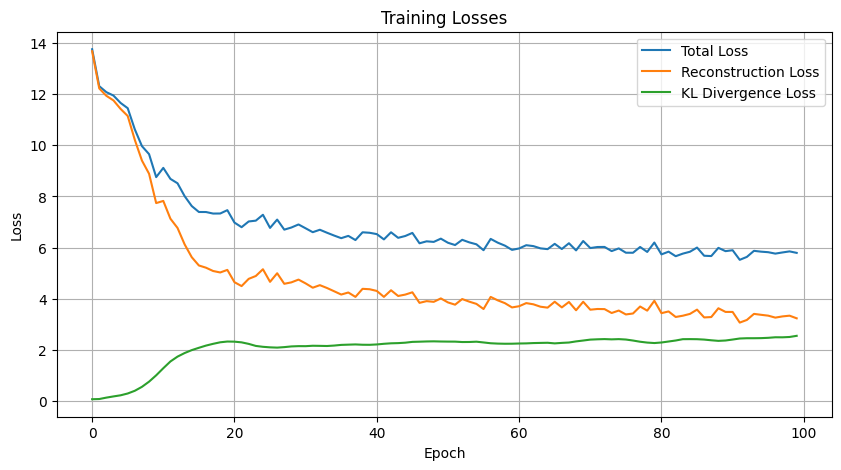

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
data = pd.read_csv("Periodic_Table.csv")
data.dropna(inplace=True)
features = data.drop(columns=['Atomic Mass'])
target = data['Atomic Mass']
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)
X = torch.tensor(scaled_features, dtype=torch.float32)
y = torch.tensor(target.values, dtype=torch.float32)
class DVIB(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(DVIB, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(),
            nn.Linear(512, latent_dim * 2)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 512),
            nn.ReLU(),
            nn.Linear(512, input_dim)
        )
        self.latent_dim = latent_dim
    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        enc = self.encoder(x)
        mu, log_var = enc[:, :self.latent_dim], enc[:, self.latent_dim:]
        z = self.reparameterize(mu, log_var)
        dec = self.decoder(z)
        return dec, mu, log_var
input_dim = X.shape[1]
latent_dim = 2
model = DVIB(input_dim, latent_dim)
def dvib_loss(recon_x, x, mu, log_var):
    recon_loss = nn.functional.mse_loss(recon_x, x, reduction='sum')
    kl_divergence = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
    return recon_loss + kl_divergence
optimizer = optim.Adam(model.parameters(), lr=1e-3)
epochs = 100
batch_size = 64
dataset = TensorDataset(X, y)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
total_losses = []
recon_losses = []
kl_losses = []
for epoch in range(epochs):
    total_loss = 0
    recon_loss_total = 0
    kl_loss_total = 0
    for batch in dataloader:
        optimizer.zero_grad()
        inputs, _ = batch
        recon_batch, mu, log_var = model(inputs)
        loss = dvib_loss(recon_batch, inputs, mu, log_var)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        recon_loss_total += nn.functional.mse_loss(recon_batch, inputs, reduction='sum').item()
        kl_loss_total += -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp()).item()
    recon_loss_avg = recon_loss_total / len(dataset)
    kl_loss_avg = kl_loss_total / len(dataset)
    total_losses.append(total_loss / len(dataset))
    recon_losses.append(recon_loss_avg)
    kl_losses.append(kl_loss_avg)
    print(f"Epoch {epoch+1}/{epochs}: \nTotal Loss = {total_losses[-1]} \nRecon Loss = {recon_losses[-1]} \nKL Loss = {kl_losses[-1]}")
plt.figure(figsize=(10, 5))
plt.plot(total_losses, label='Total Loss')
plt.plot(recon_losses, label='Reconstruction Loss')
plt.plot(kl_losses, label='KL Divergence Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Losses')
plt.legend()
plt.grid(True)
plt.show()

**`Principal Curves`**

In [ ]:
import numpy as np
import pandas as pd
from tabulate import tabulate
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.impute import SimpleImputer
class PrincipalCurve:
    def __init__(self, n_components=2, epsilon=1e-5, max_iter=100):
        self.n_components = n_components
        self.epsilon = epsilon
        self.max_iter = max_iter
    def fit(self, X):
        self.pca = PCA(n_components=self.n_components)
        self.pca.fit(X)
        self.X_pca = self.pca.transform(X)
        self.nbrs = NearestNeighbors(n_neighbors=1).fit(self.X_pca)
        self.points = np.copy(self.X_pca)
        for _ in range(self.max_iter):
            distances, indices = self.nbrs.kneighbors(self.points)
            target_points = self.X_pca[indices.ravel()]
            self.points += self.epsilon * (target_points - self.points)
    def transform(self, X):
        return self.points
data = pd.read_csv("Periodic_Table.csv")
X = data.drop(['Atomic Number', 'Period', 'Group', 'X Position', 'Y Position', 'WX Position', 'WY Position'], axis=1)
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
model = PrincipalCurve()
model.fit(X_imputed)
X_on_curve = model.transform(X_imputed)
print(X_on_curve)
curve_data = pd.DataFrame(X_on_curve, columns=['Principal Curve Dimension 1', 'Principal Curve Dimension 2'])
print(tabulate(curve_data, headers='keys', tablefmt='pretty'))

[[-2.72614218e+03 -4.79533183e+00]
 [-2.74631202e+03 -1.27144126e+00]
 [-1.11442869e+03  3.12349802e+02]
 [ 3.99894444e+02 -1.66136000e+02]
 [ 2.05687536e+03 -2.16474663e+02]
 [-1.03729145e+00 -6.82563028e-01]
 [-2.65296927e+03 -2.36321804e+01]
 [-2.64543042e+03 -8.84059596e+00]
 [-2.65041167e+03 -8.87068755e+00]
 [-2.71514573e+03 -1.25002911e+01]
 [-1.55079335e+03  1.85839628e+02]
 [-1.11815365e+03 -2.15382962e+02]
 [ 1.19778350e+02  3.95068359e+02]
 [ 1.16835829e+03  7.91000231e+01]
 [-8.97891570e-01 -8.87037950e-01]
 [-1.93457615e+03 -2.51337226e+01]
 [-2.45958941e+03 -4.49937473e+01]
 [-2.63461247e+03 -3.81135024e+01]
 [-1.67692942e+03  1.60869668e+02]
 [-6.79787519e+02 -2.09723047e+02]
 [ 8.42106819e+02 -2.27620643e+02]
 [ 1.30214886e+03 -1.38824280e+02]
 [ 1.51800426e+03 -3.00869734e+02]
 [ 8.58955824e+02 -6.28274605e+02]
 [ 1.72493058e+01 -3.12142490e+02]
 [ 8.63193147e+02 -2.13641953e+02]
 [ 9.02902608e+02 -1.45190147e+02]
 [ 7.08905683e+02 -1.97454017e+02]
 [ 3.92678109e+02  5

**`Self-Organizing Feature Maps (SOFM)`**

Epoch 1/10, Total Error: 7997.100990813969
Epoch 2/10, Total Error: 9523.342663086976
Epoch 3/10, Total Error: 9409.893405238125
Epoch 4/10, Total Error: 9408.942322861036
Epoch 5/10, Total Error: 9408.940346672862
Epoch 6/10, Total Error: 9408.940343229571
Epoch 7/10, Total Error: 9408.940343223627
Epoch 8/10, Total Error: 9408.940343223618
Epoch 9/10, Total Error: 9408.940343223618
Epoch 10/10, Total Error: 9408.940343223618
Trained Weights:
[[ 1.5196528   0.6778674   1.35310117  0.13633644  1.5530971   1.46401361
   1.26008666 -0.48605993 -0.14073878  1.33394188 -0.563001    1.26008666
  -0.14557301]
 [ 1.77334766  0.35059924  1.20244737 -0.20910127  3.90727837  1.69927329
   1.47188385 -0.78349693 -0.0704528   1.74921362 -0.8621234   1.47188385
  -0.81948145]
 [ 1.52085753  0.36123852  1.05896842 -0.18228821  1.59821625  1.46485497
   1.2525431  -0.39128983  0.04083106  1.37613091 -0.52840075  1.2525431
  -0.36237387]
 [ 1.20660722 -0.20130055  0.6135428  -0.49702505  0.6120818   1

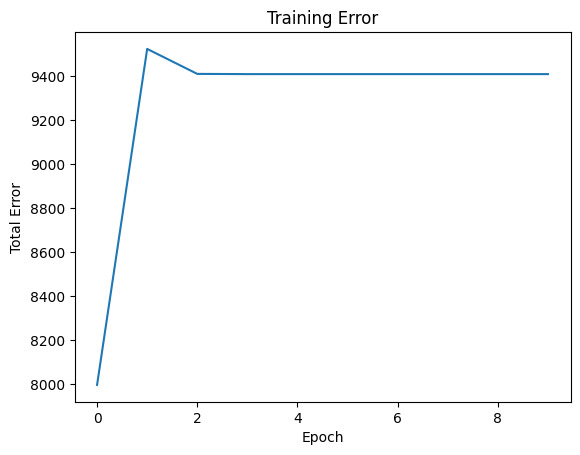

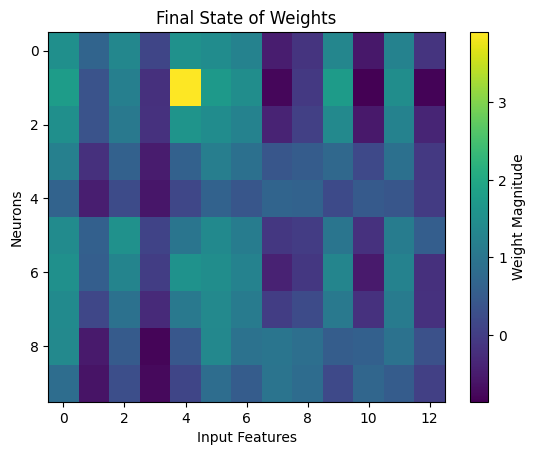

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
data = np.genfromtxt('Periodic_Table.csv', delimiter=',', skip_header=1)
data = data[~np.isnan(data).any(axis=1)]
data = (data - np.mean(data, axis=0)) / np.std(data, axis=0)
input_size = data.shape[1]
output_size = 10
learning_rate = 0.5
epochs = 10
weights = np.random.rand(output_size, input_size)
error_list = []
for epoch in range(epochs):
    total_error = 0
    for sample in data:
        distances = np.linalg.norm(weights - sample, axis=1)
        winner = np.argmin(distances)
        for i, w in enumerate(weights):
            neighborhood = np.exp(-np.linalg.norm(np.array([winner // 5, winner % 5]) - np.array([i // 5, i % 5])))
            weights[i] += learning_rate * neighborhood * (sample - w)
            total_error += np.sum((sample - weights[i]) ** 2)
    error_list.append(total_error)
    print(f'Epoch {epoch + 1}/{epochs}, Total Error: {total_error}')
print('Trained Weights:')
print(weights)
plt.plot(error_list)
plt.title('Training Error')
plt.xlabel('Epoch')
plt.ylabel('Total Error')
plt.show()
plt.imshow(weights, cmap='viridis', aspect='auto')
plt.title('Final State of Weights')
plt.colorbar(label='Weight Magnitude')
plt.xlabel('Input Features')
plt.ylabel('Neurons')
plt.show()

**`Domain Adaptation`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
class DomainAdaptation:
    def __init__(self, data):
        self.data = data
    def train_test_split(self, test_size=0.2):
        self.train_data, self.test_data = train_test_split(self.data, test_size=test_size)
    def preprocess_data(self):
        self.train_data = self.train_data.dropna()
        self.test_data = self.test_data.dropna()
    def fit_source_model(self):
        self.model = LinearRegression()
        self.model.fit(self.train_data.drop(columns=['Boiling Point']), self.train_data['Boiling Point'])
        print("Coefficients of the fitted linear regression model:")
        for feature, coef in zip(self.train_data.drop(columns=['Boiling Point']).columns, self.model.coef_):
            print(f"{coef} ({feature})")
    def evaluate_on_target(self, target_data):
        target_data = target_data.dropna()
        target_X = target_data.drop(columns=['Boiling Point'])
        target_y_true = target_data['Boiling Point']
        target_y_pred = self.model.predict(target_X)
        mse = mean_squared_error(target_y_true, target_y_pred)
        print("\nMean Squared Error on Target Domain =", mse)
data = pd.read_csv('Periodic_Table.csv')
domain_adaptation = DomainAdaptation(data)
domain_adaptation.train_test_split()
domain_adaptation.preprocess_data()
domain_adaptation.fit_source_model()
domain_adaptation.evaluate_on_target(data)

Coefficients of the fitted linear regression model:
50.9792925978833 (Atomic Mass)
57.661599161586025 (Density)
1.183457351676914 (Melting Point)
-18.40865441074742 (Molar Heat)
-151.9269437176065 (Atomic Number)
3.066967446466906 (Period)
76.35924709916495 (Group)
-144.98472064866655 (X Position)
397.32448064339223 (Y Position)
36.734101725833774 (WX Position)
3.066967446466804 (WY Position)
1.2724918657582618 (Electron Affinity)

Mean Squared Error on Target Domain = 244509.11101504


**`Model Stacking`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.base import BaseEstimator, TransformerMixin
class FeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, feature_names):
        self.feature_names = feature_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.feature_names]
class StackingModel:
    def __init__(self, base_models, meta_model):
        self.base_models = base_models
        self.meta_model = meta_model
    def fit_base_models(self, X, y):
        for model in self.base_models:
            model.fit(X, y)
    def predict_base_models(self, X):
        predictions = pd.DataFrame()
        for i, model in enumerate(self.base_models):
            predictions[f'model_{i+1}'] = model.predict(X)
        return predictions
    def fit(self, X, y):
        self.fit_base_models(X, y)
        meta_features = self.predict_base_models(X)
        self.meta_model.fit(meta_features, y)
    def predict(self, X):
        meta_features = self.predict_base_models(X)
        return self.meta_model.predict(meta_features)
periodic_table = pd.read_csv("Periodic_Table.csv")
periodic_table_cleaned = periodic_table.dropna()
X = periodic_table_cleaned.drop(columns=["Boiling Point"])
y = periodic_table_cleaned["Boiling Point"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
base_models = [
    RandomForestRegressor(n_estimators=100, random_state=42),
    GradientBoostingRegressor(n_estimators=100, random_state=42)
]
meta_model = LinearRegression()
stacking_model = StackingModel(base_models, meta_model)
stacking_model.fit(X_train, y_train)
y_pred = stacking_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error = {mse}")

Mean Squared Error = 438276.1593688891


**`Ensemble Learning`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
class PeriodicTableEnsemble:
    def __init__(self, data_file):
        self.data = pd.read_csv(data_file)
        self.data.dropna(inplace=True)
        self.X = self.data.drop(columns=['Boiling Point'])
        self.y = self.data['Boiling Point']
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(
            self.X, self.y, test_size=0.2, random_state=42)
        self.models = []
    def train_model(self, n_estimators=100, max_depth=None):
        model = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)
        model.fit(self.X_train, self.y_train)
        self.models.append(model)
        return model
    def predict(self, X):
        predictions = []
        for model in self.models:
            prediction = model.predict(X)
            predictions.append(prediction)
        return predictions
    def evaluate(self):
        ensemble_predictions = self.predict(self.X_test)
        average_prediction = sum(ensemble_predictions) / len(ensemble_predictions)
        mse = mean_squared_error(self.y_test, average_prediction)
        return mse
ensemble = PeriodicTableEnsemble("Periodic_Table.csv")
ensemble.train_model()
mse = ensemble.evaluate()
print("Mean Squared Error =", mse)

Mean Squared Error = 454181.70584566676


**`Multi-task Learning`**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, make_scorer
data = pd.read_csv("Periodic_Table.csv")
X = data.drop(columns=['Boiling Point', 'Density', 'Melting Point'])
y = data[['Boiling Point', 'Density', 'Melting Point']]
missing_rows = X.index.difference(y.index)
X.drop(index=missing_rows, inplace=True)
y.drop(index=missing_rows, inplace=True)
y.dropna(inplace=True)
X.dropna(inplace=True)
common_indices = X.index.intersection(y.index)
X = X.loc[common_indices]
y = y.loc[common_indices]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', MultiOutputRegressor(RandomForestRegressor(random_state=42)))
])
param_grid = {
    'regressor__estimator__n_estimators': [50, 100, 150],
    'regressor__estimator__max_depth': [None, 10, 20],
}
scorer = make_scorer(rmse, greater_is_better=False)
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring=scorer, verbose=2)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = -grid_search.best_score_
print("\nBest Parameters:", best_params)
print("Best RMSE =", best_score)
pipeline.set_params(**best_params)
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
test_rmse = rmse(y_test, y_pred)
print("\nTest RMSE =", test_rmse)

<ipython-input-21-754921cd8524>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.drop(index=missing_rows, inplace=True)
<ipython-input-21-754921cd8524>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.dropna(inplace=True)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=50; total time=   0.2s
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=50; total time=   0.2s
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=50; total time=   0.2s
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=50; total time=   0.2s
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=50; total time=   0.2s
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=100; total time=   0.4s
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=100; total time=   0.4s
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=100; total time=   0.4s
[CV] END regressor__estimator__max_depth=None, regressor__estimator__n_estimators=100; total time

**`Meta Learning`**

In [ ]:
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from sklearn.impute import SimpleImputer
class PeriodicTable:
    def __init__(self, data_path):
        self.data = pd.read_csv(data_path)
        self.features = ['Atomic Mass', 'Boiling Point', 'Density', 'Melting Point',
                         'Molar Heat', 'Atomic Number', 'Period', 'Group',
                         'X Position', 'Y Position', 'WX Position', 'WY Position',
                         'Electron Affinity']
        self.data.dropna(subset=self.features, inplace=True)
        self.neighbor_model = NearestNeighbors(n_neighbors=5, algorithm='auto')
        self.neighbor_model.fit(self.data[self.features])
    def get_similar_elements(self, element_props):
        distances, indices = self.neighbor_model.kneighbors([element_props])
        similar_elements = self.data.iloc[indices[0]]
        return similar_elements
    def predict_property(self, element_props, property_name):
        similar_elements = self.get_similar_elements(element_props)
        predicted_value = similar_elements[property_name].mean()
        return predicted_value
periodic_table = PeriodicTable('Periodic_Table.csv')
element_props = [55.85, None, 7.874, None, None, 26, None, None, None, None, None, None, None]
element_props_complete = [55.85, 3000, 7.874, 1808, 25.10, 26, 4, 8, 3, 4, 6, 10, 14]
predicted_boiling_point = periodic_table.predict_property(element_props_complete, 'Boiling Point')
print("Predicted Boiling Point for Iron =", predicted_boiling_point, "°C")

Predicted Boiling Point for Iron = 3052.0 °C


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(


**`Deep Belief Network (DBN)`**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import mean_squared_error
data = pd.read_csv('Periodic_Table.csv')
data.dropna(inplace=True)
X = data.drop(columns=['Atomic Mass'])
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train, X_test = train_test_split(X_scaled, test_size=0.2, random_state=42)
class DBN:
    def __init__(self, layer_sizes):
        self.model = Sequential()
        for i in range(len(layer_sizes) - 1):
            self.model.add(Dense(layer_sizes[i+1], activation='relu', input_shape=(layer_sizes[i],)))
        self.model.add(Dense(1, activation='linear'))
        self.model.compile(optimizer='adam', loss='mean_squared_error')
    def train(self, X_train, y_train, epochs=100, batch_size=32):
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
    def predict(self, X_test):
        return self.model.predict(X_test)
layer_sizes = [X_train.shape[1], 100, 50]
dbn = DBN(layer_sizes)
dbn.train(X_train, X_train[:, 0], epochs=50)
y_pred = dbn.predict(X_test)
mse = mean_squared_error(X_test[:, 0], y_pred)
print("Mean Squared Error =", mse)

1/1 [==============================] - 0s 181ms/step
Mean Squared Error: 0.038477082072075695


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
data = pd.read_csv("Periodic_Table.csv")
data.dropna(inplace=True)
features = data.drop(columns=['Atomic Number'])
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)
X_train, X_test, y_train, y_test = train_test_split(scaled_features, data['Atomic Number'], test_size=0.2, random_state=42)
class RBM(tf.keras.Model):
    def __init__(self, num_visible, num_hidden):
        super(RBM, self).__init__()
        self.num_visible = num_visible
        self.num_hidden = num_hidden
        self.W = tf.Variable(tf.random.normal([num_visible, num_hidden], stddev=0.1))
        self.visible_bias = tf.Variable(tf.zeros([num_visible]))
        self.hidden_bias = tf.Variable(tf.zeros([num_hidden]))
    def call(self, inputs):
        hidden_prob = tf.nn.sigmoid(tf.matmul(inputs, self.W) + self.hidden_bias)
        hidden_state = tf.nn.relu(tf.sign(hidden_prob - tf.random.uniform(tf.shape(hidden_prob))))
        visible_prob = tf.nn.sigmoid(tf.matmul(hidden_state, tf.transpose(self.W)) + self.visible_bias)
        return visible_prob
class DBN(tf.keras.Model):
    def __init__(self, rbm_layers):
        super(DBN, self).__init__()
        self.rbm_layers = rbm_layers
    def call(self, inputs):
        x = inputs
        for rbm in self.rbm_layers:
            x = rbm(x)
        return x
num_visible = X_train.shape[1]
num_hidden_units = [256, 128]
rbm_layers = []
for num_hidden in num_hidden_units:
    rbm_layers.append(RBM(num_visible, num_hidden))
dbn = DBN(rbm_layers)
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001)
for i, rbm in enumerate(rbm_layers):
    print(f"\nTraining layer {i+1} of Restricted Boltzmann Machine")
    for epoch in range(50):
        with tf.GradientTape() as tape:
            reconstructed = rbm(X_train)
            loss = tf.reduce_mean(tf.square(X_train - reconstructed))
        gradients = tape.gradient(loss, rbm.trainable_variables)
        optimizer.apply_gradients(zip(gradients, rbm.trainable_variables))
        print(f"Epoch-{epoch+1}: Loss = {loss:.4f}")
reconstructed = dbn(X_test)
loss = tf.reduce_mean(tf.square(X_test - reconstructed))
print("\nTest Loss =", loss.numpy())


Training layer 1 of Restricted Boltzmann Machine
Epoch-1: Loss = 1.0288
Epoch-2: Loss = 1.0368
Epoch-3: Loss = 0.9996
Epoch-4: Loss = 0.9827
Epoch-5: Loss = 0.9587
Epoch-6: Loss = 0.9470
Epoch-7: Loss = 0.9309
Epoch-8: Loss = 0.9146
Epoch-9: Loss = 0.8973
Epoch-10: Loss = 0.8737
Epoch-11: Loss = 0.8835
Epoch-12: Loss = 0.8643
Epoch-13: Loss = 0.8568
Epoch-14: Loss = 0.8640
Epoch-15: Loss = 0.8718
Epoch-16: Loss = 0.8357
Epoch-17: Loss = 0.8416
Epoch-18: Loss = 0.8349
Epoch-19: Loss = 0.8454
Epoch-20: Loss = 0.8562
Epoch-21: Loss = 0.8239
Epoch-22: Loss = 0.8448
Epoch-23: Loss = 0.8340
Epoch-24: Loss = 0.8368
Epoch-25: Loss = 0.8200
Epoch-26: Loss = 0.8266
Epoch-27: Loss = 0.8301
Epoch-28: Loss = 0.8434
Epoch-29: Loss = 0.8187
Epoch-30: Loss = 0.8178
Epoch-31: Loss = 0.8283
Epoch-32: Loss = 0.8256
Epoch-33: Loss = 0.8211
Epoch-34: Loss = 0.8323
Epoch-35: Loss = 0.8268
Epoch-36: Loss = 0.8358
Epoch-37: Loss = 0.8159
Epoch-38: Loss = 0.8258
Epoch-39: Loss = 0.8204
Epoch-40: Loss = 0.8203

**`Transformer Network`**

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([60, 1])) that is different to the input size (torch.Size([60, 60, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([15, 1])) that is different to the input size (torch.Size([15, 15, 1])). This will likely lead to incorrect results due to broadcasting. Please ens

Epoch [1/100]: Train Loss = 7154.0107421875 & Val Loss = 8932.6865234375
Epoch [2/100]: Train Loss = 6549.28369140625 & Val Loss = 8660.3916015625
Epoch [3/100]: Train Loss = 6310.2509765625 & Val Loss = 8497.94921875
Epoch [4/100]: Train Loss = 6169.7265625 & Val Loss = 8400.216796875
Epoch [5/100]: Train Loss = 6086.10400390625 & Val Loss = 8344.78125
Epoch [6/100]: Train Loss = 6038.91162109375 & Val Loss = 8311.1123046875
Epoch [7/100]: Train Loss = 6009.8349609375 & Val Loss = 8285.4912109375
Epoch [8/100]: Train Loss = 5987.75390625 & Val Loss = 8262.048828125
Epoch [9/100]: Train Loss = 5967.12548828125 & Val Loss = 8238.841796875
Epoch [10/100]: Train Loss = 5946.7294921875 & Val Loss = 8215.2001953125
Epoch [11/100]: Train Loss = 5926.21044921875 & Val Loss = 8190.77685546875
Epoch [12/100]: Train Loss = 5905.017578125 & Val Loss = 8165.53125
Epoch [13/100]: Train Loss = 5882.87451171875 & Val Loss = 8139.64208984375
Epoch [14/100]: Train Loss = 5860.6923828125 & Val Loss = 81

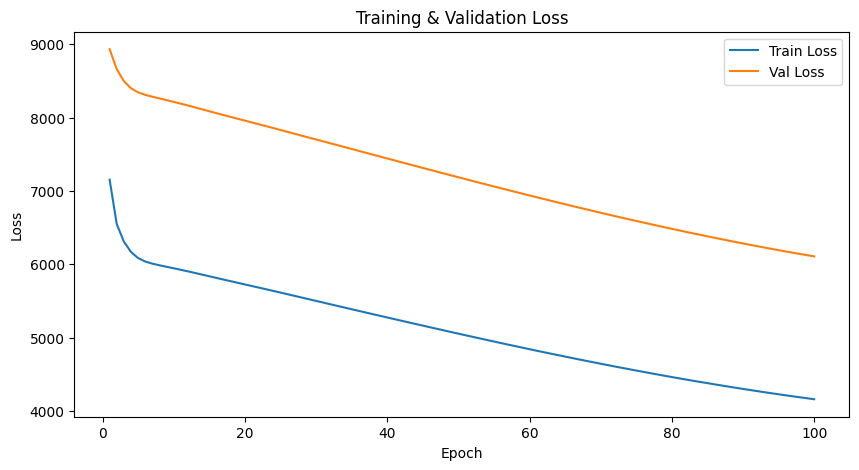

Final Overall Loss = 6109.70556640625


In [ ]:
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
class TransformerModel(nn.Module):
    def __init__(self, input_dim, output_dim, num_heads=8, hidden_dim=256, num_layers=6):
        super(TransformerModel, self).__init__()
        self.embedding = nn.Linear(input_dim, hidden_dim)
        self.pos_encoder = PositionalEncoding(hidden_dim)
        encoder_layers = nn.TransformerEncoderLayer(hidden_dim, num_heads, hidden_dim)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layers, num_layers)
        self.decoder = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = self.embedding(x)
        x = self.pos_encoder(x)
        x = self.transformer_encoder(x)
        x = self.decoder(x)
        return x
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-np.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)
    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)
class PeriodicTableDataset(Dataset):
    def __init__(self, csv_file):
        self.data = pd.read_csv(csv_file).dropna()
        self.data.reset_index(drop=True, inplace=True)
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):
        sample = self.data.iloc[idx].values.astype(np.float32)
        return sample[:-1], sample[-1]
dataset = PeriodicTableDataset("Periodic_Table.csv")
train_data, val_data = train_test_split(dataset, test_size=0.2, random_state=42)
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=64)
model = TransformerModel(input_dim=12, output_dim=1)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
num_epochs = 100
train_losses = []
val_losses = []
for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0.0
    for i, (inputs, targets) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets.unsqueeze(1))
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()
    model.eval()
    total_val_loss = 0.0
    with torch.no_grad():
        for inputs, targets in val_loader:
            outputs = model(inputs)
            val_loss = criterion(outputs, targets.unsqueeze(1)).item()
            total_val_loss += val_loss
    avg_train_loss = total_train_loss / len(train_loader)
    avg_val_loss = total_val_loss / len(val_loader)
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}]: Train Loss = {avg_train_loss} & Val Loss = {avg_val_loss}")
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.show()
print(f"Final Overall Loss = {val_losses[-1]}")

**`Capsule Network`**

Epoch 1/100: Loss = 38.4167
Epoch 2/100: Loss = 45.5662
Epoch 3/100: Loss = 41.5599
Epoch 4/100: Loss = 39.0391
Epoch 5/100: Loss = 44.0808
Epoch 6/100: Loss = 44.3972
Epoch 7/100: Loss = 40.1000
Epoch 8/100: Loss = 39.6985
Epoch 9/100: Loss = 40.0998
Epoch 10/100: Loss = 39.3299
Epoch 11/100: Loss = 40.3593
Epoch 12/100: Loss = 39.2463
Epoch 13/100: Loss = 46.1585
Epoch 14/100: Loss = 37.9744
Epoch 15/100: Loss = 38.6980
Epoch 16/100: Loss = 41.4687
Epoch 17/100: Loss = 38.9423
Epoch 18/100: Loss = 39.7941
Epoch 19/100: Loss = 40.4952
Epoch 20/100: Loss = 37.9476
Epoch 21/100: Loss = 43.1204
Epoch 22/100: Loss = 39.9055
Epoch 23/100: Loss = 35.6711
Epoch 24/100: Loss = 41.8773
Epoch 25/100: Loss = 36.2442
Epoch 26/100: Loss = 36.5550
Epoch 27/100: Loss = 39.9845
Epoch 28/100: Loss = 37.7881
Epoch 29/100: Loss = 39.8139
Epoch 30/100: Loss = 39.5719
Epoch 31/100: Loss = 35.4452
Epoch 32/100: Loss = 38.4121
Epoch 33/100: Loss = 38.0332
Epoch 34/100: Loss = 38.3474
Epoch 35/100: Loss = 38

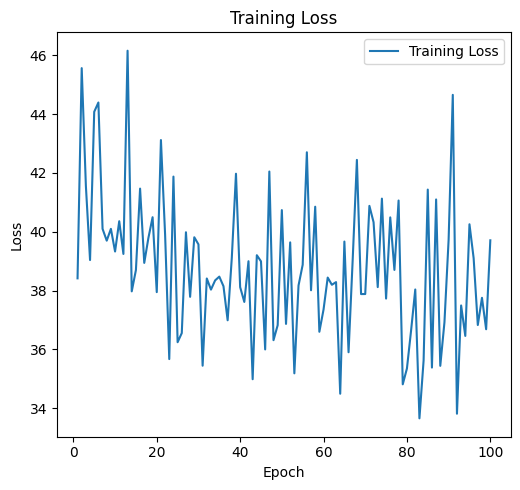

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
class CapsuleNetwork(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(CapsuleNetwork, self).__init__()
        self.dense = nn.Linear(input_dim, 64)
        self.capsule = nn.Linear(64, output_dim)
    def forward(self, x):
        x = torch.relu(self.dense(x))
        x = torch.sigmoid(self.capsule(x))
        return x
class PeriodicTableDataset(Dataset):
    def __init__(self, csv_file):
        self.data = pd.read_csv(csv_file).dropna()
        self.scaler = StandardScaler()
        self.features = self.data.drop(columns=['Atomic Number', 'Period', 'Group']).values
        self.features = self.scaler.fit_transform(self.features)
        self.labels = self.data[['Period', 'Group']].values
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):
        return {
            'features': torch.tensor(self.features[idx], dtype=torch.float32),
            'labels': torch.tensor(self.labels[idx], dtype=torch.float32)
        }
input_dim = 10
output_dim = 2
model = CapsuleNetwork(input_dim, output_dim)
dataset = PeriodicTableDataset("Periodic_Table.csv")
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
num_epochs = 100
train_losses = []
train_accuracies = []
for epoch in range(num_epochs):
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    for i, batch in enumerate(dataloader):
        features, labels = batch['features'], batch['labels']
        optimizer.zero_grad()
        outputs = model(features)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        predicted_labels = torch.round(outputs)
        correct_predictions += (predicted_labels == labels).sum().item()
        total_samples += labels.size(0)
    epoch_loss = running_loss / len(dataloader)
    epoch_accuracy = correct_predictions / total_samples
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)
    print(f"Epoch {epoch+1}/{num_epochs}: Loss = {epoch_loss:.4f}")
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()
plt.tight_layout()
plt.show()

**`Temporal Convolutional Network (TCN)`**

Epoch 1/10
2/2 [==============================] - 1s 169ms/step - loss: 2566387.2500 - val_loss: 2247275.7500
Epoch 2/10
2/2 [==============================] - 0s 31ms/step - loss: 2082201.0000 - val_loss: 1828544.0000
Epoch 3/10
2/2 [==============================] - 0s 30ms/step - loss: 1617083.3750 - val_loss: 1496137.3750
Epoch 4/10
2/2 [==============================] - 0s 30ms/step - loss: 1298459.2500 - val_loss: 1210665.0000
Epoch 5/10
2/2 [==============================] - 0s 31ms/step - loss: 1011789.5625 - val_loss: 971827.3125
Epoch 6/10
2/2 [==============================] - 0s 30ms/step - loss: 767398.4375 - val_loss: 776189.7500
Epoch 7/10
2/2 [==============================] - 0s 29ms/step - loss: 565111.3750 - val_loss: 624608.8125
Epoch 8/10
2/2 [==============================] - 0s 30ms/step - loss: 422007.6562 - val_loss: 505154.3438
Epoch 9/10
2/2 [==============================] - 0s 29ms/step - loss: 297169.4688 - val_loss: 420371.4062
Epoch 10/10
1/1 [==========

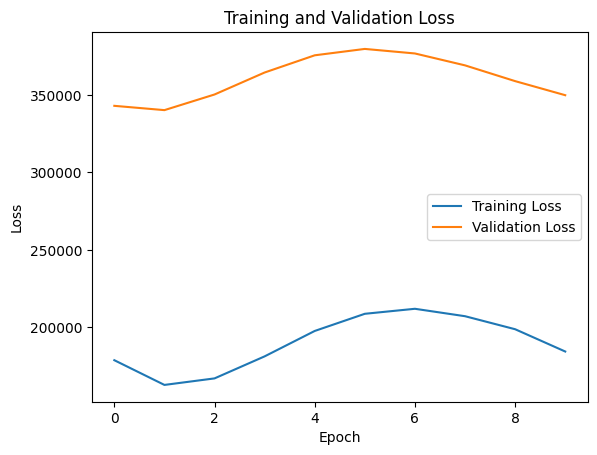

1/1 [==============================] - 0s 79ms/step


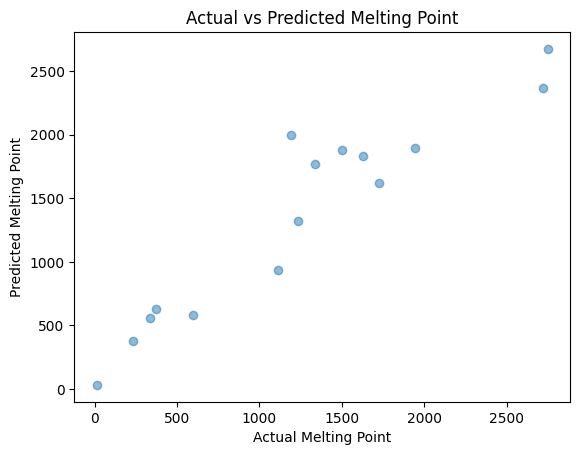

Epoch 1/10
2/2 [==============================] - 1s 184ms/step - loss: 2979590.2500 - val_loss: 2521694.7500
Epoch 2/10
2/2 [==============================] - 0s 34ms/step - loss: 2301712.0000 - val_loss: 1964289.6250
Epoch 3/10
2/2 [==============================] - 0s 35ms/step - loss: 1759148.8750 - val_loss: 1510329.8750
Epoch 4/10
2/2 [==============================] - 0s 33ms/step - loss: 1304998.6250 - val_loss: 1152556.0000
Epoch 5/10
2/2 [==============================] - 0s 33ms/step - loss: 929449.3125 - val_loss: 878623.6875
Epoch 6/10
2/2 [==============================] - 0s 32ms/step - loss: 669091.8125 - val_loss: 681976.5000
Epoch 7/10
2/2 [==============================] - 0s 36ms/step - loss: 469537.8750 - val_loss: 539927.4375
Epoch 8/10
2/2 [==============================] - 0s 34ms/step - loss: 342871.4062 - val_loss: 440340.7500
Epoch 9/10
2/2 [==============================] - 0s 33ms/step - loss: 252402.5625 - val_loss: 378398.0000
Epoch 10/10
1/1 [===========

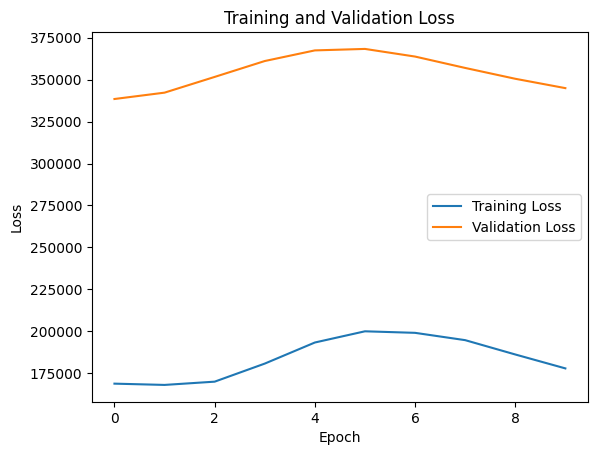

1/1 [==============================] - 0s 72ms/step


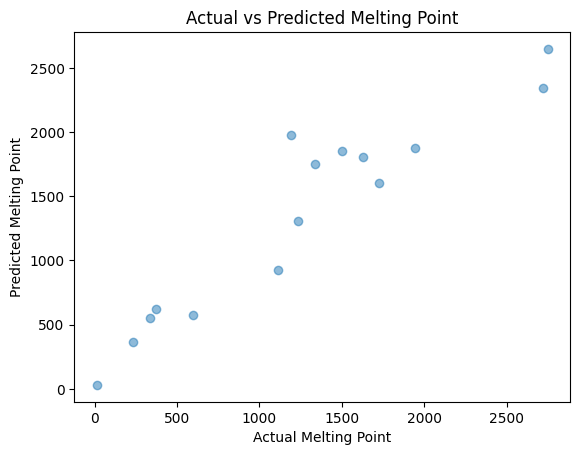

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
data = pd.read_csv('Periodic_Table.csv')
data = data.dropna()
X = data.drop(columns=['Melting Point'])
y = data['Melting Point']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = np.expand_dims(X_train, axis=2)
X_test = np.expand_dims(X_test, axis=2)
model = Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(1)
])
model.compile(optimizer=Adam(), loss=MeanSquaredError())
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)
loss = model.evaluate(X_test, y_test)
print("Test Loss =", loss)
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()
y_pred = model.predict(X_test)
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel('Actual Melting Point')
plt.ylabel('Predicted Melting Point')
plt.title('Actual vs Predicted Melting Point')
plt.show()

**`Deep Q-Network (DQN)`**

In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import random
class DQN(nn.Module):
    def __init__(self, input_size, output_size):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, output_size)
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x
class DQNAgent:
    def __init__(self, input_size, output_size, gamma=0.99, epsilon=1.0, epsilon_decay=0.995, epsilon_min=0.01, lr=0.001):
        self.input_size = input_size
        self.output_size = output_size
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min
        self.lr = lr
        self.model = DQN(input_size, output_size)
        self.optimizer = optim.Adam(self.model.parameters(), lr=lr)
        self.criterion = nn.MSELoss()
        self.memory = []
        self.batch_size = 64
    def select_action(self, state):
        if np.random.rand() < self.epsilon:
            return random.randrange(self.output_size)
        with torch.no_grad():
            q_values = self.model(torch.tensor(state).float())
            return torch.argmax(q_values).item()
    def replay(self):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)
        states = torch.tensor(states).float()
        actions = torch.tensor(actions).unsqueeze(1)
        rewards = torch.tensor(rewards).float()
        next_states = torch.tensor(next_states).float()
        dones = torch.tensor(dones).bool()
        q_values = self.model(states)
        next_q_values = self.model(next_states)
        target_q_values = q_values.clone()
        with torch.no_grad():
            target_q_values[range(self.batch_size), actions.squeeze()] = rewards + self.gamma * next_q_values.max(dim=1)[0] * ~dones
        loss = self.criterion(q_values, target_q_values)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
    def decay_epsilon(self):
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
periodic_table_data = pd.read_csv("Periodic_Table.csv").dropna()
state_space_size = len(periodic_table_data.columns) - 1
action_space_size = 10
agent = DQNAgent(input_size=state_space_size, output_size=action_space_size)
episodes = 100
for episode in range(episodes):
    state = periodic_table_data.sample().values[0][:-1]
    done = False
    total_reward = 0
    while not done:
        action = agent.select_action(state)
        next_state = periodic_table_data.sample().values[0][:-1]
        reward = 1 if action == next_state[-1] else 0
        done = True
        total_reward += reward
        agent.memory.append((state, action, reward, next_state, done))
        state = next_state
        agent.replay()
        agent.decay_epsilon()
    if episode % 1 == 0:
        print(f"Episode: {episode}, Total Reward: {total_reward}, Epsilon: {agent.epsilon}")

Episode: 0, Total Reward: 0, Epsilon: 0.995
Episode: 1, Total Reward: 0, Epsilon: 0.990025
Episode: 2, Total Reward: 0, Epsilon: 0.985074875
Episode: 3, Total Reward: 0, Epsilon: 0.9801495006250001
Episode: 4, Total Reward: 1, Epsilon: 0.9752487531218751
Episode: 5, Total Reward: 0, Epsilon: 0.9703725093562657
Episode: 6, Total Reward: 0, Epsilon: 0.9655206468094844
Episode: 7, Total Reward: 0, Epsilon: 0.960693043575437
Episode: 8, Total Reward: 0, Epsilon: 0.9558895783575597
Episode: 9, Total Reward: 0, Epsilon: 0.9511101304657719
Episode: 10, Total Reward: 0, Epsilon: 0.946354579813443
Episode: 11, Total Reward: 0, Epsilon: 0.9416228069143757
Episode: 12, Total Reward: 0, Epsilon: 0.9369146928798039
Episode: 13, Total Reward: 0, Epsilon: 0.9322301194154049
Episode: 14, Total Reward: 1, Epsilon: 0.9275689688183278
Episode: 15, Total Reward: 0, Epsilon: 0.9229311239742362
Episode: 16, Total Reward: 0, Epsilon: 0.918316468354365
Episode: 17, Total Reward: 0, Epsilon: 0.9137248860125932

**`Support Vector Machine (SVM)`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
data = pd.read_csv("Periodic_Table.csv")
data.dropna(inplace=True)
X = data[['Atomic Mass', 'Boiling Point', 'Density', 'Melting Point', 'Molar Heat',
          'Atomic Number', 'Group', 'X Position', 'Y Position',
          'WX Position', 'WY Position', 'Electron Affinity']]
y = data['Period']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
param_grid = {'C': [0.1, 1, 10, 100],
              'gamma': [0.001, 0.01, 0.1, 1],
              'kernel': ['linear', 'rbf', 'poly'],
              'class_weight': [None, 'balanced']}
svm = SVC()
grid_search = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)
print("Best parameters:", grid_search.best_params_)
best_svm = grid_search.best_estimator_
y_pred = best_svm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy =", accuracy)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Best parameters: {'C': 10, 'class_weight': 'balanced', 'gamma': 0.01, 'kernel': 'rbf'}
Accuracy = 0.8


**`K-Nearest Neighbors (KNN)`**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from collections import Counter
class KNN:
    def __init__(self, k=5):
        self.k = k
    def fit(self, X_train, y_train):
        self.X_train = X_train
        self.y_train = y_train
    def euclidean_distance(self, x1, x2):
        return np.sqrt(np.sum((x1 - x2) ** 2))
    def predict(self, X_test):
        y_pred = [self._predict(x) for x in X_test]
        return np.array(y_pred)
    def _predict(self, x):
        distances = [self.euclidean_distance(x, x_train) for x_train in self.X_train]
        k_indices = np.argsort(distances)[:self.k]
        k_nearest_labels = [self.y_train.iloc[i] for i in k_indices]
        return np.mean(k_nearest_labels)
data = pd.read_csv('Periodic_Table.csv')
data.dropna(inplace=True)
X = data.drop('Boiling Point', axis=1)
y = data['Boiling Point']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
knn = KNN(k=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error =", mse)
r_squared = r2_score(y_test, y_pred)
print("R-squared =", r_squared)

Mean Squared Error = 768065.4971160667
R-squared = 0.6342714140281551


**`Gaussian Naive Bayes`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
class NaiveBayesClassifier:
    def __init__(self):
        self.model = GaussianNB()
    def train(self, X_train, y_train):
        self.model.fit(X_train, y_train)
    def predict(self, X_test):
        return self.model.predict(X_test)
def load_dataset(file_path):
    df = pd.read_csv(file_path)
    df = df.dropna()
    return df
def main():
    dataset = load_dataset("Periodic_Table.csv")
    X = dataset.drop(columns=['Group'])
    y = dataset['Group']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    nb_classifier = NaiveBayesClassifier()
    nb_classifier.train(X_train, y_train)
    y_pred = nb_classifier.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)
if __name__ == "__main__":
    main()

Accuracy: 0.6


**`Multinomial Naive Bayes`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
class MultinomialNaiveBayes:
    def __init__(self):
        self.class_probs = {}
        self.feature_probs = {}
    def fit(self, X, y):
        class_counts = y.value_counts()
        total_samples = len(y)
        for class_label, count in class_counts.items():
            self.class_probs[class_label] = count / total_samples
        for feature in X.columns:
            self.feature_probs[feature] = {}
            for class_label in self.class_probs.keys():
                feature_values = X.loc[y == class_label, feature]
                total_feature_values = feature_values.count()
                feature_prob = {}
                for value in feature_values.unique():
                    feature_prob[value] = (feature_values == value).sum() / total_feature_values
                self.feature_probs[feature][class_label] = feature_prob
    def predict(self, X):
        predictions = []
        for _, sample in X.iterrows():
            max_prob = -1
            predicted_class = None
            for class_label, class_prob in self.class_probs.items():
                prob = 1
                for feature, value in sample.items():
                    if value in self.feature_probs[feature][class_label]:
                        prob *= self.feature_probs[feature][class_label][value]
                    else:
                        prob *= 0
                prob *= class_prob
                if prob > max_prob:
                    max_prob = prob
                    predicted_class = class_label
            predictions.append(predicted_class)
        return predictions
data = pd.read_csv("Periodic_Table.csv")
data.dropna(inplace=True)
target_column = 'Period'
X = data.drop(columns=[target_column])
y = data[target_column]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
nb_classifier = MultinomialNaiveBayes()
nb_classifier.fit(X_train, y_train)
y_pred = nb_classifier.predict(X_test)
accuracy = np.mean(y_pred == y_test)
print("Accuracy:", accuracy)

Accuracy: 0.3333333333333333


**`Bernoulli Naive Bayes`**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import accuracy_score
class PeriodicTableNaiveBayes:
    def __init__(self, data_file):
        self.data = pd.read_csv(data_file)
        self.data.dropna(inplace=True)
    def preprocess(self, threshold=0.5):
        self.data['Boiling Point'] = (self.data['Boiling Point'] > threshold).astype(int)
        self.data['Density'] = (self.data['Density'] > threshold).astype(int)
        self.data['Melting Point'] = (self.data['Melting Point'] > threshold).astype(int)
        self.data['Molar Heat'] = (self.data['Molar Heat'] > threshold).astype(int)
        self.data['Electron Affinity'] = (self.data['Electron Affinity'] > threshold).astype(int)
    def train_test_split(self, test_size=0.2):
        features = ['Boiling Point', 'Density', 'Melting Point', 'Molar Heat', 'Electron Affinity']
        X = self.data[features]
        y = self.data['Period']
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    def train_model(self):
        self.model = BernoulliNB()
        self.model.fit(self.X_train, self.y_train)
    def test_model(self):
        y_pred = self.model.predict(self.X_test)
        accuracy = accuracy_score(self.y_test, y_pred)
        print("Accuracy:", accuracy)
if __name__ == "__main__":
    data_file = "Periodic_Table.csv"
    model = PeriodicTableNaiveBayes(data_file)
    model.preprocess()
    model.train_test_split()
    model.train_model()
    model.test_model()

Accuracy: 0.26666666666666666


**`Complement Naive Bayes`**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import ComplementNB
from sklearn.metrics import accuracy_score
class PeriodicTableCNB:
    def __init__(self, filename):
        self.filename = filename
        self.data = None
        self.model = None
    def load_data(self):
        self.data = pd.read_csv(self.filename)
    def preprocess_data(self):
        self.data.dropna(inplace=True)
        self.data = self.data.select_dtypes(include=[np.number])
        self.data = self.data.clip(lower=0)
    def train_test_split(self, test_size=0.2):
        X = self.data.drop(columns=['Period'])
        y = self.data['Period']
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    def train_model(self):
        self.model = ComplementNB()
        self.model.fit(self.X_train, self.y_train)
    def evaluate_model(self):
        y_pred = self.model.predict(self.X_test)
        accuracy = accuracy_score(self.y_test, y_pred)
        print("Accuracy:", accuracy)
if __name__ == "__main__":
    pt_cnb = PeriodicTableCNB("Periodic_Table.csv")
    pt_cnb.load_data()
    pt_cnb.preprocess_data()
    pt_cnb.train_test_split()
    pt_cnb.train_model()
    pt_cnb.evaluate_model()

Accuracy: 0.4666666666666667


**`Categorical Naive Bayes`**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
class CategoricalNaiveBayes:
    def __init__(self):
        self.class_probabilities = {}
        self.feature_probabilities = {}
    def fit(self, X, y):
        unique_classes, class_counts = np.unique(y, return_counts=True)
        total_samples = len(y)
        for cls, count in zip(unique_classes, class_counts):
            self.class_probabilities[cls] = count / total_samples
        for feature in X.columns:
            self.feature_probabilities[feature] = {}
            for cls in unique_classes:
                feature_value_counts = X[y == cls][feature].value_counts()
                total_samples_in_class = len(X[y == cls])
                self.feature_probabilities[feature][cls] = (feature_value_counts + 1) / (total_samples_in_class + len(feature_value_counts))
    def predict(self, X):
        predictions = []
        for _, sample in X.iterrows():
            max_prob = -1
            predicted_class = None
            for cls, class_prob in self.class_probabilities.items():
                likelihood = 1
                for feature, value in sample.items():
                    if value in self.feature_probabilities[feature][cls]:
                        likelihood *= self.feature_probabilities[feature][cls][value]
                    else:
                        likelihood *= 1 / (len(self.feature_probabilities[feature][cls]) + 1) # Laplace smoothing
                posterior = class_prob * likelihood
                if posterior > max_prob:
                    max_prob = posterior
                    predicted_class = cls
            predictions.append(predicted_class)
        return predictions
data = pd.read_csv('Periodic_Table.csv')
data.dropna(inplace=True)
le = LabelEncoder()
data['Group'] = le.fit_transform(data['Group'])
X = data.drop(columns=['Group'])
y = data['Group']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
nb_classifier = CategoricalNaiveBayes()
nb_classifier.fit(X_train, y_train)
predictions = nb_classifier.predict(X_test)
accuracy = (predictions == y_test).mean()
print("Accuracy:", accuracy)

Accuracy: 0.26666666666666666


**`Hybrid Naive Bayes`**

In [ ]:
import pandas as pd
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import KBinsDiscretizer
class HybridNaiveBayes:
    def __init__(self):
        self.gaussian_nb = GaussianNB()
        self.multinomial_nb = MultinomialNB()
    def fit(self, X_train_gaussian, X_train_multinomial, y_train):
        self.gaussian_nb.fit(X_train_gaussian, y_train)
        self.multinomial_nb.fit(X_train_multinomial, y_train)
    def predict(self, X_test_gaussian, X_test_multinomial):
        pred_gaussian = self.gaussian_nb.predict(X_test_gaussian)
        pred_multinomial = self.multinomial_nb.predict(X_test_multinomial)
        predictions = pd.Series(pred_gaussian).combine(pd.Series(pred_multinomial), lambda x1, x2: x1 if x1 == x2 else (x1 + x2) / 2)
        discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='uniform')
        return discretizer.fit_transform(predictions.values.reshape(-1, 1))
periodic_table = pd.read_csv('Periodic_Table.csv')
periodic_table.dropna(inplace=True)
X = periodic_table.drop(columns=['Atomic Number', 'Group', 'Period'])
y = periodic_table['Group']
discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='uniform')
y_discrete = discretizer.fit_transform(y.values.reshape(-1, 1))
X_train, X_test, y_train, y_test = train_test_split(X, y_discrete, test_size=0.2, random_state=42)
X_train_gaussian = X_train[['Atomic Mass', 'Boiling Point', 'Density', 'Melting Point', 'Molar Heat', 'Electron Affinity']]
X_test_gaussian = X_test[['Atomic Mass', 'Boiling Point', 'Density', 'Melting Point', 'Molar Heat', 'Electron Affinity']]
X_train_multinomial = X_train[['X Position', 'Y Position', 'WX Position', 'WY Position']]
X_test_multinomial = X_test[['X Position', 'Y Position', 'WX Position', 'WY Position']]
hybrid_nb = HybridNaiveBayes()
hybrid_nb.fit(X_train_gaussian, X_train_multinomial, y_train)
predictions = hybrid_nb.predict(X_test_gaussian, X_test_multinomial)
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

Accuracy: 0.5333333333333333


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


**`Averaged One-Dependence Estimator (AODE)`**

In [6]:
import pandas as pd
import numpy as np
class AODE:
    def __init__(self):
        self.probability_tables = {}
    def fit(self, X, y):
        data = pd.concat([X, y], axis=1)
        data.dropna(inplace=True)
        class_counts = data[y.name].value_counts()
        total_samples = data.shape[0]
        class_probs = class_counts / total_samples
        for feature in X.columns:
            conditional_probs = data.groupby([y.name, feature]).size().unstack(fill_value=0) + 1
            conditional_probs = conditional_probs.div(conditional_probs.sum(axis=1), axis=0)
            self.probability_tables[feature] = np.log(conditional_probs)
        self.class_probs = np.log(class_probs)
    def predict(self, X):
        predictions = []
        for _, row in X.iterrows():
            class_scores = []
            for class_val in self.class_probs.index:
                score = self.class_probs.loc[class_val]
                for feature in X.columns:
                    value = row[feature]
                    if value in self.probability_tables[feature].columns:
                        score += self.probability_tables[feature].loc[class_val, value]
                    else:
                        score += np.log(1 / (self.probability_tables[feature].shape[1] + 1))  # Laplace smoothing
                class_scores.append(score)
            predicted_class = self.class_probs.index[np.argmax(class_scores)]
            predictions.append(predicted_class)
        return predictions
data = pd.read_csv('Periodic_Table.csv')
data.dropna(inplace=True)
X = data.drop(columns=['Group'])
y = data['Group']
aode_classifier = AODE()
aode_classifier.fit(X, y)
predictions = aode_classifier.predict(X.head())
print(predictions)

[1, 1, 2, 13, 1]


**`Semi-Naive Bayes`**

In [8]:
import pandas as pd
import numpy as np
class SemiNaiveBayes:
    def __init__(self, dataset):
        self.dataset = dataset
        self.class_probs = {}
        self.feature_probs = {}
    def fit(self, target_column):
        self.class_probs = self.calculate_class_probabilities(target_column)
        self.feature_probs = self.calculate_feature_probabilities(target_column)
    def calculate_class_probabilities(self, target_column):
        class_counts = self.dataset[target_column].value_counts()
        total_samples = len(self.dataset)
        class_probs = {}
        for class_label, count in class_counts.items():
            class_probs[class_label] = count / total_samples
        return class_probs
    def calculate_feature_probabilities(self, target_column):
        feature_probs = {}
        for feature in self.dataset.columns:
            if feature != target_column:
                feature_probs[feature] = {}
                for class_label in self.class_probs.keys():
                    class_subset = self.dataset[self.dataset[target_column] == class_label]
                    feature_probs[feature][class_label] = class_subset[feature].mean()
        return feature_probs
    def predict(self, sample):
        predictions = {}
        for class_label, class_prob in self.class_probs.items():
            likelihood = 1
            for feature, value in sample.items():
                if feature in self.feature_probs:
                    feature_prob = self.feature_probs[feature][class_label]
                    likelihood *= self.normal_distribution_probability(value, feature_prob)
            predictions[class_label] = likelihood * class_prob
        return max(predictions, key=predictions.get)
    def normal_distribution_probability(self, x, mean, std=0.1):
        exponent = np.exp(-((x-mean)**2 / (2 * std**2)))
        return (1 / (np.sqrt(2 * np.pi) * std)) * exponent
dataset = pd.read_csv("Periodic_Table.csv").dropna()
target_column = "Group"
semi_naive_bayes = SemiNaiveBayes(dataset)
semi_naive_bayes.fit(target_column)
sample = {
    "Atomic Mass": 12.01,
    "Boiling Point": 3530,
    "Density": 2.7,
    "Melting Point": 3823,
    "Molar Heat": 24.440,
    "Atomic Number": 6,
    "Period": 2,
    "X Position": 14,
    "Y Position": 2,
    "WX Position": 14,
    "WY Position": 2,
    "Electron Affinity": 122.26
}
prediction = semi_naive_bayes.predict(sample)
print("Predicted group:", prediction)

Predicted group: 3


**`Weighted Naive Bayes`**

In [22]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
class WeightedNaiveBayes:
    def __init__(self, weights):
        self.weights = weights
        self.classifier = GaussianNB()
    def preprocess_data(self, data, target_column=None):
        data.dropna(inplace=True)
        if target_column:
            X = data.drop(columns=[target_column])
            y = data[target_column]
        else:
            X = data
            y = None
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        return X_scaled, y
    def train(self, data, target_column):
        X, y = self.preprocess_data(data, target_column)
        weighted_X = X * np.array(list(self.weights.values()))
        self.classifier.fit(weighted_X, y)
    def predict(self, data):
        X, _ = self.preprocess_data(data)
        weighted_X = X * np.array(list(self.weights.values()))
        return self.classifier.predict(weighted_X)
periodic_table = pd.read_csv("Periodic_Table.csv")
weights = {
    'Atomic Mass': 1,
    'Boiling Point': 0.8,
    'Density': 0.5,
    'Melting Point': 0.8,
    'Molar Heat': 0.6,
    'Period': 0.3,
    'Group': 0.3,
    'X Position': 0.2,
    'Y Position': 0.2,
    'WX Position': 0.2,
    'WY Position': 0.2,
    'Electron Affinity': 0.7
}
wnb_classifier_group = WeightedNaiveBayes(weights)
wnb_classifier_group.train(periodic_table, target_column='Group')
wnb_classifier_period = WeightedNaiveBayes(weights)
wnb_classifier_period.train(periodic_table, target_column='Period')
example_data_group = pd.DataFrame({
    'Atomic Mass': [12.01],
    'Boiling Point': [100.0],
    'Density': [0.8],
    'Melting Point': [0.0],
    'Molar Heat': [29.0],
    'Period': [2],
    'Group': [14],
    'X Position': [2],
    'Y Position': [13],
    'WX Position': [2],
    'WY Position': [13],
    'Electron Affinity': [1.0]
})
predicted_group = wnb_classifier_group.predict(example_data_group)
print("Predicted Group:", predicted_group)
example_data_period = pd.DataFrame({
    'Atomic Mass': [12.01],
    'Boiling Point': [100.0],
    'Density': [0.8],
    'Melting Point': [0.0],
    'Molar Heat': [29.0],
    'Period': [2],
    'Group': [14],
    'X Position': [2],
    'Y Position': [13],
    'WX Position': [2],
    'WY Position': [13],
    'Electron Affinity': [1.0]
})
predicted_period = wnb_classifier_period.predict(example_data_period)
print("Predicted Period:", predicted_period)

Predicted Group: [3]
Predicted Period: [5]
